In [ ]:
#@title Runtime check
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sat Dec 12 22:33:36 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    51W / 300W |      0MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive, files
drive.mount('/content/drive')

drive_path = '/content/drive/My Drive/DeepLabv3_Delloite/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# just things

In [ ]:
#@title Import packages
#from datasets import DatasetTrain, DatasetVal # (this needs to be imported before torch, because cv2 needs to be imported before torch for some reason)
#from utils import add_weight_decay, label_img_to_color
import torch
import torch.nn as nn
import torch.nn.functional as F
import os
import torchvision.models as models
from torch.utils.data.sampler import SubsetRandomSampler
import torch.utils.data
#from tqdm import tqdm, tqdm_notebook
from tqdm.notebook import tqdm
from torch.autograd import Variable
import torch.optim as optim
import torch.nn.functional as F

import numpy as np
import pickle
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from skimage import io, transform

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import time
import random
import csv


In [ ]:
#@title Import Photos and data processing
path1 = drive_path+'carseg_data/turtle_dataset/car_sorted/'
path2 = drive_path+'carseg_data/turtle_dataset/mask_sorted/'

car_list1 = os.listdir(path1)
car_list2 = os.listdir(path2)

cars_wo_seg = sorted(car_list1)
cars_w_seg = sorted(car_list2)
print(cars_wo_seg)
print(cars_w_seg)

image1 = Image.open(path2 + cars_w_seg[0])
image2 = Image.open(path1 + cars_wo_seg[0])
print(image1)
print(image2)

W = np.size(image1)[0]
H = np.size(image1)[1]
image11 = np.asarray(image1)
image22 = np.asarray(image2)

print(np.unique(image11))


### Dataset turtle team

path1_tt = drive_path+'carseg_data/turtle_dataset/Provisional_Data/car/'
path2_tt = drive_path+'carseg_data/turtle_dataset/Provisional_Data/mask/'

car_list1_tt = os.listdir(path1_tt)
car_list2_tt = os.listdir(path2_tt)

cars_wo_seg_tt = sorted(car_list1_tt)
cars_w_seg_tt = sorted(car_list2_tt)
print(cars_wo_seg_tt)
print(cars_w_seg_tt)

image1_tt = Image.open(path2_tt + cars_w_seg_tt[0])
image2_tt = Image.open(path1_tt + cars_wo_seg_tt[0])
print(image1_tt)
print(image2_tt)

W = np.size(image1)[0]
H = np.size(image1)[1]
image11_tt = np.asarray(image1_tt)
image22_tt = np.asarray(image2_tt)

print(np.unique(image11_tt))



['10032_32_car.png', '10033_33_car.png', '10034_34_car.png', '10035_35_car.png', '10036_36_car.png', '10037_37_car.png', '10038_38_car.png', '10039_39_car.png', '10040_40_car.png', '10041_41_car.png', '10042_42_car.png', '10043_43_car.png', '10044_44_car.png', '10045_45_car.png', '10046_46_car.png', '10047_47_car.png', '10048_48_car.png', '10049_49_car.png', '10050_50_car.png', '10051_51_car.png', '10052_52_car.png', '10053_53_car.png', '10065_65_car.png', '10066_66_car.png', '10067_67_car.png', '10068_68_car.png', '10069_69_car.png', '10070_70_car.png', '10071_71_car.png', '10072_72_car.png', '10073_73_car.png', '10074_74_car.png', '10075_75_car.png', '10098_98_car.png', '10099_99_car.png', '10104_104_car.png', '10105_105_car.png', '10185_185_car.png', '10186_186_car.png', '10187_187_car.png', '10188_188_car.png', '10189_189_car.png', '10190_190_car.png', '10191_191_car.png', '10192_192_car.png', '10193_193_car.png', '10194_194_car.png', '10195_195_car.png', '10196_196_car.png', '1019

In [ ]:
#@title Normalizing values for RGB Photos

r_means, g_means, b_means = [], [], []

for i in range(len(cars_wo_seg)):
  if i%100 == 0:
    print('Deloitte dataset: ' + str(i) + ' out of ' + str(len(cars_wo_seg)))

  image = np.asarray(Image.open(path1 + cars_wo_seg[0]))

  r_means.append(np.mean(image[:, :, 0]/255))
  g_means.append(np.mean(image[:, :, 1]/255))
  b_means.append(np.mean(image[:, :, 2]/255))

for i in range(len(cars_wo_seg_tt)):
  if i%100 == 0:
    print('Turtle dataset: ' + str(i) + ' out of ' + str(len(cars_wo_seg_tt)))

  image = np.asarray(Image.open(path1_tt + cars_wo_seg_tt[0]))

  r_means.append(np.mean(image[:, :, 0]/255))
  g_means.append(np.mean(image[:, :, 1]/255))
  b_means.append(np.mean(image[:, :, 2]/255))


r_mean = np.mean(r_means)
g_mean = np.mean(g_means)
b_mean = np.mean(b_means)

r_std = np.std(r_means)
g_std = np.std(g_means)
b_std = np.std(b_means) 

# r_mean = 0.442836501196496
# g_mean = 0.4307858352816863
# b_mean = 0.4304153508639199
# r_std = 0.11590122454334668
# g_std = 0.11451336212298646
# b_std = 0.11692140233827757

print('means', r_mean, g_mean, b_mean)
print('std  ', r_std, g_std, b_std)

Deloitte dataset: 0 out of 1529
Deloitte dataset: 100 out of 1529
Deloitte dataset: 200 out of 1529
Deloitte dataset: 300 out of 1529
Deloitte dataset: 400 out of 1529
Deloitte dataset: 500 out of 1529
Deloitte dataset: 600 out of 1529
Deloitte dataset: 700 out of 1529
Deloitte dataset: 800 out of 1529
Deloitte dataset: 900 out of 1529
Deloitte dataset: 1000 out of 1529
Deloitte dataset: 1100 out of 1529
Deloitte dataset: 1200 out of 1529
Deloitte dataset: 1300 out of 1529
Deloitte dataset: 1400 out of 1529
Deloitte dataset: 1500 out of 1529
Turtle dataset: 0 out of 44
means 0.5299558470933118 0.4755914521897222 0.4328669249327391
std   0.00865506733077955 0.0015869303546136775 0.00398932544638456


In [ ]:
#@title Car dataset class
class CarDataset(Dataset):
    """Face Landmarks dataset."""

    def __init__(self, images_dir, mask_dir, typeimage, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.landmarks_frame = mask_dir
        self.root_dir = images_dir
        self.transform = transform
        self.dataset_len = os.listdir(self.landmarks_frame) 
        self.shapes=np.shape(self.dataset_len)
        self.typeimage = typeimage
        self.height = 256
        self.width = 256


    def __len__(self):
        return self.shapes[0]

 #   def transform_it(self,sample,Flip=True,Scale=True,Rotate=True,Crop=True):
  #      sample = transforms.Compose([
  #                                    torchvision.transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0),
  #                                    torchvision.transforms.RandomHorizontalFlip(p=0.5),
  #                                    torchvision.transforms.RandomCrop(size, padding=None,pad_if_needed=False, fill=0, padding_mode='constant'),
  #                                    ])
#
 #       return sample

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        
        car_list_w = os.listdir(self.landmarks_frame)   
        car_list_wo = os.listdir(self.root_dir) 

        car_list_w= sorted(car_list_w)
        car_list_wo = sorted(car_list_wo)
 

        img_name = os.path.join(self.root_dir,
                                car_list_wo[idx])
        img_mask = os.path.join(self.landmarks_frame,
                                car_list_w[idx])

        image_m = Image.open(img_mask)
        image_t = Image.open(img_name)
        
        if self.transform:
                n = random.randint(0,22)

                image_t=transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0)(image_t)               
                flip = random.choice([True, True, False])
                if flip == True:
                    image_t=transforms.functional.hflip(image_t)
                    image_m=transforms.functional.hflip(image_m)
                t=random.randint(0,50)
                a=random.randint(0,150)
                image_t=transforms.functional.resized_crop(image_t, t,a,image_t.size[0]-t,image_t.size[1]-a,(image_t.size[0],image_t.size[1]),   0)
                image_m=transforms.functional.resized_crop(image_m, t,a,image_m.size[0]-t,image_m.size[1]-a,(image_m.size[0],image_m.size[1]),   0)
                t=random.randint(-20,20)
                image_t=transforms.functional.rotate(image_t, angle = t)
                image_m=transforms.functional.rotate(image_m, angle = t)

                                      #transforms.RandomPerspective(distortion_scale=0.2, p=0.6, interpolation=2, fill=0),
                                      #transforms.functional.center_crop(image_t.size[1]*(1/2),image_t.size[1]*(1/2)),
                                      #transforms.RandomRotation(degrees=30, resample=0,expand=False, center=None),
                #image_t = transforms.functional.affine(image_t,angle=30, translate=[0.3,0.1],scale=0.9, shear=20, resample=0, fillcolor=0),

        image_t = image_t.resize((self.height, self.width), resample=1)        
        
        if self.typeimage == 'RGB':
              image_t = np.asarray(image_t) / 255
              img_inp = np.zeros((image_t.shape[0], image_t.shape[1], 3))
              img_inp[ :, :, 0] = (image_t[:, :, 0] - r_mean) / r_std
              img_inp[ :, :, 1] = (image_t[:, :, 1] - g_mean) / g_std
              img_inp[ :, :, 2] = (image_t[:, :, 2] - b_mean) / b_std
              image_t = img_inp[:,:,:3] #this one just for RBGA cases

        if self.typeimage == 'HSV':
            image_t=image_t.convert('HSV')
        
        image_t = np.asarray(image_t)

        
        #img_mask = os.path.join(self.landmarks_frame,
         #                       car_list_w[idx])
        #image_m = Image.open(img_mask)

        image_m = image_m.resize((self.height, self.width), Image.NEAREST)
        image_m = np.asarray(image_m)

        sample = {'car': image_t, 'mask': image_m}


        return sample

3234
a 1141
1141 (256, 256, 3) (256, 256)
[0 1 2 3 5 6 7 8]
a 1053
1053 (256, 256, 3) (256, 256)
[0 1 2 3 4 5 6 8]
a 1981
1981 (256, 256, 3) (256, 256)
[0 2 3 5 7 8]
a 2429
2429 (256, 256, 3) (256, 256)
[0 2 3 5 6]


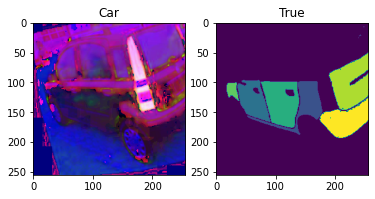

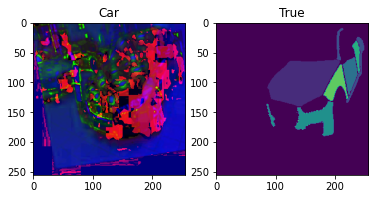

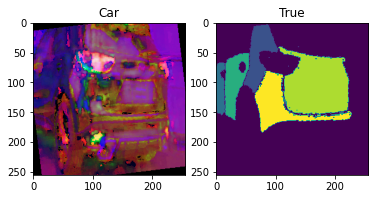

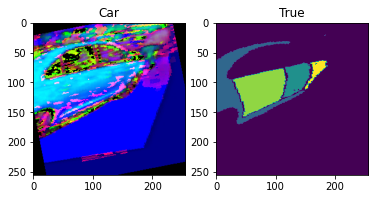

In [ ]:
#@title CarDataset train_loader, val_loader, test_loader
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
image_type ='HSV'
car_dataset1 = CarDataset(path1_tt, path2_tt,image_type, transform=False)
car_dataset2 = CarDataset(path1_tt, path2_tt,image_type, transform=True)
car_dataset3 = CarDataset(path1_tt, path2_tt,image_type, transform=True)
car_dataset4 = CarDataset(path1_tt, path2_tt,image_type, transform=True)
car_dataset5 = CarDataset(path1, path2,image_type, transform=False)
car_dataset6 = CarDataset(path1, path2,image_type, transform=True)

car_dataset = torch.utils.data.ConcatDataset((car_dataset1, car_dataset2,car_dataset3,car_dataset4,car_dataset5,car_dataset6))
print(car_dataset)

batch_size=16
dataset_size = len(car_dataset)
indices = list(range(dataset_size))
validation_split = .2
random_seed= 42
split = int(np.floor(validation_split * dataset_size))
shuffle_dataset = True

if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(car_dataset, batch_size=batch_size, 
                                           sampler=train_sampler)
val_loader = torch.utils.data.DataLoader(car_dataset, batch_size=batch_size,
                                                sampler=valid_sampler)

print(len(car_dataset))
for i in range(len(car_dataset)):
    a=random.randint(0,3100)
    print('a', a)
    sample = car_dataset[a]
    fig = plt.figure()
    ax = fig.add_subplot(1, 2, 1)
    imgplot = plt.imshow(sample['car'])
    ax.set_title('Car')
    ax = fig.add_subplot(1, 2, 2)
    imgplot = plt.imshow(sample['mask'])
    ax.set_title('True')
    print(a, sample['car'].shape, sample['mask'].shape)
    print(np.unique(sample['mask']))
    if i == 3:
        break


# Arquitecture and utils

In [ ]:
#@title DRN 
  
import torch.nn as nn
import math
import torch.utils.model_zoo as model_zoo


webroot = 'http://dl.yf.io/drn/'

model_urls = {
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'drn-c-26': webroot + 'drn_c_26-ddedf421.pth',
    'drn-c-42': webroot + 'drn_c_42-9d336e8c.pth',
    'drn-c-58': webroot + 'drn_c_58-0a53a92c.pth',
    'drn-d-22': webroot + 'drn_d_22-4bd2f8ea.pth',
    'drn-d-38': webroot + 'drn_d_38-eebb45f0.pth',
    'drn-d-54': webroot + 'drn_d_54-0e0534ff.pth',
    'drn-d-105': webroot + 'drn_d_105-12b40979.pth'}


def conv3x3(in_planes, out_planes, stride=1, padding=1, dilation=1):
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=padding, bias=False, dilation=dilation)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1, downsample=None,
                 dilation=(1, 1), residual=True, BatchNorm=None):
        super(BasicBlock, self).__init__()
        self.conv1 = conv3x3(inplanes, planes, stride,
                             padding=dilation[0], dilation=dilation[0])
        self.bn1 = BatchNorm(planes)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes,
                             padding=dilation[1], dilation=dilation[1])
        self.bn2 = BatchNorm(planes)
        self.downsample = downsample
        self.stride = stride
        self.residual = residual

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            residual = self.downsample(x)
        if self.residual:
            out += residual
        out = self.relu(out)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, downsample=None,
                 dilation=(1, 1), residual=True, BatchNorm=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = BatchNorm(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               padding=dilation[1], bias=False,
                               dilation=dilation[1])
        self.bn2 = BatchNorm(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = BatchNorm(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out


class DRN(nn.Module):

    def __init__(self, block, layers, arch='D',
                 channels=(16, 32, 64, 128, 256, 512, 512, 512),
                 BatchNorm=None):
        super(DRN, self).__init__()
        self.inplanes = channels[0]
        self.out_dim = channels[-1]
        self.arch = arch

        if arch == 'C':
            self.conv1 = nn.Conv2d(3, channels[0], kernel_size=7, stride=1,
                                   padding=3, bias=False)
            self.bn1 = BatchNorm(channels[0])
            self.relu = nn.ReLU(inplace=True)

            self.layer1 = self._make_layer(
                BasicBlock, channels[0], layers[0], stride=1, BatchNorm=BatchNorm)
            self.layer2 = self._make_layer(
                BasicBlock, channels[1], layers[1], stride=2, BatchNorm=BatchNorm)

        elif arch == 'D':
            self.layer0 = nn.Sequential(
                nn.Conv2d(3, channels[0], kernel_size=7, stride=1, padding=3,
                          bias=False),
                BatchNorm(channels[0]),
                nn.ReLU(inplace=True)
            )

            self.layer1 = self._make_conv_layers(
                channels[0], layers[0], stride=1, BatchNorm=BatchNorm)
            self.layer2 = self._make_conv_layers(
                channels[1], layers[1], stride=2, BatchNorm=BatchNorm)

        self.layer3 = self._make_layer(block, channels[2], layers[2], stride=2, BatchNorm=BatchNorm)
        self.layer4 = self._make_layer(block, channels[3], layers[3], stride=2, BatchNorm=BatchNorm)
        self.layer5 = self._make_layer(block, channels[4], layers[4],
                                       dilation=2, new_level=False, BatchNorm=BatchNorm)
        self.layer6 = None if layers[5] == 0 else \
            self._make_layer(block, channels[5], layers[5], dilation=4,
                             new_level=False, BatchNorm=BatchNorm)

        if arch == 'C':
            self.layer7 = None if layers[6] == 0 else \
                self._make_layer(BasicBlock, channels[6], layers[6], dilation=2,
                                 new_level=False, residual=False, BatchNorm=BatchNorm)
            self.layer8 = None if layers[7] == 0 else \
                self._make_layer(BasicBlock, channels[7], layers[7], dilation=1,
                                 new_level=False, residual=False, BatchNorm=BatchNorm)
        elif arch == 'D':
            self.layer7 = None if layers[6] == 0 else \
                self._make_conv_layers(channels[6], layers[6], dilation=2, BatchNorm=BatchNorm)
            self.layer8 = None if layers[7] == 0 else \
                self._make_conv_layers(channels[7], layers[7], dilation=1, BatchNorm=BatchNorm)

        self._init_weight()

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            #elif isinstance(m, SynchronizedBatchNorm2d):
                #m.weight.data.fill_(1)
                #m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()


    def _make_layer(self, block, planes, blocks, stride=1, dilation=1,
                    new_level=True, residual=True, BatchNorm=None):
        assert dilation == 1 or dilation % 2 == 0
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                BatchNorm(planes * block.expansion),
            )

        layers = list()
        layers.append(block(
            self.inplanes, planes, stride, downsample,
            dilation=(1, 1) if dilation == 1 else (
                dilation // 2 if new_level else dilation, dilation),
            residual=residual, BatchNorm=BatchNorm))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes, residual=residual,
                                dilation=(dilation, dilation), BatchNorm=BatchNorm))

        return nn.Sequential(*layers)

    def _make_conv_layers(self, channels, convs, stride=1, dilation=1, BatchNorm=None):
        modules = []
        for i in range(convs):
            modules.extend([
                nn.Conv2d(self.inplanes, channels, kernel_size=3,
                          stride=stride if i == 0 else 1,
                          padding=dilation, bias=False, dilation=dilation),
                BatchNorm(channels),
                nn.ReLU(inplace=True)])
            self.inplanes = channels
        return nn.Sequential(*modules)

    def forward(self, x):
        if self.arch == 'C':
            x = self.conv1(x)
            x = self.bn1(x)
            x = self.relu(x)
        elif self.arch == 'D':
            x = self.layer0(x)

        x = self.layer1(x)
        x = self.layer2(x)

        x = self.layer3(x)
        low_level_feat = x

        x = self.layer4(x)
        x = self.layer5(x)

        if self.layer6 is not None:
            x = self.layer6(x)

        if self.layer7 is not None:
            x = self.layer7(x)

        if self.layer8 is not None:
            x = self.layer8(x)

        return x, low_level_feat


class DRN_A(nn.Module):

    def __init__(self, block, layers, BatchNorm=None):
        self.inplanes = 64
        super(DRN_A, self).__init__()
        self.out_dim = 512 * block.expansion
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = BatchNorm(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(block, 64, layers[0], BatchNorm=BatchNorm)
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2, BatchNorm=BatchNorm)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=1,
                                       dilation=2, BatchNorm=BatchNorm)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=1,
                                       dilation=4, BatchNorm=BatchNorm)

        self._init_weight()

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            #elif isinstance(m, SynchronizedBatchNorm2d):
                #m.weight.data.fill_(1)
                #m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _make_layer(self, block, planes, blocks, stride=1, dilation=1, BatchNorm=None):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                BatchNorm(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, downsample, BatchNorm=BatchNorm))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes,
                                dilation=(dilation, dilation, ), BatchNorm=BatchNorm))

        return nn.Sequential(*layers)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        return x

#def drn_a_50(BatchNorm, pretrained=True):
#    model = DRN_A(Bottleneck, [3, 4, 6, 3], BatchNorm=BatchNorm)
 #   if pretrained:
#        model.load_state_dict(model_zoo.load_url(model_urls['resnet50']))
#    return model


def drn_c_26(BatchNorm, pretrained=True):
    model = DRN(BasicBlock, [1, 1, 2, 2, 2, 2, 1, 1], arch='C', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-c-26'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_c_42(BatchNorm, pretrained=True):
    model = DRN(BasicBlock, [1, 1, 3, 4, 6, 3, 1, 1], arch='C', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-c-42'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_c_58(BatchNorm, pretrained=True):
    model = DRN(Bottleneck, [1, 1, 3, 4, 6, 3, 1, 1], arch='C', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-c-58'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_d_22(BatchNorm, pretrained=True):
    model = DRN(BasicBlock, [1, 1, 2, 2, 2, 2, 1, 1], arch='D', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-d-22'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_d_24(BatchNorm, pretrained=True):
    model = DRN(BasicBlock, [1, 1, 2, 2, 2, 2, 2, 2], arch='D', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-d-24'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_d_38(BatchNorm, pretrained=True):
    model = DRN(BasicBlock, [1, 1, 3, 4, 6, 3, 1, 1], arch='D', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-d-38'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_d_40(BatchNorm, pretrained=True):
    model = DRN(BasicBlock, [1, 1, 3, 4, 6, 3, 2, 2], arch='D', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-d-40'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_d_54(BatchNorm, pretrained=True):
    model = DRN(Bottleneck, [1, 1, 3, 4, 6, 3, 1, 1], arch='D', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-d-54'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model


def drn_d_105(BatchNorm, pretrained=True):
    model = DRN(Bottleneck, [1, 1, 3, 4, 23, 3, 1, 1], arch='D', BatchNorm=BatchNorm)
    if pretrained:
        pretrained = model_zoo.load_url(model_urls['drn-d-105'])
        del pretrained['fc.weight']
        del pretrained['fc.bias']
        model.load_state_dict(pretrained)
    return model

if __name__ == "__main__":
    import torch
    model = drn_c_26(BatchNorm=nn.BatchNorm2d, pretrained=True)
    input = torch.rand(1, 3, 512, 512)
    output, low_level_feat = model(input)
    print(output.size())
    print(low_level_feat.size())

torch.Size([1, 512, 64, 64])
torch.Size([1, 64, 128, 128])


In [ ]:
#@title Mobilenet

import torch
import torch.nn.functional as F
import torch.nn as nn
import math
#from modeling.sync_batchnorm.batchnorm import SynchronizedBatchNorm2d
import torch.utils.model_zoo as model_zoo

def conv_bn(inp, oup, stride, BatchNorm):
    return nn.Sequential(
        nn.Conv2d(inp, oup, 3, stride, 1, bias=False),
        BatchNorm(oup),
        nn.ReLU6(inplace=True)
    )


def fixed_padding(inputs, kernel_size, dilation):
    kernel_size_effective = kernel_size + (kernel_size - 1) * (dilation - 1)
    pad_total = kernel_size_effective - 1
    pad_beg = pad_total // 2
    pad_end = pad_total - pad_beg
    padded_inputs = F.pad(inputs, (pad_beg, pad_end, pad_beg, pad_end))
    return padded_inputs


class InvertedResidual(nn.Module):
    def __init__(self, inp, oup, stride, dilation, expand_ratio, BatchNorm):
        super(InvertedResidual, self).__init__()
        self.stride = stride
        assert stride in [1, 2]

        hidden_dim = round(inp * expand_ratio)
        self.use_res_connect = self.stride == 1 and inp == oup
        self.kernel_size = 3
        self.dilation = dilation

        if expand_ratio == 1:
            self.conv = nn.Sequential(
                # dw
                nn.Conv2d(hidden_dim, hidden_dim, 3, stride, 0, dilation, groups=hidden_dim, bias=False),
                BatchNorm(hidden_dim),
                nn.ReLU6(inplace=True),
                # pw-linear
                nn.Conv2d(hidden_dim, oup, 1, 1, 0, 1, 1, bias=False),
                BatchNorm(oup),
            )
        else:
            self.conv = nn.Sequential(
                # pw
                nn.Conv2d(inp, hidden_dim, 1, 1, 0, 1, bias=False),
                BatchNorm(hidden_dim),
                nn.ReLU6(inplace=True),
                # dw
                nn.Conv2d(hidden_dim, hidden_dim, 3, stride, 0, dilation, groups=hidden_dim, bias=False),
                BatchNorm(hidden_dim),
                nn.ReLU6(inplace=True),
                # pw-linear
                nn.Conv2d(hidden_dim, oup, 1, 1, 0, 1, bias=False),
                BatchNorm(oup),
            )

    def forward(self, x):
        x_pad = fixed_padding(x, self.kernel_size, dilation=self.dilation)
        if self.use_res_connect:
            x = x + self.conv(x_pad)
        else:
            x = self.conv(x_pad)
        return x


class MobileNetV2(nn.Module):
    def __init__(self, output_stride=8, BatchNorm=None, width_mult=1., pretrained=True):
        super(MobileNetV2, self).__init__()
        block = InvertedResidual
        input_channel = 32
        current_stride = 1
        rate = 1
        interverted_residual_setting = [
            # t, c, n, s
            [1, 16, 1, 1],
            [6, 24, 2, 2],
            [6, 32, 3, 2],
            [6, 64, 4, 2],
            [6, 96, 3, 1],
            [6, 160, 3, 2],
            [6, 320, 1, 1],
        ]

        # building first layer
        input_channel = int(input_channel * width_mult)
        self.features = [conv_bn(3, input_channel, 2, BatchNorm)]
        current_stride *= 2
        # building inverted residual blocks
        for t, c, n, s in interverted_residual_setting:
            if current_stride == output_stride:
                stride = 1
                dilation = rate
                rate *= s
            else:
                stride = s
                dilation = 1
                current_stride *= s
            output_channel = int(c * width_mult)
            for i in range(n):
                if i == 0:
                    self.features.append(block(input_channel, output_channel, stride, dilation, t, BatchNorm))
                else:
                    self.features.append(block(input_channel, output_channel, 1, dilation, t, BatchNorm))
                input_channel = output_channel
        self.features = nn.Sequential(*self.features)
        self._initialize_weights()

        if pretrained:
            self._load_pretrained_model()

        self.low_level_features = self.features[0:4]
        self.high_level_features = self.features[4:]

    def forward(self, x):
        low_level_feat = self.low_level_features(x)
        x = self.high_level_features(low_level_feat)
        return x, low_level_feat

    def _load_pretrained_model(self):
        pretrain_dict = model_zoo.load_url('http://jeff95.me/models/mobilenet_v2-6a65762b.pth')
        model_dict = {}
        state_dict = self.state_dict()
        for k, v in pretrain_dict.items():
            if k in state_dict:
                model_dict[k] = v
        state_dict.update(model_dict)
        self.load_state_dict(state_dict)

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                # n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                # m.weight.data.normal_(0, math.sqrt(2. / n))
                torch.nn.init.kaiming_normal_(m.weight)
 #           elif isinstance(m, SynchronizedBatchNorm2d):
  #              m.weight.data.fill_(1)
  #              m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

if __name__ == "__main__":
    input = torch.rand(1, 3, 512, 512)
    model = MobileNetV2(output_stride=16, BatchNorm=nn.BatchNorm2d)
    output, low_level_feat = model(input)
    print(output.size())
    print(low_level_feat.size())

torch.Size([1, 320, 32, 32])
torch.Size([1, 24, 128, 128])


In [ ]:
#@title Resnet

import math
import torch.nn as nn
import torch.utils.model_zoo as model_zoo
#from modeling.sync_batchnorm.batchnorm import SynchronizedBatchNorm2d

class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1, dilation=1, downsample=None, BatchNorm=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inplanes, planes, kernel_size=1, bias=False)
        self.bn1 = BatchNorm(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride,
                               dilation=dilation, padding=dilation, bias=False)
        self.bn2 = BatchNorm(planes)
        self.conv3 = nn.Conv2d(planes, planes * 4, kernel_size=1, bias=False)
        self.bn3 = BatchNorm(planes * 4)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride
        self.dilation = dilation

    def forward(self, x):
        residual = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            residual = self.downsample(x)

        out += residual
        out = self.relu(out)

        return out

class ResNet(nn.Module):

    def __init__(self, block, layers, output_stride, BatchNorm, pretrained=True):
        self.inplanes = 64
        super(ResNet, self).__init__()
        blocks = [1, 2, 4]
        if output_stride == 16:
            strides = [1, 2, 2, 1]
            dilations = [1, 1, 1, 2]
        elif output_stride == 8:
            strides = [1, 2, 1, 1]
            dilations = [1, 1, 2, 4]
        else:
            raise NotImplementedError

        # Modules
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                                bias=False)
        self.bn1 = BatchNorm(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.layer1 = self._make_layer(block, 64, layers[0], stride=strides[0], dilation=dilations[0], BatchNorm=BatchNorm)
        self.layer2 = self._make_layer(block, 128, layers[1], stride=strides[1], dilation=dilations[1], BatchNorm=BatchNorm)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=strides[2], dilation=dilations[2], BatchNorm=BatchNorm)
        self.layer4 = self._make_MG_unit(block, 512, blocks=blocks, stride=strides[3], dilation=dilations[3], BatchNorm=BatchNorm)
        # self.layer4 = self._make_layer(block, 512, layers[3], stride=strides[3], dilation=dilations[3], BatchNorm=BatchNorm)
        self._init_weight()

        if pretrained:
            self._load_pretrained_model()

    def _make_layer(self, block, planes, blocks, stride=1, dilation=1, BatchNorm=None):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                BatchNorm(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, dilation, downsample, BatchNorm))
        self.inplanes = planes * block.expansion
        for i in range(1, blocks):
            layers.append(block(self.inplanes, planes, dilation=dilation, BatchNorm=BatchNorm))

        return nn.Sequential(*layers)

    def _make_MG_unit(self, block, planes, blocks, stride=1, dilation=1, BatchNorm=None):
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                BatchNorm(planes * block.expansion),
            )

        layers = []
        layers.append(block(self.inplanes, planes, stride, dilation=blocks[0]*dilation,
                            downsample=downsample, BatchNorm=BatchNorm))
        self.inplanes = planes * block.expansion
        for i in range(1, len(blocks)):
            layers.append(block(self.inplanes, planes, stride=1,
                                dilation=blocks[i]*dilation, BatchNorm=BatchNorm))

        return nn.Sequential(*layers)

    def forward(self, input):
        x = self.conv1(input)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        low_level_feat = x
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        return x, low_level_feat

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            #elif isinstance(m, SynchronizedBatchNorm2d):
           #     m.weight.data.fill_(1)
            #    m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def _load_pretrained_model(self):
        pretrain_dict = model_zoo.load_url('https://download.pytorch.org/models/resnet101-5d3b4d8f.pth')
        model_dict = {}
        state_dict = self.state_dict()
        for k, v in pretrain_dict.items():
            if k in state_dict:
                model_dict[k] = v
        state_dict.update(model_dict)
        self.load_state_dict(state_dict)

def ResNet101(output_stride, BatchNorm, pretrained=True):
    """Constructs a ResNet-101 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNet(Bottleneck, [3, 4, 23, 3], output_stride, BatchNorm, pretrained=pretrained)
    return model

if __name__ == "__main__":
    import torch
    model = ResNet101(BatchNorm=nn.BatchNorm2d, pretrained=True, output_stride=8)
    input = torch.rand(1, 3, 512, 512)
    output, low_level_feat = model(input)
    print(output.size())
    print(low_level_feat.size())

torch.Size([1, 2048, 64, 64])
torch.Size([1, 256, 128, 128])


In [ ]:
#@title Xception
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo



def fixed_padding(inputs, kernel_size, dilation):
    kernel_size_effective = kernel_size + (kernel_size - 1) * (dilation - 1)
    pad_total = kernel_size_effective - 1
    pad_beg = pad_total // 2
    pad_end = pad_total - pad_beg
    padded_inputs = F.pad(inputs, (pad_beg, pad_end, pad_beg, pad_end))
    return padded_inputs


class SeparableConv2d(nn.Module):
    def __init__(self, inplanes, planes, kernel_size=3, stride=1, dilation=1, bias=False, BatchNorm=None):
        super(SeparableConv2d, self).__init__()

        self.conv1 = nn.Conv2d(inplanes, inplanes, kernel_size, stride, 0, dilation,
                               groups=inplanes, bias=bias)
        self.bn = BatchNorm(inplanes)
        self.pointwise = nn.Conv2d(inplanes, planes, 1, 1, 0, 1, 1, bias=bias)

    def forward(self, x):
        x = fixed_padding(x, self.conv1.kernel_size[0], dilation=self.conv1.dilation[0])
        x = self.conv1(x)
        x = self.bn(x)
        x = self.pointwise(x)
        return x


class Block(nn.Module):
    def __init__(self, inplanes, planes, reps, stride=1, dilation=1, BatchNorm=None,
                 start_with_relu=True, grow_first=True, is_last=False):
        super(Block, self).__init__()

        if planes != inplanes or stride != 1:
            self.skip = nn.Conv2d(inplanes, planes, 1, stride=stride, bias=False)
            self.skipbn = BatchNorm(planes)
        else:
            self.skip = None

        self.relu = nn.ReLU(inplace=True)
        rep = []

        filters = inplanes
        if grow_first:
            rep.append(self.relu)
            rep.append(SeparableConv2d(inplanes, planes, 3, 1, dilation, BatchNorm=BatchNorm))
            rep.append(BatchNorm(planes))
            filters = planes

        for i in range(reps - 1):
            rep.append(self.relu)
            rep.append(SeparableConv2d(filters, filters, 3, 1, dilation, BatchNorm=BatchNorm))
            rep.append(BatchNorm(filters))

        if not grow_first:
            rep.append(self.relu)
            rep.append(SeparableConv2d(inplanes, planes, 3, 1, dilation, BatchNorm=BatchNorm))
            rep.append(BatchNorm(planes))

        if stride != 1:
            rep.append(self.relu)
            rep.append(SeparableConv2d(planes, planes, 3, 2, BatchNorm=BatchNorm))
            rep.append(BatchNorm(planes))

        if stride == 1 and is_last:
            rep.append(self.relu)
            rep.append(SeparableConv2d(planes, planes, 3, 1, BatchNorm=BatchNorm))
            rep.append(BatchNorm(planes))

        if not start_with_relu:
            rep = rep[1:]

        self.rep = nn.Sequential(*rep)

    def forward(self, inp):
        x = self.rep(inp)

        if self.skip is not None:
            skip = self.skip(inp)
            skip = self.skipbn(skip)
        else:
            skip = inp

        x = x + skip

        return x


class AlignedXception(nn.Module):
    """
    Modified Alighed Xception
    """
    def __init__(self, output_stride, pretrained=True):
        super(AlignedXception, self).__init__()

        if output_stride == 16:
            entry_block3_stride = 2
            middle_block_dilation = 1
            exit_block_dilations = (1, 2)
        elif output_stride == 8:
            entry_block3_stride = 1
            middle_block_dilation = 2
            exit_block_dilations = (2, 4)
        else:
            raise NotImplementedError


        # Entry flow
        BatchNorm=nn.BatchNorm2d
        self.conv1 = nn.Conv2d(3, 32, 3, stride=2, padding=1, bias=False)
        self.bn1 = BatchNorm(32)
        self.relu = nn.ReLU(inplace=True)

        self.conv2 = nn.Conv2d(32, 64, 3, stride=1, padding=1, bias=False)
        self.bn2 = BatchNorm(64)

        self.block1 = Block(64, 128, reps=2, stride=2, BatchNorm=BatchNorm, start_with_relu=False)
        self.block2 = Block(128, 256, reps=2, stride=2, BatchNorm=BatchNorm, start_with_relu=False,
                            grow_first=True)
        self.block3 = Block(256, 728, reps=2, stride=entry_block3_stride, BatchNorm=BatchNorm,
                            start_with_relu=True, grow_first=True, is_last=True)

        # Middle flow
        self.block4  = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block5  = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block6  = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block7  = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block8  = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block9  = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block10 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block11 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block12 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block13 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block14 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block15 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block16 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block17 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block18 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)
        self.block19 = Block(728, 728, reps=3, stride=1, dilation=middle_block_dilation,
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=True)

        # Exit flow
        self.block20 = Block(728, 1024, reps=2, stride=1, dilation=exit_block_dilations[0],
                             BatchNorm=BatchNorm, start_with_relu=True, grow_first=False, is_last=True)

        self.conv3 = SeparableConv2d(1024, 1536, 3, stride=1, dilation=exit_block_dilations[1], BatchNorm=BatchNorm)
        self.bn3 = BatchNorm(1536)

        self.conv4 = SeparableConv2d(1536, 1536, 3, stride=1, dilation=exit_block_dilations[1], BatchNorm=BatchNorm)
        self.bn4 = BatchNorm(1536)

        self.conv5 = SeparableConv2d(1536, 2048, 3, stride=1, dilation=exit_block_dilations[1], BatchNorm=BatchNorm)
        self.bn5 = BatchNorm(2048)

        self.conv6 = SeparableConv2d(2048, 512, 3, stride=1, dilation=exit_block_dilations[1], BatchNorm=BatchNorm)
        self.bn6 = BatchNorm(512)


        # Init weights
        self._init_weight()

        # Load pretrained model
        if pretrained:
            self._load_pretrained_model()

    def forward(self, x):
        # Entry flow
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        x = self.block1(x)
        # add relu here
        x = self.relu(x)
        low_level_feat = x
        x = self.block2(x)
        x = self.block3(x)

        # Middle flow
        x = self.block4(x)
        x = self.block5(x)
        x = self.block6(x)
        x = self.block7(x)
        x = self.block8(x)
        x = self.block9(x)
        x = self.block10(x)
        x = self.block11(x)
        x = self.block12(x)
        x = self.block13(x)
        x = self.block14(x)
        x = self.block15(x)
        x = self.block16(x)
        x = self.block17(x)
        x = self.block18(x)
        x = self.block19(x)

        # Exit flow
        x = self.block20(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.bn3(x)
        x = self.relu(x)

        x = self.conv4(x)
        x = self.bn4(x)
        x = self.relu(x)

        x = self.conv5(x)
        x = self.bn5(x)
        x = self.relu(x)
        x = self.conv6(x)
        x = self.bn6(x)
        x = self.relu(x)

        return x, low_level_feat

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()


    def _load_pretrained_model(self):
        pretrain_dict = model_zoo.load_url('http://data.lip6.fr/cadene/pretrainedmodels/xception-b5690688.pth')
        model_dict = {}
        state_dict = self.state_dict()

        for k, v in pretrain_dict.items():
            if k in state_dict:
                if 'pointwise' in k:
                    v = v.unsqueeze(-1).unsqueeze(-1)
                if k.startswith('block11'):
                    model_dict[k] = v
                    model_dict[k.replace('block11', 'block12')] = v
                    model_dict[k.replace('block11', 'block13')] = v
                    model_dict[k.replace('block11', 'block14')] = v
                    model_dict[k.replace('block11', 'block15')] = v
                    model_dict[k.replace('block11', 'block16')] = v
                    model_dict[k.replace('block11', 'block17')] = v
                    model_dict[k.replace('block11', 'block18')] = v
                    model_dict[k.replace('block11', 'block19')] = v
                elif k.startswith('block12'):
                    model_dict[k.replace('block12', 'block20')] = v
                elif k.startswith('bn3'):
                    model_dict[k] = v
                    model_dict[k.replace('bn3', 'bn4')] = v
                elif k.startswith('conv4'):
                    model_dict[k.replace('conv4', 'conv5')] = v
                elif k.startswith('bn4'):
                    model_dict[k.replace('bn4', 'bn5')] = v
                else:
                    model_dict[k] = v
        state_dict.update(model_dict)
        self.load_state_dict(state_dict)



if __name__ == "__main__":
    import torch
    model = AlignedXception(output_stride=16)
    input = torch.rand(1, 3, 256, 256)
    output, low_level_feat = model(input)
    print(output.size())
    print(low_level_feat.size())

torch.Size([1, 512, 16, 16])
torch.Size([1, 128, 64, 64])


In [ ]:
#@title ASPP

import math
import torch
import torch.nn as nn
import torch.nn.functional as F
#from modeling.sync_batchnorm.batchnorm import SynchronizedBatchNorm2d

class _ASPPModule(nn.Module):
    def __init__(self, inplanes, planes, kernel_size, padding, dilation, BatchNorm):
        super(_ASPPModule, self).__init__()
        self.atrous_conv = nn.Conv2d(inplanes, planes, kernel_size=kernel_size,
                                            stride=1, padding=padding, dilation=dilation, bias=False)
        self.bn = BatchNorm(planes)
        self.relu = nn.ReLU()

        self._init_weight()

    def forward(self, x):
        x = self.atrous_conv(x)
        x = self.bn(x)

        return self.relu(x)

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight)
            #elif isinstance(m, SynchronizedBatchNorm2d):
             #   m.weight.data.fill_(1)
              #  m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

class ASPP(nn.Module):
    def __init__(self, backbone, output_stride, BatchNorm):
        super(ASPP, self).__init__()
        if backbone == 'drn':
            inplanes = 512
        elif backbone == 'mobilenet':
            inplanes = 320
        else:
            inplanes = 2048
        if output_stride == 16:
            dilations = [1, 6, 12, 18]
        elif output_stride == 8:
            dilations = [1, 12, 24, 36]
        else:
            raise NotImplementedError

        self.aspp1 = _ASPPModule(inplanes, 256, 1, padding=0, dilation=dilations[0], BatchNorm=BatchNorm)
        self.aspp2 = _ASPPModule(inplanes, 256, 3, padding=dilations[1], dilation=dilations[1], BatchNorm=BatchNorm)
        self.aspp3 = _ASPPModule(inplanes, 256, 3, padding=dilations[2], dilation=dilations[2], BatchNorm=BatchNorm)
        self.aspp4 = _ASPPModule(inplanes, 256, 3, padding=dilations[3], dilation=dilations[3], BatchNorm=BatchNorm)

        self.global_avg_pool = nn.Sequential(nn.AdaptiveAvgPool2d((1, 1)),
                                             nn.Conv2d(inplanes, 256, 1, stride=1, bias=False),
                                             BatchNorm(256),
                                             nn.ReLU())
        self.conv1 = nn.Conv2d(1280, 256, 1, bias=False)
        self.bn1 = BatchNorm(256)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)
        self._init_weight()

    def forward(self, x):
        x1 = self.aspp1(x)
        x2 = self.aspp2(x)
        x3 = self.aspp3(x)
        x4 = self.aspp4(x)
        x5 = self.global_avg_pool(x)
        x5 = F.interpolate(x5, size=x4.size()[2:], mode='bilinear', align_corners=True)
        x = torch.cat((x1, x2, x3, x4, x5), dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        return self.dropout(x)

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                # n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                # m.weight.data.normal_(0, math.sqrt(2. / n))
                torch.nn.init.kaiming_normal_(m.weight)
            #elif isinstance(m, SynchronizedBatchNorm2d):
                #m.weight.data.fill_(1)
               # m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()


def build_aspp(backbone, output_stride, BatchNorm):
    return ASPP(backbone, output_stride, BatchNorm)

In [ ]:
#@title Decoder

import math
import torch
import torch.nn as nn
import torch.nn.functional as F
#from modeling.sync_batchnorm.batchnorm import SynchronizedBatchNorm2d

class Decoder(nn.Module):
    def __init__(self, num_classes, backbone, BatchNorm):
        super(Decoder, self).__init__()
        if backbone == 'resnet':
            low_level_inplanes = 256
        elif backbone == 'drn':
            low_level_inplanes = 64 
        elif backbone == 'xception':
            low_level_inplanes = 128
        elif backbone == 'mobilenet':
            low_level_inplanes = 24
        else:
            raise NotImplementedError

        self.conv1 = nn.Conv2d(low_level_inplanes, 48, 1, bias=False)
        self.bn1 = BatchNorm(48)
        self.relu = nn.ReLU()
        self.last_conv = nn.Sequential(nn.Conv2d(304, 256, kernel_size=3, stride=1, padding=1, bias=False),
                                       BatchNorm(256),
                                       nn.ReLU(),
                                       nn.Dropout(0.5),
                                       nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=False),
                                       BatchNorm(256),
                                       nn.ReLU(),
                                       nn.Dropout(0.1),
                                       nn.Conv2d(256, num_classes, kernel_size=1, stride=1))
        self._init_weight()


    def forward(self, x, low_level_feat):
        low_level_feat = self.conv1(low_level_feat)
        low_level_feat = self.bn1(low_level_feat)
        low_level_feat = self.relu(low_level_feat)

        x = F.interpolate(x, size=low_level_feat.size()[2:], mode='bilinear', align_corners=True)
        x = torch.cat((x, low_level_feat), dim=1)
        x = self.last_conv(x)

        return x

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight)
            #elif isinstance(m, SynchronizedBatchNorm2d):
             #   m.weight.data.fill_(1)
              #  m.bias.data.zero_()
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

def build_decoder(num_classes, backbone, BatchNorm):
    return Decoder(num_classes, backbone, BatchNorm)

In [ ]:
#@title Build backbone

def build_backbone(backbone, output_stride, BatchNorm):
    if backbone == 'resnet':
        return ResNet101(output_stride, BatchNorm)
    elif backbone == 'xception':
        return AlignedXception(output_stride, BatchNorm)
    elif backbone == 'drn':
        return drn_d_38(BatchNorm=nn.BatchNorm2d,  pretrained=True)
    elif backbone == 'mobilenet':
        return MobileNetV2(output_stride, BatchNorm)
    else:
        raise NotImplementedError

In [ ]:
#@title DeepLab

import torch
import torch.nn as nn
import torch.nn.functional as F
#from modeling.sync_batchnorm.batchnorm import SynchronizedBatchNorm2d
#from modeling.aspp import build_aspp
#from modeling.decoder import build_decoder
#from modeling.backbone import build_backbone

class DeepLab(nn.Module):
    def __init__(self, backbone='resnet', output_stride=8, num_classes=21,
                 sync_bn=True, freeze_bn=False):
        super(DeepLab, self).__init__()
        if backbone == 'drn':
            output_stride = 8

        #if sync_bn == True:
           # BatchNorm = SynchronizedBatchNorm2d
        #else:
            #BatchNorm = nn.BatchNorm2d

        BatchNorm = nn.BatchNorm2d

        self.backbone = build_backbone(backbone, output_stride, BatchNorm)
        self.aspp = build_aspp(backbone, output_stride, BatchNorm)
        self.decoder = build_decoder(num_classes, backbone, BatchNorm)

        self.freeze_bn = freeze_bn

    def forward(self, input):

        input=input.type(torch.cuda.FloatTensor)
        x, low_level_feat = self.backbone(input)
        x = self.aspp(x)
        x = self.decoder(x, low_level_feat)
        x = F.interpolate(x, size=input.size()[2:], mode='bilinear', align_corners=True)

        return x

    def freeze_bn(self):
        for m in self.modules():
            m.eval()
            #if isinstance(m, SynchronizedBatchNorm2d):
                #m.eval()
            #elif isinstance(m, nn.BatchNorm2d):
                #m.eval()

    def get_1x_lr_params(self):
        modules = [self.backbone]
        for i in range(len(modules)):
            for m in modules[i].named_modules():
                if self.freeze_bn:
                    if isinstance(m[1], nn.Conv2d):
                        for p in m[1].parameters():
                            if p.requires_grad:
                                yield p
                else:
                  if isinstance(m[1], nn.Conv2d) or isinstance(m[1], nn.BatchNorm2d):       
                    #if isinstance(m[1], nn.Conv2d) or isinstance(m[1], SynchronizedBatchNorm2d) \
                            #or isinstance(m[1], nn.BatchNorm2d):
                        for p in m[1].parameters():
                            if p.requires_grad:
                                yield p

    def get_10x_lr_params(self):
        modules = [self.aspp, self.decoder]
        for i in range(len(modules)):
            for m in modules[i].named_modules():
                if self.freeze_bn:
                    if isinstance(m[1], nn.Conv2d):
                        for p in m[1].parameters():
                            if p.requires_grad:
                                yield p
                else:
                    if isinstance(m[1], nn.Conv2d) or isinstance(m[1], nn.BatchNorm2d):        
                    #if isinstance(m[1], nn.Conv2d) or isinstance(m[1], SynchronizedBatchNorm2d) \
                        #    or isinstance(m[1], nn.BatchNorm2d):
                        for p in m[1].parameters():
                            if p.requires_grad:
                                yield p

#if __name__ == "__main__":
#    model = DeepLab(backbone='drn', output_stride=16).cuda()
#    model.eval()
#    input = torch.rand(1, 3, 400, 400)
#    input=Variable(input.type(torch.cuda.FloatTensor)).cuda()
   
#    output = model(input)
#    print(output.size())


In [ ]:
#@title losses

import torch
import torch.nn as nn

class SegmentationLosses(object):
    def __init__(self, weight=None, size_average=True, batch_average=False, ignore_index=255, cuda=False):
        self.ignore_index = ignore_index
        self.weight = weight
        self.size_average = size_average
        self.batch_average = batch_average
        self.cuda = cuda

    def build_loss(self, mode='ce'):
        """Choices: ['ce' or 'focal']"""
        if mode == 'ce':
            return self.CrossEntropyLoss
        elif mode == 'focal':
            return self.FocalLoss
        else:
            raise NotImplementedError

    def CrossEntropyLoss(self, logit, target):
        n, c, h, w = logit.size()
        criterion = nn.CrossEntropyLoss(weight=self.weight, ignore_index=self.ignore_index,
                                        size_average=self.size_average)
        if self.cuda:
            criterion = criterion.cuda()

        loss = criterion(logit, target.long())
        print(loss)

        if self.batch_average:
            loss /= n

        return loss

    def FocalLoss(self, logit, target, gamma=2, alpha=0.5):
        n, c, h, w = logit.size()
        criterion = nn.CrossEntropyLoss(weight=self.weight, ignore_index=self.ignore_index,
                                        size_average=self.size_average)
        if self.cuda:
            criterion = criterion.cuda()

        logpt = -criterion(logit, target.long())
        pt = torch.exp(logpt)
        if alpha is not None:
            logpt *= alpha
        loss = -((1 - pt) ** gamma) * logpt

        if self.batch_average:
            loss /= n

        return loss

if __name__ == "__main__":
    loss = SegmentationLosses(cuda=True)
    a = torch.rand(4, 3, 7, 7).cuda()
    b = torch.rand(4, 7, 7).cuda()
    print(loss.CrossEntropyLoss(a, b))
    print(loss.FocalLoss(a, b.type(torch.cuda.LongTensor), gamma=0, alpha=None))
    print(loss.FocalLoss(a, b.type(torch.cuda.LongTensor), gamma=2, alpha=0.5).item())
    loss_fn = nn.CrossEntropyLoss().cuda()
    xx=loss_fn(a,b.type(torch.cuda.LongTensor))
    print(xx)



tensor(1.1031, device='cuda:0')
tensor(1.1031, device='cuda:0')
tensor(1.1031, device='cuda:0')
0.24621246755123138
tensor(1.1031, device='cuda:0')


/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:44: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
#@title ND Crossentropy
from scipy.ndimage import distance_transform_edt
class CrossentropyND(torch.nn.CrossEntropyLoss):
    """
    Network has to have NO NONLINEARITY!
    """
    def forward(self, inp, target):
        target = target.long()
        num_classes = inp.size()[1]

        i0 = 1
        i1 = 2

        while i1 < len(inp.shape): # this is ugly but torch only allows to transpose two axes at once
            inp = inp.transpose(i0, i1)
            i0 += 1
            i1 += 1

        inp = inp.contiguous()
        inp = inp.view(-1, num_classes)

        target = target.view(-1,)

        return super(CrossentropyND, self).forward(inp, target)

class TopKLoss(CrossentropyND):
    """
    Network has to have NO LINEARITY!
    """
    def __init__(self, weight=None, ignore_index=-100, k=10):
        self.k = k
        super(TopKLoss, self).__init__(weight, False, ignore_index, reduce=False)

    def forward(self, inp, target):
        target = target[:, 0].long()
        res = super(TopKLoss, self).forward(inp, target)
        num_voxels = np.prod(res.shape)
        res, _ = torch.topk(res.view((-1, )), int(num_voxels * self.k / 100), sorted=False)
        return res.mean()


class WeightedCrossEntropyLoss(torch.nn.CrossEntropyLoss):
    """
    Network has to have NO NONLINEARITY!
    """
    def __init__(self, weight=None):
        super(WeightedCrossEntropyLoss, self).__init__()
        self.weight = weight

    def forward(self, inp, target):
        target = target.long()
        num_classes = inp.size()[1]

        i0 = 1
        i1 = 2

        while i1 < len(inp.shape): # this is ugly but torch only allows to transpose two axes at once
            inp = inp.transpose(i0, i1)
            i0 += 1
            i1 += 1

        inp = inp.contiguous()
        inp = inp.view(-1, num_classes)

        target = target.view(-1,)
        wce_loss = torch.nn.CrossEntropyLoss(weight=self.weight)

        return wce_loss(inp, target)

class WeightedCrossEntropyLossV2(torch.nn.Module):
    """
    WeightedCrossEntropyLoss (WCE) as described in https://arxiv.org/pdf/1707.03237.pdf
    Network has to have NO LINEARITY!
    copy from: https://github.com/wolny/pytorch-3dunet/blob/6e5a24b6438f8c631289c10638a17dea14d42051/unet3d/losses.py#L121
    """

    def forward(self, net_output, gt):
        # compute weight
        # shp_x = net_output.shape
        # shp_y = gt.shape
        # print(shp_x, shp_y)
        # with torch.no_grad():
        #     if len(shp_x) != len(shp_y):
        #         gt = gt.view((shp_y[0], 1, *shp_y[1:]))

        #     if all([i == j for i, j in zip(net_output.shape, gt.shape)]):
        #         # if this is the case then gt is probably already a one hot encoding
        #         y_onehot = gt
        #     else:
        #         gt = gt.long()
        #         y_onehot = torch.zeros(shp_x)
        #         if net_output.device.type == "cuda":
        #             y_onehot = y_onehot.cuda(net_output.device.index)
        #         y_onehot.scatter_(1, gt, 1)
        # y_onehot = y_onehot.transpose(0,1).contiguous()
        # class_weights = (torch.einsum("cbxyz->c", y_onehot).type(torch.float32) + 1e-10)/torch.numel(y_onehot)
        # print('class_weights', class_weights)
        # class_weights = class_weights.view(-1)
        class_weights = torch.cuda.FloatTensor([0.2,0.8])
        gt = gt.long()
        num_classes = net_output.size()[1]
        # class_weights = self._class_weights(inp)

        i0 = 1
        i1 = 2

        while i1 < len(net_output.shape): # this is ugly but torch only allows to transpose two axes at once
            net_output = net_output.transpose(i0, i1)
            i0 += 1
            i1 += 1

        net_output = net_output.contiguous()
        net_output = net_output.view(-1, num_classes) #shape=(vox_num, class_num)

        gt = gt.view(-1,)
        # print('*'*20)
        return F.cross_entropy(net_output, gt) # , weight=class_weights

    # @staticmethod
    # def _class_weights(input):
    #     # normalize the input first
    #     input = F.softmax(input, _stacklevel=5)
    #     flattened = flatten(input)
    #     nominator = (1. - flattened).sum(-1)
    #     denominator = flattened.sum(-1)
    #     class_weights = Variable(nominator / denominator, requires_grad=False)
    #     return class_weights

def flatten(tensor):
    """Flattens a given tensor such that the channel axis is first.
    The shapes are transformed as follows:
       (N, C, D, H, W) -> (C, N * D * H * W)
    """
    C = tensor.size(1)
    # new axis order
    axis_order = (1, 0) + tuple(range(2, tensor.dim()))
    # Transpose: (N, C, D, H, W) -> (C, N, D, H, W)
    transposed = tensor.permute(axis_order)
    # Flatten: (C, N, D, H, W) -> (C, N * D * H * W)
    transposed = transposed.contiguous()
    return transposed.view(C, -1)

def compute_edts_forPenalizedLoss(GT):
    """
    GT.shape = (batch_size, x,y,z)
    only for binary segmentation
    """
    GT = np.squeeze(GT)
    res = np.zeros(GT.shape)
    for i in range(GT.shape[0]):
        posmask = GT[i]
        negmask = ~posmask
        pos_edt = distance_transform_edt(posmask)
        pos_edt = (np.max(pos_edt)-pos_edt)*posmask 
        neg_edt =  distance_transform_edt(negmask)
        neg_edt = (np.max(neg_edt)-neg_edt)*negmask        
        res[i] = pos_edt/np.max(pos_edt) + neg_edt/np.max(neg_edt)
    return res

class DisPenalizedCE(torch.nn.Module):
    """
    Only for binary 3D segmentation
    Network has to have NO NONLINEARITY!
    """

    def forward(self, inp, target):
        # print(inp.shape, target.shape) # (batch, 2, xyz), (batch, 2, xyz)
        # compute distance map of ground truth
        with torch.no_grad():
            dist = compute_edts_forPenalizedLoss(target.cpu().numpy()>0.5) + 1.0
        
        dist = torch.from_numpy(dist)
        if dist.device != inp.device:
            dist = dist.to(inp.device).type(torch.float32)
        dist = dist.view(-1,)

        target = target.long()
        num_classes = inp.size()[1]

        i0 = 1
        i1 = 2

        while i1 < len(inp.shape): # this is ugly but torch only allows to transpose two axes at once
            inp = inp.transpose(i0, i1)
            i0 += 1
            i1 += 1

        inp = inp.contiguous()
        inp = inp.view(-1, num_classes)
        log_sm = torch.nn.LogSoftmax(dim=1)
        inp_logs = log_sm(inp)

        target = target.view(-1,)
        # loss = nll_loss(inp_logs, target)
        loss = -inp_logs[range(target.shape[0]), target]
        # print(loss.type(), dist.type())
        weighted_loss = loss*dist

        return loss.mean()



if __name__ == "__main__":
    loss = CrossentropyND()
    a = torch.rand(4, 3, 7, 7).cuda()
    b = torch.rand(4, 7, 7).cuda()
    print(loss.forward(a, b))

    loss = WeightedCrossEntropyLossV2()
    a = torch.rand(4, 3, 7, 7).cuda()
    b = torch.rand(4, 7, 7).cuda()
    print(loss.forward(a, b))

    loss = DisPenalizedCE()
    a = torch.rand(4, 3, 7, 7).cuda()
    b = torch.rand(4, 7, 7).cuda()
    print(loss.forward(a, b))


    loss_fn = nn.CrossEntropyLoss().cuda()
    xx=loss_fn(a,b.type(torch.cuda.LongTensor))
    print(xx)


tensor(1.1443, device='cuda:0')
tensor(1.1222, device='cuda:0')
tensor(1.1364, device='cuda:0')
tensor(1.1364, device='cuda:0')


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:157: RuntimeWarning: invalid value encountered in true_divide


In [ ]:
#@title Dice Loss

def softmax_helper(x):
    # copy from: https://github.com/MIC-DKFZ/nnUNet/blob/master/nnunet/utilities/nd_softmax.py
    rpt = [1 for _ in range(len(x.size()))]
    rpt[1] = x.size(1)
    x_max = x.max(1, keepdim=True)[0].repeat(*rpt)
    e_x = torch.exp(x - x_max)
    return e_x / e_x.sum(1, keepdim=True).repeat(*rpt)

def sum_tensor(inp, axes, keepdim=False):
    # copy from: https://github.com/MIC-DKFZ/nnUNet/blob/master/nnunet/utilities/tensor_utilities.py
    axes = np.unique(axes).astype(int)
    if keepdim:
        for ax in axes:
            inp = inp.sum(int(ax), keepdim=True)
    else:
        for ax in sorted(axes, reverse=True):
            inp = inp.sum(int(ax))
    return inp

def get_tp_fp_fn(net_output, gt, axes=None, mask=None, square=False):
    """
    net_output must be (b, c, x, y(, z)))
    gt must be a label map (shape (b, 1, x, y(, z)) OR shape (b, x, y(, z))) or one hot encoding (b, c, x, y(, z))
    if mask is provided it must have shape (b, 1, x, y(, z)))
    :param net_output:
    :param gt:
    :param axes:
    :param mask: mask must be 1 for valid pixels and 0 for invalid pixels
    :param square: if True then fp, tp and fn will be squared before summation
    :return:
    """
    if axes is None:
        axes = tuple(range(2, len(net_output.size())))

    shp_x = net_output.shape
    shp_y = gt.shape

    with torch.no_grad():
        if len(shp_x) != len(shp_y):
            gt = gt.view((shp_y[0], 1, *shp_y[1:]))

        if all([i == j for i, j in zip(net_output.shape, gt.shape)]):
            # if this is the case then gt is probably already a one hot encoding
            y_onehot = gt
        else:
            gt = gt.long()
            y_onehot = torch.zeros(shp_x)
            if net_output.device.type == "cuda":
                y_onehot = y_onehot.cuda(net_output.device.index)
            y_onehot.scatter_(1, gt, 1)

    tp = net_output * y_onehot
    fp = net_output * (1 - y_onehot)
    fn = (1 - net_output) * y_onehot

    if mask is not None:
        tp = torch.stack(tuple(x_i * mask[:, 0] for x_i in torch.unbind(tp, dim=1)), dim=1)
        fp = torch.stack(tuple(x_i * mask[:, 0] for x_i in torch.unbind(fp, dim=1)), dim=1)
        fn = torch.stack(tuple(x_i * mask[:, 0] for x_i in torch.unbind(fn, dim=1)), dim=1)

    if square:
        tp = tp ** 2
        fp = fp ** 2
        fn = fn ** 2

    tp = sum_tensor(tp, axes, keepdim=False)
    fp = sum_tensor(fp, axes, keepdim=False)
    fn = sum_tensor(fn, axes, keepdim=False)

    return tp, fp, fn


class GDiceLoss(nn.Module):
    def __init__(self, apply_nonlin=None, smooth=1e-5):
        """
        Generalized Dice;
        Copy from: https://github.com/LIVIAETS/surface-loss/blob/108bd9892adca476e6cdf424124bc6268707498e/losses.py#L29
        paper: https://arxiv.org/pdf/1707.03237.pdf
        tf code: https://github.com/NifTK/NiftyNet/blob/dev/niftynet/layer/loss_segmentation.py#L279
        """
        super(GDiceLoss, self).__init__()

        self.apply_nonlin = apply_nonlin
        self.smooth = smooth

    def forward(self, net_output, gt):
        shp_x = net_output.shape # (batch size,class_num,x,y,z)
        shp_y = gt.shape # (batch size,1,x,y,z)
        # one hot code for gt
        with torch.no_grad():
            if len(shp_x) != len(shp_y):
                gt = gt.view((shp_y[0], 1, *shp_y[1:]))

            if all([i == j for i, j in zip(net_output.shape, gt.shape)]):
                # if this is the case then gt is probably already a one hot encoding
                y_onehot = gt
            else:
                gt = gt.long()
                y_onehot = torch.zeros(shp_x)
                if net_output.device.type == "cuda":
                    y_onehot = y_onehot.cuda(net_output.device.index)
                y_onehot.scatter_(1, gt, 1)


        if self.apply_nonlin is not None:
            net_output = self.apply_nonlin(net_output)
    
        # copy from https://github.com/LIVIAETS/surface-loss/blob/108bd9892adca476e6cdf424124bc6268707498e/losses.py#L29
        w: torch.Tensor = 1 / (einsum("bcxyz->bc", y_onehot).type(torch.float32) + 1e-10)**2
        intersection: torch.Tensor = w * einsum("bcxyz, bcxyz->bc", net_output, y_onehot)
        union: torch.Tensor = w * (einsum("bcxyz->bc", net_output) + einsum("bcxyz->bc", y_onehot))
        divided: torch.Tensor =  - 2 * (einsum("bc->b", intersection) + self.smooth) / (einsum("bc->b", union) + self.smooth)
        gdc = divided.mean()

        return gdc



def flatten(tensor):
    """Flattens a given tensor such that the channel axis is first.
    The shapes are transformed as follows:
       (N, C, D, H, W) -> (C, N * D * H * W)
    """
    C = tensor.size(1)
    # new axis order
    axis_order = (1, 0) + tuple(range(2, tensor.dim()))
    # Transpose: (N, C, D, H, W) -> (C, N, D, H, W)
    transposed = tensor.permute(axis_order).contiguous()
    # Flatten: (C, N, D, H, W) -> (C, N * D * H * W)
    return transposed.view(C, -1)

class GDiceLossV2(nn.Module):
    def __init__(self, apply_nonlin=None, smooth=1e-5):
        """
        Generalized Dice;
        Copy from: https://github.com/wolny/pytorch-3dunet/blob/6e5a24b6438f8c631289c10638a17dea14d42051/unet3d/losses.py#L75
        paper: https://arxiv.org/pdf/1707.03237.pdf
        tf code: https://github.com/NifTK/NiftyNet/blob/dev/niftynet/layer/loss_segmentation.py#L279
        """
        super(GDiceLossV2, self).__init__()

        self.apply_nonlin = apply_nonlin
        self.smooth = smooth

    def forward(self, net_output, gt):
        shp_x = net_output.shape # (batch size,class_num,x,y,z)
        shp_y = gt.shape # (batch size,1,x,y,z)
        # one hot code for gt
        with torch.no_grad():
            if len(shp_x) != len(shp_y):
                gt = gt.view((shp_y[0], 1, *shp_y[1:]))

            if all([i == j for i, j in zip(net_output.shape, gt.shape)]):
                # if this is the case then gt is probably already a one hot encoding
                y_onehot = gt
            else:
                gt = gt.long()
                y_onehot = torch.zeros(shp_x)
                if net_output.device.type == "cuda":
                    y_onehot = y_onehot.cuda(net_output.device.index)
                y_onehot.scatter_(1, gt, 1)


        if self.apply_nonlin is not None:
            net_output = self.apply_nonlin(net_output)

        input = flatten(net_output)
        target = flatten(y_onehot)
        target = target.float()
        target_sum = target.sum(-1)
        class_weights = Variable(1. / (target_sum * target_sum).clamp(min=self.smooth), requires_grad=False)

        intersect = (input * target).sum(-1) * class_weights
        intersect = intersect.sum()

        denominator = ((input + target).sum(-1) * class_weights).sum()

        return  - 2. * intersect / denominator.clamp(min=self.smooth)


class SSLoss(nn.Module):
    def __init__(self, apply_nonlin=None, batch_dice=False, do_bg=True, smooth=1.,
                 square=False):
        """
        Sensitivity-Specifity loss
        paper: http://www.rogertam.ca/Brosch_MICCAI_2015.pdf
        tf code: https://github.com/NifTK/NiftyNet/blob/df0f86733357fdc92bbc191c8fec0dcf49aa5499/niftynet/layer/loss_segmentation.py#L392
        """
        super(SSLoss, self).__init__()

        self.square = square
        self.do_bg = do_bg
        self.batch_dice = batch_dice
        self.apply_nonlin = apply_nonlin
        self.smooth = smooth
        self.r = 0.1 # weight parameter in SS paper

    def forward(self, net_output, gt, loss_mask=None):
        shp_x = net_output.shape
        shp_y = gt.shape
        # class_num = shp_x[1]
        
        with torch.no_grad():
            if len(shp_x) != len(shp_y):
                gt = gt.view((shp_y[0], 1, *shp_y[1:]))

            if all([i == j for i, j in zip(net_output.shape, gt.shape)]):
                # if this is the case then gt is probably already a one hot encoding
                y_onehot = gt
            else:
                gt = gt.long()
                y_onehot = torch.zeros(shp_x)
                if net_output.device.type == "cuda":
                    y_onehot = y_onehot.cuda(net_output.device.index)
                y_onehot.scatter_(1, gt, 1)

        if self.batch_dice:
            axes = [0] + list(range(2, len(shp_x)))
        else:
            axes = list(range(2, len(shp_x)))

        if self.apply_nonlin is not None:
            net_output = self.apply_nonlin(net_output)
        
        # no object value
        bg_onehot = 1 - y_onehot
        squared_error = (y_onehot - net_output)**2
        specificity_part = sum_tensor(squared_error*y_onehot, axes)/(sum_tensor(y_onehot, axes)+self.smooth)
        sensitivity_part = sum_tensor(squared_error*bg_onehot, axes)/(sum_tensor(bg_onehot, axes)+self.smooth)

        ss = self.r * specificity_part + (1-self.r) * sensitivity_part

        if not self.do_bg:
            if self.batch_dice:
                ss = ss[1:]
            else:
                ss = ss[:, 1:]
        ss = ss.mean()

        return ss



class SoftDiceLoss(nn.Module):
    def __init__(self, apply_nonlin= softmax_helper, batch_dice=True, do_bg=True, smooth=1.,
                 square=False):
        """
        paper: https://arxiv.org/pdf/1606.04797.pdf
        """
        super(SoftDiceLoss, self).__init__()

        self.square = square
        self.do_bg = do_bg
        self.batch_dice = batch_dice
        self.apply_nonlin = apply_nonlin
        self.smooth = smooth

    def forward(self, x, y, loss_mask=None):
        shp_x = x.shape

        if self.batch_dice:
            axes = [0] + list(range(2, len(shp_x)))
        else:
            axes = list(range(2, len(shp_x)))

        if self.apply_nonlin is not None:
            x = self.apply_nonlin(x)

        tp, fp, fn = get_tp_fp_fn(x, y, axes, loss_mask, self.square)

        dc = (2 * tp + self.smooth) / (2 * tp + fp + fn + self.smooth)

        if not self.do_bg:
            if self.batch_dice:
                dc = dc[1:]
            else:
                dc = dc[:, 1:]
        dc = dc.mean()

        return -dc

class IoULoss(nn.Module):
    def __init__(self, apply_nonlin=None, batch_dice=False, do_bg=True, smooth=1.,
                 square=False):
        """
        paper: https://link.springer.com/chapter/10.1007/978-3-319-50835-1_22
        
        """
        super(IoULoss, self).__init__()

        self.square = square
        self.do_bg = do_bg
        self.batch_dice = batch_dice
        self.apply_nonlin = apply_nonlin
        self.smooth = smooth

    def forward(self, x, y, loss_mask=None):
        shp_x = x.shape

        if self.batch_dice:
            axes = [0] + list(range(2, len(shp_x)))
        else:
            axes = list(range(2, len(shp_x)))

        if self.apply_nonlin is not None:
            x = self.apply_nonlin(x)

        tp, fp, fn = get_tp_fp_fn(x, y, axes, loss_mask, self.square)


        iou = (tp + self.smooth) / (tp + fp + fn + self.smooth)

        if not self.do_bg:
            if self.batch_dice:
                iou = iou[1:]
            else:
                iou = iou[:, 1:]
        iou = iou.mean()

        return -iou

class TverskyLoss(nn.Module):
    def __init__(self, apply_nonlin=softmax_helper, batch_dice=False, do_bg=True, smooth=1.,
                 square=False):
        """
        paper: https://arxiv.org/pdf/1706.05721.pdf
        """
        super(TverskyLoss, self).__init__()

        self.square = square
        self.do_bg = do_bg
        self.batch_dice = batch_dice
        self.apply_nonlin = apply_nonlin
        self.smooth = smooth
        self.alpha = 0.3
        self.beta = 0.7

    def forward(self, x, y, loss_mask=None):
        shp_x = x.shape

        if self.batch_dice:
            axes = [0] + list(range(2, len(shp_x)))
        else:
            axes = list(range(2, len(shp_x)))

        if self.apply_nonlin is not None:
            x = self.apply_nonlin(x)

        tp, fp, fn = get_tp_fp_fn(x, y, axes, loss_mask, self.square)


        tversky = (tp + self.smooth) / (tp + self.alpha*fp + self.beta*fn + self.smooth)

        if not self.do_bg:
            if self.batch_dice:
                tversky = tversky[1:]
            else:
                tversky = tversky[:, 1:]
        tversky = tversky.mean()

        return -tversky

class FocalTversky_loss(nn.Module):
    """
    paper: https://arxiv.org/pdf/1810.07842.pdf
    author code: https://github.com/nabsabraham/focal-tversky-unet/blob/347d39117c24540400dfe80d106d2fb06d2b99e1/losses.py#L65
    """
    def __init__(self, tversky_kwargs, gamma=0.75):
        super(FocalTversky_loss, self).__init__()
        self.gamma = gamma
        self.tversky = TverskyLoss(**tversky_kwargs)

    def forward(self, net_output, target):
        tversky_loss = 1 + self.tversky(net_output, target) # = 1-tversky(net_output, target)
        focal_tversky = torch.pow(tversky_loss, self.gamma)
        return focal_tversky


class AsymLoss(nn.Module):
    def __init__(self, apply_nonlin=None, batch_dice=False, do_bg=True, smooth=1.,
                 square=False):
        """
        paper: https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8573779
        """
        super(AsymLoss, self).__init__()

        self.square = square
        self.do_bg = do_bg
        self.batch_dice = batch_dice
        self.apply_nonlin = apply_nonlin
        self.smooth = smooth
        self.beta = 1.5

    def forward(self, x, y, loss_mask=None):
        shp_x = x.shape

        if self.batch_dice:
            axes = [0] + list(range(2, len(shp_x)))
        else:
            axes = list(range(2, len(shp_x)))

        if self.apply_nonlin is not None:
            x = self.apply_nonlin(x)

        tp, fp, fn = get_tp_fp_fn(x, y, axes, loss_mask, self.square)# shape: (batch size, class num)
        weight = (self.beta**2)/(1+self.beta**2)
        asym = (tp + self.smooth) / (tp + weight*fn + (1-weight)*fp + self.smooth)

        if not self.do_bg:
            if self.batch_dice:
                asym = asym[1:]
            else:
                asym = asym[:, 1:]
        asym = asym.mean()

        return -asym

class DC_and_CE_loss(nn.Module):
    def __init__(self, soft_dice_kwargs, ce_kwargs, aggregate="sum"):
        super(DC_and_CE_loss, self).__init__()
        self.aggregate = aggregate
        self.ce = CrossentropyND(**ce_kwargs)
        self.dc = SoftDiceLoss(apply_nonlin=softmax_helper, **soft_dice_kwargs)

    def forward(self, net_output, target):
        dc_loss = self.dc(net_output, target)
        ce_loss = self.ce(net_output, target)
        if self.aggregate == "sum":
            result = ce_loss + dc_loss
        else:
            raise NotImplementedError("nah son") # reserved for other stuff (later)
        return result

class PenaltyGDiceLoss(nn.Module):
    """
    paper: https://openreview.net/forum?id=H1lTh8unKN
    """
    def __init__(self, gdice_kwargs):
        super(PenaltyGDiceLoss, self).__init__()
        self.k = 2.5
        self.gdc = GDiceLoss(apply_nonlin=softmax_helper, **gdice_kwargs)

    def forward(self, net_output, target):
        gdc_loss = self.gdc(net_output, target)
        penalty_gdc = gdc_loss / (1 + self.k * (1 - gdc_loss))

        return penalty_gdc

        

class DC_and_topk_loss(nn.Module):
    def __init__(self, soft_dice_kwargs, ce_kwargs, aggregate="sum"):
        super(DC_and_topk_loss, self).__init__()
        self.aggregate = aggregate
        self.ce = TopKLoss(**ce_kwargs)
        self.dc = SoftDiceLoss(apply_nonlin=softmax_helper, **soft_dice_kwargs)

    def forward(self, net_output, target):
        dc_loss = self.dc(net_output, target)
        ce_loss = self.ce(net_output, target)
        if self.aggregate == "sum":
            result = ce_loss + dc_loss
        else:
            raise NotImplementedError("nah son") # reserved for other stuff (later?)
        return result



class ExpLog_loss(nn.Module):
    """
    paper: 3D Segmentation with Exponential Logarithmic Loss for Highly Unbalanced Object Sizes
    https://arxiv.org/pdf/1809.00076.pdf
    """
    def __init__(self, soft_dice_kwargs, wce_kwargs, gamma=0.3):
        super(ExpLog_loss, self).__init__()
        self.wce = WeightedCrossEntropyLoss(**wce_kwargs)
        self.dc = SoftDiceLoss(apply_nonlin=softmax_helper, **soft_dice_kwargs)
        self.gamma = gamma

    def forward(self, net_output, target):
        dc_loss = -self.dc(net_output, target) # weight=0.8
        wce_loss = self.wce(net_output, target) # weight=0.2
        # with torch.no_grad():
        #     print('dc loss:', dc_loss.cpu().numpy(), 'ce loss:', ce_loss.cpu().numpy())
        #     a = torch.pow(-torch.log(torch.clamp(dc_loss, 1e-6)), self.gamma)
        #     b = torch.pow(-torch.log(torch.clamp(ce_loss, 1e-6)), self.gamma)
        #     print('ExpLog dc loss:', a.cpu().numpy(), 'ExpLogce loss:', b.cpu().numpy())
        #     print('*'*20)
        explog_loss = 0.8*torch.pow(-torch.log(torch.clamp(dc_loss, 1e-6)), self.gamma) + \
            0.2*wce_loss

        return explog_loss
batch_dice=False
do_bg=True
smooth=1
square=False
loss = DC_and_CE_loss({'batch_dice': False, 'smooth': 1e-5, 'do_bg': True, 'square': True},{}).cuda()
a = torch.zeros(4, 50, 7, 7).cuda()
a[:,1,:,:]=1
b = torch.ones(4 , 7, 7).cuda()
print(loss.forward(a, b))

loss = SoftDiceLoss()
a = torch.zeros(4, 50, 7, 7).cuda()
a[:,1,:,:]=1
b = torch.ones(4 , 7, 7).cuda()
print(loss.forward(a, b))  

loss_fn = nn.CrossEntropyLoss().cuda()
xx=loss_fn(a,b.type(torch.cuda.LongTensor))
print(xx)

tensor(2.9452, device='cuda:0')
tensor(-0.2067, device='cuda:0')
tensor(2.9458, device='cuda:0')


In [ ]:
#@title Build Losses
def build_losses(losses):
    if losses == 'WCE':
        return WeightedCrossEntropyLoss()
    elif losses == 'Dice loss':
        return SoftDiceLoss()
    elif losses == 'Dice_CE':
        return DC_and_CE_loss({'batch_dice': False, 'smooth': 1e-5, 'do_bg': True, 'square': True},{})
    else:
        raise NotImplementedError

In [ ]:
#@title dice loss delloitte 
import torch

from torch.nn import functional as F

def dice_loss(true, logits, ignore_background=False, eps=1e-7):
    """Computes the Sørensen–Dice loss.
    Note that PyTorch optimizers minimize a loss. In this
    case, we would like to maximize the dice loss so we
    return the negated dice loss.
    Args:
        true: a tensor of shape [B, 1, H, W].
        logits: a tensor of shape [B, C, H, W]. Corresponds to
            the raw output or logits of the model.
        eps: added to the denominator for numerical stability.
    Returns:
        dice_loss: the Sørensen–Dice loss.
    """
    num_classes = logits.shape[1]
    if num_classes == 1:
        true_1_hot = torch.eye(num_classes + 1)[true.squeeze(1)]
        true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
        true_1_hot_f = true_1_hot[:, 0:1, :, :]
        true_1_hot_s = true_1_hot[:, 1:2, :, :]
        true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
        pos_prob = torch.sigmoid(logits)
        neg_prob = 1 - pos_prob
        probas = torch.cat([pos_prob, neg_prob], dim=1)
    else:
        true_1_hot = torch.eye(num_classes)[true.squeeze(1)]
        true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
        probas = F.softmax(logits, dim=1)
        
    true_1_hot = true_1_hot.type(logits.type())
    dims = (0,) + tuple(range(2, true.ndimension()))

    intersection = torch.sum(probas * true_1_hot, dims)
    cardinality = torch.sum(probas + true_1_hot, dims)

    if ignore_background:
        dice_loss = (2. * intersection[1:] / (cardinality[1:] + eps))
    else:
        dice_loss = (2. * intersection / (cardinality + eps))
    return  dice_loss


In [ ]:
#@title Pixel Accuracy

def pixel_accuracy(eval_segm, gt_segm):
    '''
    sum_i(n_ii) / sum_i(t_i)
    '''

    check_size(eval_segm, gt_segm)

    cl, n_cl = extract_classes(gt_segm)
    eval_mask, gt_mask = extract_both_masks(eval_segm, gt_segm, cl, n_cl)
    sum_n_ii = 0
    sum_t_i  = 0


    for i in list(range(1,n_cl)):
        curr_eval_mask = eval_mask[i, :, :]
        curr_gt_mask = gt_mask[i, :, :]

        sum_n_ii += np.sum(np.logical_and(curr_eval_mask, curr_gt_mask))
        sum_t_i  += np.sum(curr_gt_mask)

 
    if (sum_t_i == 0):
        pixel_accuracy_ = 0
    else:
        pixel_accuracy_ = sum_n_ii / sum_t_i

    return pixel_accuracy_

def mean_accuracy(eval_segm, gt_segm):
    '''
    (1/n_cl) sum_i(n_ii/t_i)
    '''

    check_size(eval_segm, gt_segm)

    cl, n_cl = extract_classes(gt_segm)
    eval_mask, gt_mask = extract_both_masks(eval_segm, gt_segm, cl, n_cl)

    accuracy = list([0]) * n_cl

    for i, c in enumerate(cl[1:]):
        curr_eval_mask = eval_mask[i, :, :]
        curr_gt_mask = gt_mask[i, :, :]

        n_ii = np.sum(np.logical_and(curr_eval_mask, curr_gt_mask))
        t_i  = np.sum(curr_gt_mask)
 
        if (t_i != 0):
            accuracy[i] = n_ii / t_i

    mean_accuracy_ = np.mean(accuracy)
    return mean_accuracy_

def mean_IU(eval_segm, gt_segm):
    '''
    (1/n_cl) * sum_i(n_ii / (t_i + sum_j(n_ji) - n_ii))
    '''

    check_size(eval_segm, gt_segm)

    cl, n_cl   = union_classes(eval_segm, gt_segm)
    _, n_cl_gt = extract_classes(gt_segm)
    eval_mask, gt_mask = extract_both_masks(eval_segm, gt_segm, cl, n_cl)

    IU = list([0]) * n_cl

    for i, c in enumerate(cl):
        curr_eval_mask = eval_mask[i, :, :]
        curr_gt_mask = gt_mask[i, :, :]
 
        if (np.sum(curr_eval_mask) == 0) or (np.sum(curr_gt_mask) == 0):
            continue

        n_ii = np.sum(np.logical_and(curr_eval_mask, curr_gt_mask))
        t_i  = np.sum(curr_gt_mask)
        n_ij = np.sum(curr_eval_mask)

        IU[i] = n_ii / (t_i + n_ij - n_ii)
 
    mean_IU_ = np.sum(IU) / n_cl_gt
    return mean_IU_

def frequency_weighted_IU(eval_segm, gt_segm):
    '''
    sum_k(t_k)^(-1) * sum_i((t_i*n_ii)/(t_i + sum_j(n_ji) - n_ii))
    '''

    check_size(eval_segm, gt_segm)

    cl, n_cl = union_classes(eval_segm, gt_segm)
    eval_mask, gt_mask = extract_both_masks(eval_segm, gt_segm, cl, n_cl)

    frequency_weighted_IU_ = list([0]) * n_cl

    for i, c in enumerate(cl):
        curr_eval_mask = eval_mask[i, :, :]
        curr_gt_mask = gt_mask[i, :, :]
 
        if (np.sum(curr_eval_mask) == 0) or (np.sum(curr_gt_mask) == 0):
            continue

        n_ii = np.sum(np.logical_and(curr_eval_mask, curr_gt_mask))
        t_i  = np.sum(curr_gt_mask)
        n_ij = np.sum(curr_eval_mask)

        frequency_weighted_IU_[i] = (t_i * n_ii) / (t_i + n_ij - n_ii)
 
    sum_k_t_k = get_pixel_area(eval_segm)
    
    frequency_weighted_IU_ = np.sum(frequency_weighted_IU_) / sum_k_t_k
    return frequency_weighted_IU_

'''
Auxiliary functions used during evaluation.
'''
def get_pixel_area(segm):
    return segm.shape[0] * segm.shape[1]

def extract_both_masks(eval_segm, gt_segm, cl, n_cl):
    eval_mask = extract_masks(eval_segm, cl, n_cl)
    gt_mask   = extract_masks(gt_segm, cl, n_cl)

    return eval_mask, gt_mask

def extract_classes(segm):
    cl = np.unique(segm)
    n_cl = len(cl)
    
    return cl, n_cl

def union_classes(eval_segm, gt_segm):
    eval_cl, _ = extract_classes(eval_segm)
    gt_cl, _   = extract_classes(gt_segm)

    cl = np.union1d(eval_cl, gt_cl)
    n_cl = len(cl)

    return cl, n_cl

def extract_masks(segm, cl, n_cl):
    h, w  = segm_size(segm)
    masks = np.zeros((n_cl, h, w))

    for i, c in enumerate(cl):
        masks[i, :, :] = segm == c

    return masks

def segm_size(segm):
    try:
        height = segm.shape[0]
        width  = segm.shape[1]
    except IndexError:
        raise

    return height, width

def check_size(eval_segm, gt_segm):
    h_e, w_e = segm_size(eval_segm)
    h_g, w_g = segm_size(gt_segm)

    if (h_e != h_g) or (w_e != w_g):
        raise EvalSegErr("DiffDim: Different dimensions of matrices!")

'''
Exceptions
'''
class EvalSegErr(Exception):
    def __init__(self, value):
        self.value = value

    def __str__(self):
        return repr(self.value)


def multi_acc(pred, label):
    _, tags = torch.max(pred, dim = 1)
    corrects = (tags == label).float()
    acc = corrects.sum() / corrects.numel()
    acc = acc * 100
    return acc

In [ ]:
#@title Checkpoint

#model.load_state_dict(checkpoint['state_dict'])
  #      state_dict.update(model_dict)
 #       self.load_state_dict(state_dict)


def save_checkpoint(backbone,l_function,epoch, network, optimizer, 
                    epoch_losses_train, epoch_losses_val, Pix_acc, lrs,
                    scheduler, best_epoch_loss, best_epoch_acc, dice_losses, dice_val):
    
    """
    Saves model checkpoint.


    """
    state = {'epoch': epoch,
             'network': network,
             'optimizer': optimizer,
             'scheduler': scheduler,
             'epoch_losses_train': epoch_losses_train,
             'epoch_losses_val': epoch_losses_val,
             'epoch_accs' : epoch_accs,
             'best_epoch_loss' : best_epoch_loss,
             'best_epoch_acc' : best_epoch_acc,
             'dice_losses' : dice_losses,
             'Pix_acc': Pix_acc,
             'lrs': lrs,
             'dice_val': dice_val,
              }


             
    filename = 'checkpoint_' + str(backbone) + '_' + str(l_function) + '8.pth.tar'
    torch.save(state, drive_path + filename)
    # If this checkpoint is the best so far, store a copy so it doesn't get overwritten by a worse checkpoint
    if best_epoch_loss[-1] == epoch:
        torch.save(state, drive_path+'BEST_loss_' + filename)
    if best_epoch_acc[-1] == epoch:
        torch.save(state, drive_path+'BEST_acc_' + filename)


In [ ]:
#@title Weight decay
def add_weight_decay(net, l2_value, skip_list=()):
    # https://raberrytv.wordpress.com/2017/10/29/pytorch-weight-decay-made-easy/

    decay, no_decay = [], []
    for name, param in net.named_parameters():
        if not param.requires_grad:
            continue # frozen weights
        if len(param.shape) == 1 or name.endswith(".bias") or name in skip_list:
            no_decay.append(param)
        else:
            decay.append(param)

    return [{'params': no_decay, 'weight_decay': 0.0}, {'params': decay, 'weight_decay': l2_value}]


car shape : (256, 256, 3)
mask shape : (256, 256)
mask classes : [0 1 2 3 6 7 8]
torch.Size([1, 3, 256, 256])


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)


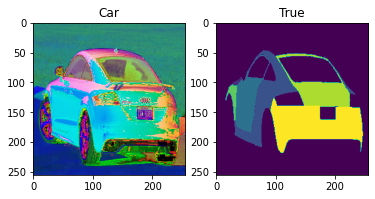

car shape : (256, 256, 3)
mask shape : (256, 256)
mask classes : [0 1 2 3 4 6 8]
torch.Size([1, 3, 256, 256])


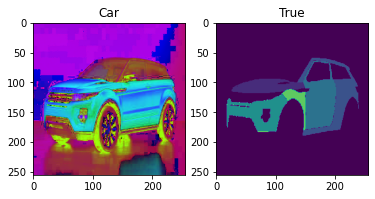

car shape : (256, 256, 3)
mask shape : (256, 256)
mask classes : [0 2 3 5 6 7 8]
torch.Size([1, 3, 256, 256])


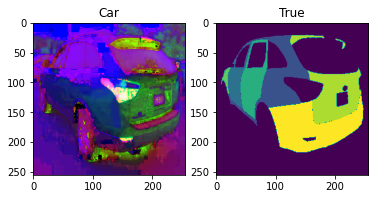

car shape : (256, 256, 3)
mask shape : (256, 256)
mask classes : [0 1 2 3 4 5 6 8]
torch.Size([1, 3, 256, 256])


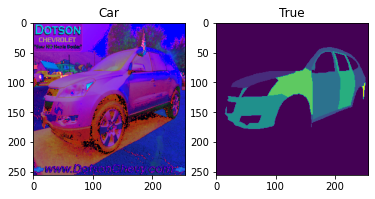

car shape : (256, 256, 3)
mask shape : (256, 256)
mask classes : [0 2 3 4 5 6 7 8]
torch.Size([1, 3, 256, 256])


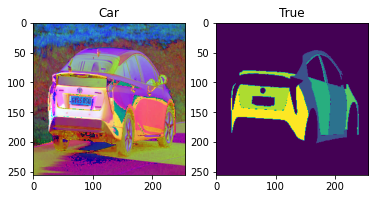

car shape : (256, 256, 3)
mask shape : (256, 256)
mask classes : [0 1 2 3 4 5 6 8]
torch.Size([1, 3, 256, 256])


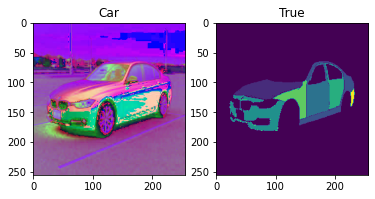

In [ ]:
#@title Opening test photos
from numpy import savetxt
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

path1_test = drive_path+'carseg_data/turtle_dataset/Provisional_Data/test_set/test_cars/'
path2_test = drive_path+'carseg_data/turtle_dataset/Provisional_Data/test_set/test_masks/'

test_cars = sorted(os.listdir(path1_test))
test_masks = sorted(os.listdir(path2_test))

resized_cars, cars, masks = [], [], []
for i in range(len(test_cars)):
  image_ti = Image.open(path1_test + test_cars[i])
  image_ma = Image.open(path2_test + test_masks[i])

  height, width = 256, 256

  image_ti = image_ti.resize((256, 256), resample=1)
  resized_cars.append(image_ti)

  if image_type == 'HSV':             
      image_t=image_ti.convert('HSV')
      image_test = np.asarray(image_t)

  if image_type == 'RGB':
  #  image_test = np.asarray(image_ti)[:,:,:3]
      image_t = np.asarray(image_ti) / 255
      img_inp = np.zeros_like(image_t)
      img_inp[ :, :, 0] = (image_t[:, :, 0] - r_mean) / r_std
      img_inp[ :, :, 1] = (image_t[:, :, 1] - g_mean) / g_std
      img_inp[ :, :, 2] = (image_t[:, :, 2] - b_mean) / b_std
      image_test = img_inp[:,:,:3] #this one just for RBGA cases
      

  image_ma = image_ma.resize((256, 256), Image.NEAREST)
  image_ma2 = np.asarray(image_ma)  
  print('car shape :',image_test.shape)
  print('mask shape :',image_ma2.shape)
  print('mask classes :',np.unique(image_ma2))

  img_inp = torch.from_numpy(image_test)
  imgs=torch.transpose(img_inp,0,2)
  imgs=torch.transpose(imgs,1,2)
  imgs=torch.reshape(imgs, (1,3,256,256))
  print(imgs.shape)
  imgs_test = Variable(imgs.type(torch.FloatTensor))

  cars.append(imgs_test)
  masks.append(image_ma2)

  fig = plt.figure()
  ax = fig.add_subplot(1, 2, 1)
  imgplot = plt.imshow(image_test)
  ax.set_title('Car')
  ax = fig.add_subplot(1, 2, 2)
  imgplot = plt.imshow(image_ma2)
  ax.set_title('True')
  plt.show()

# training

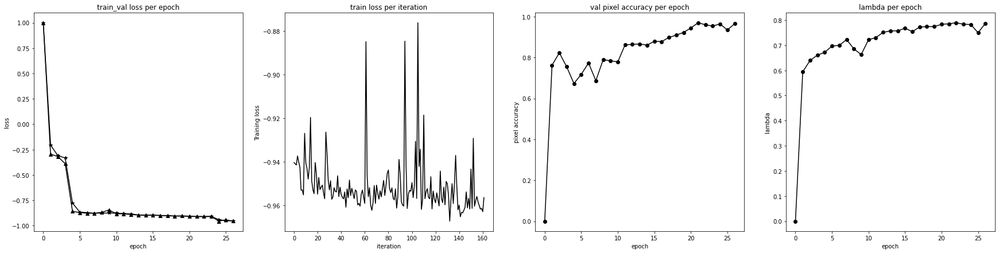

Pixel accuracy average: 74.7608994838301
Dice mean: 0.78596526


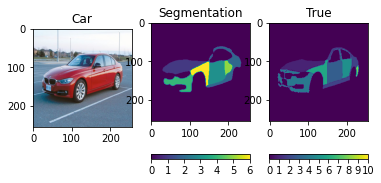

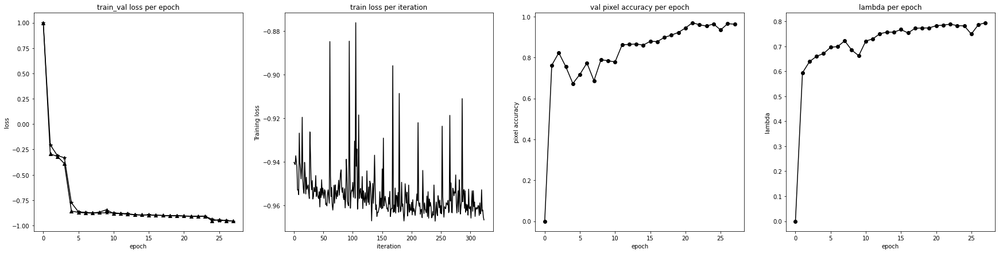

Pixel accuracy average: 74.79609952761774
Dice mean: 0.7917581


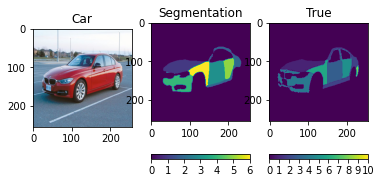

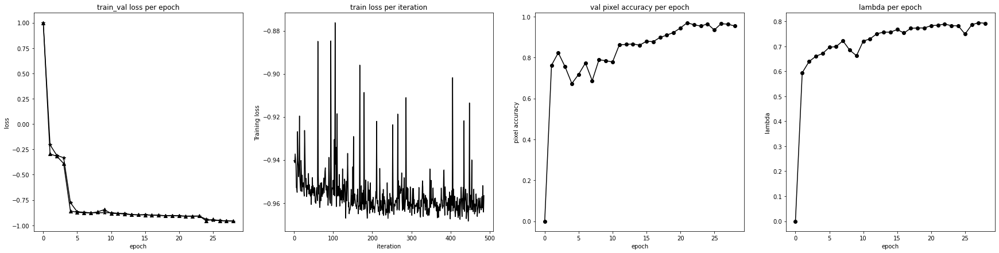

Pixel accuracy average: 73.45241541098514
Dice mean: 0.771586


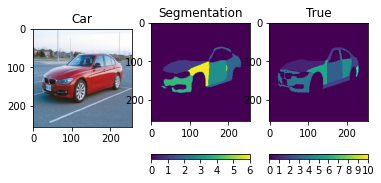

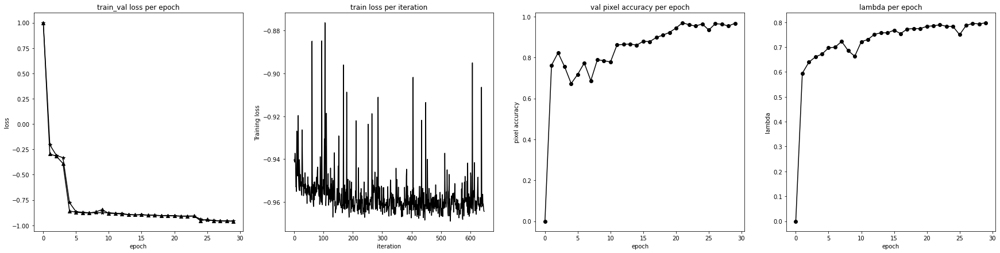

Pixel accuracy average: 70.504094335671
Dice mean: 0.7681019


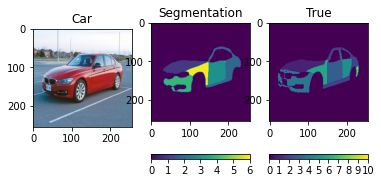

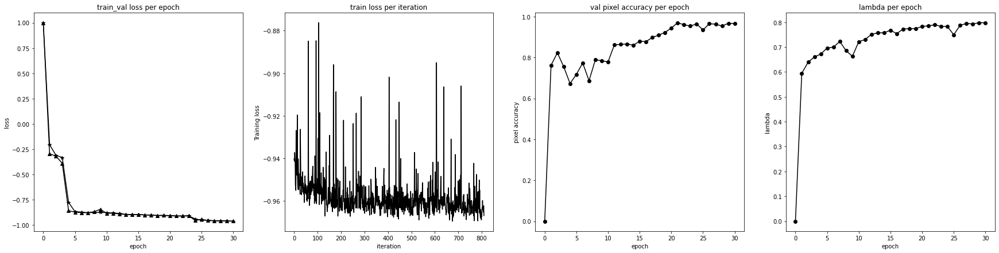

Pixel accuracy average: 72.9989237029352
Dice mean: 0.75967383


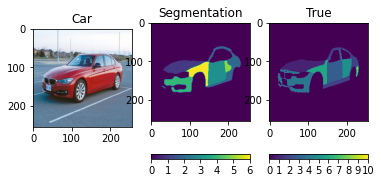

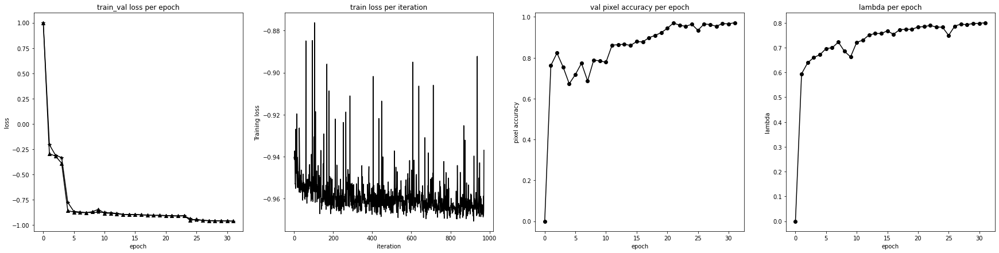

Pixel accuracy average: 71.85704871401866
Dice mean: 0.77656204


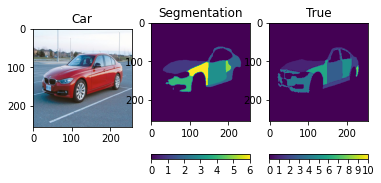

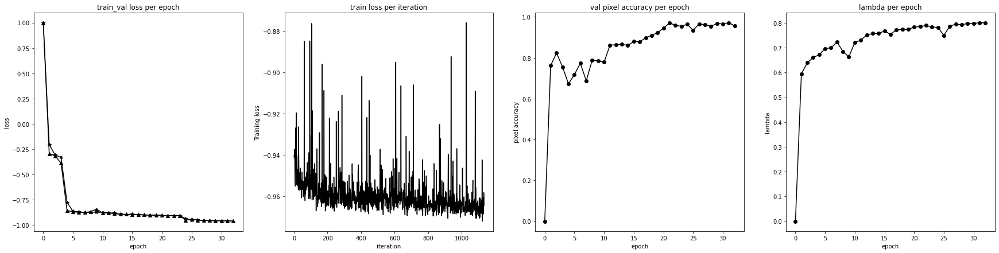

Pixel accuracy average: 71.520345076243
Dice mean: 0.775397


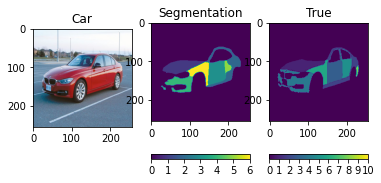

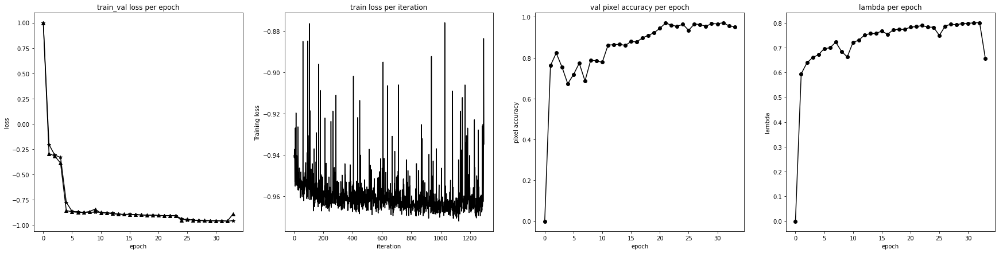

Pixel accuracy average: 55.39300504682376
Dice mean: 0.70107466


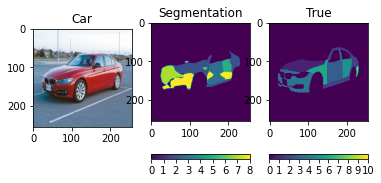

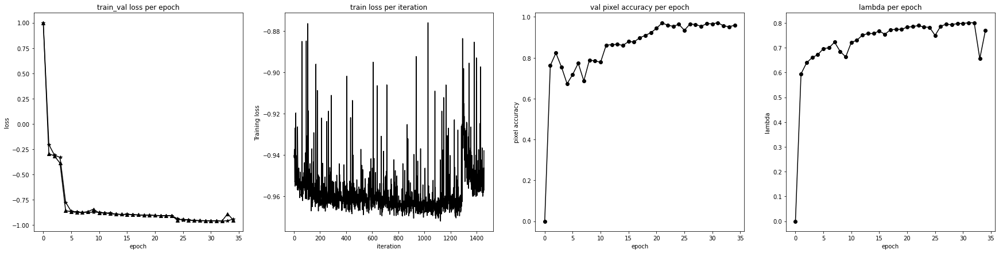

Pixel accuracy average: 72.22240291568203
Dice mean: 0.7699008


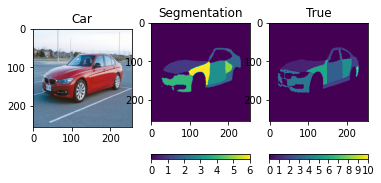

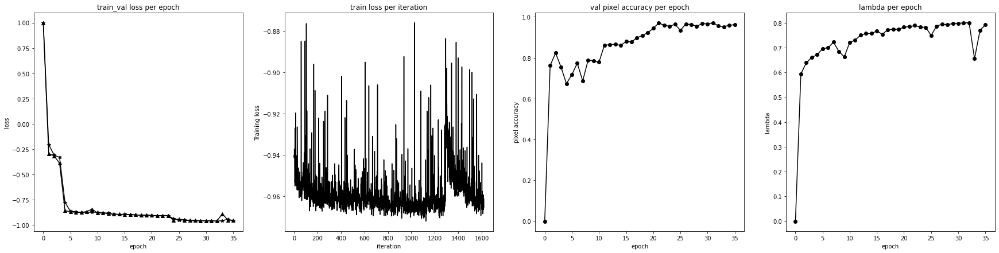

Pixel accuracy average: 74.55155051629782
Dice mean: 0.7882064


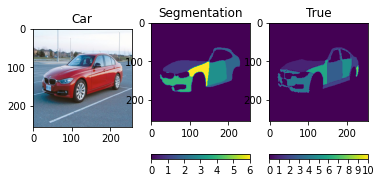

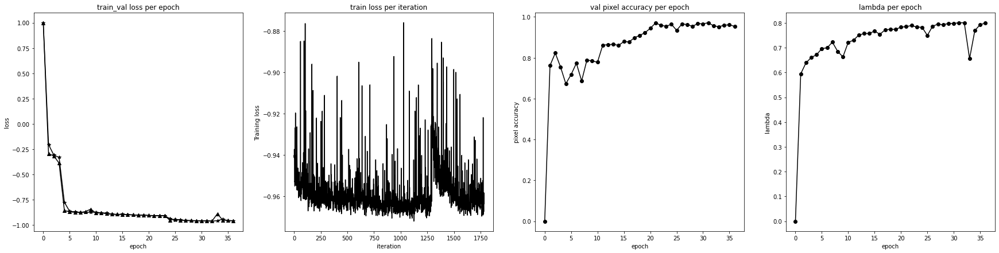

Pixel accuracy average: 75.75283441247869
Dice mean: 0.80437183


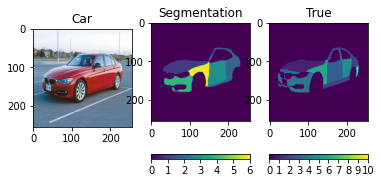

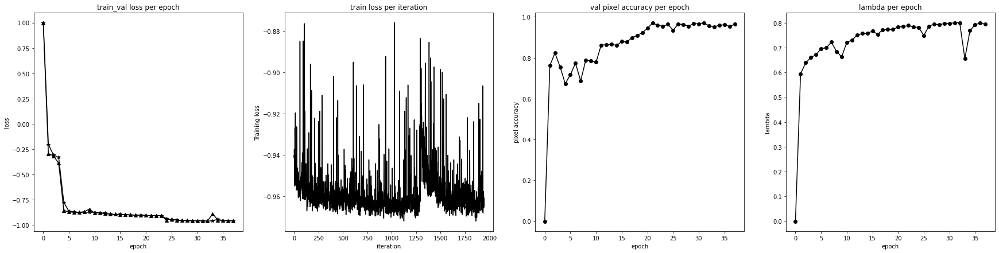

Pixel accuracy average: 75.01560240529972
Dice mean: 0.78935176


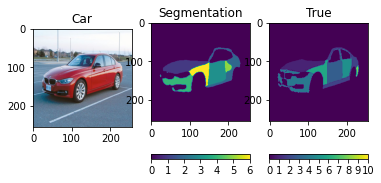

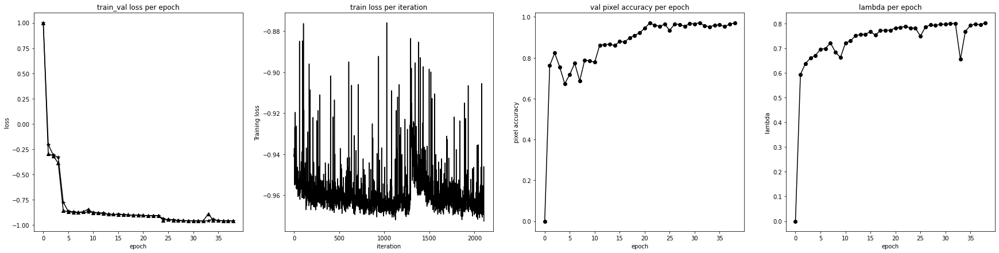

Pixel accuracy average: 75.99304578863077
Dice mean: 0.7935171


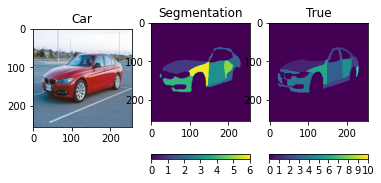

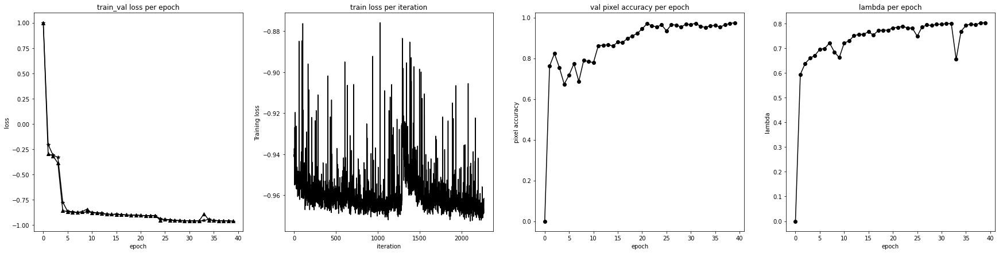

Pixel accuracy average: 73.67389761586462
Dice mean: 0.7911842


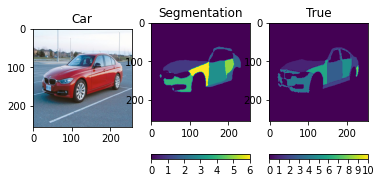

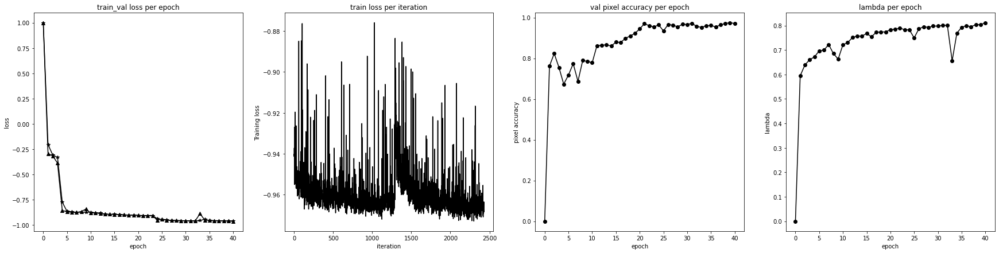

Pixel accuracy average: 75.89501482264656
Dice mean: 0.7949756


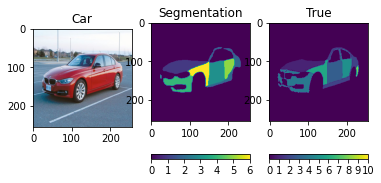

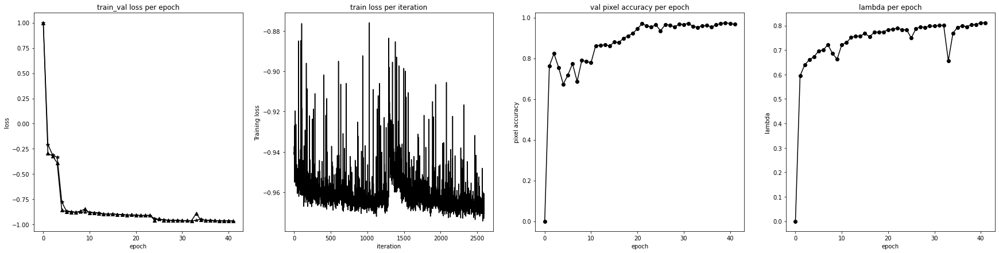

Pixel accuracy average: 75.82836659305214
Dice mean: 0.8013765


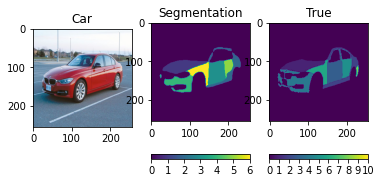

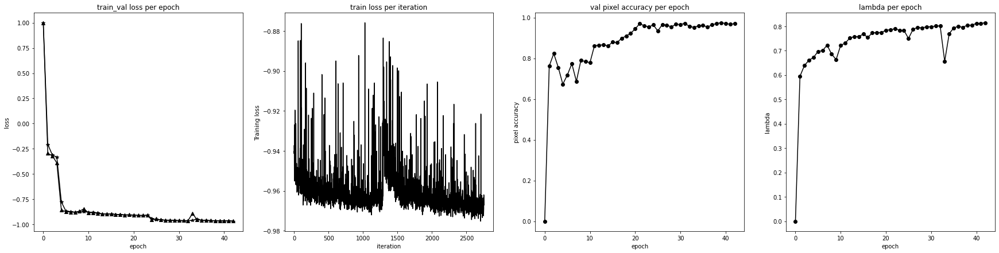

Pixel accuracy average: 74.53106668002312
Dice mean: 0.8029559


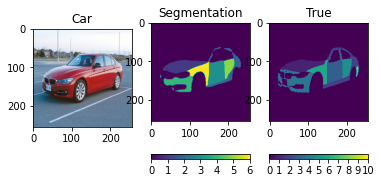

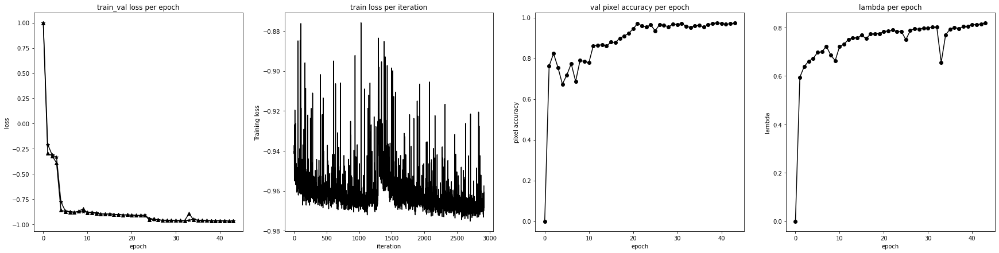

Pixel accuracy average: 75.4428151003399
Dice mean: 0.7889855


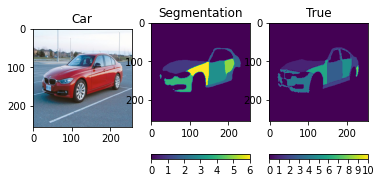

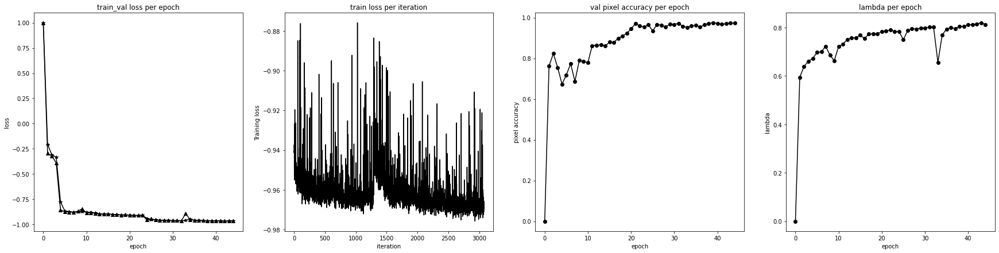

Pixel accuracy average: 75.401113591265
Dice mean: 0.80213076


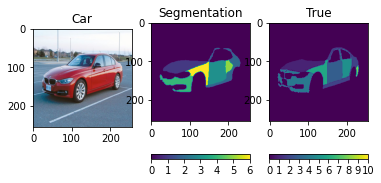

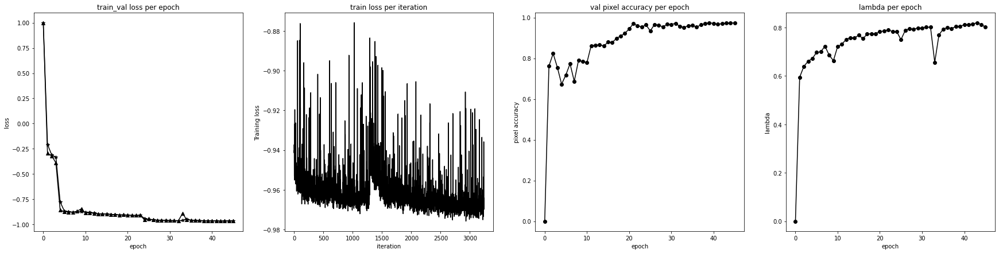

Pixel accuracy average: 76.24511929237394
Dice mean: 0.78891355


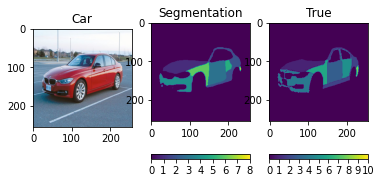

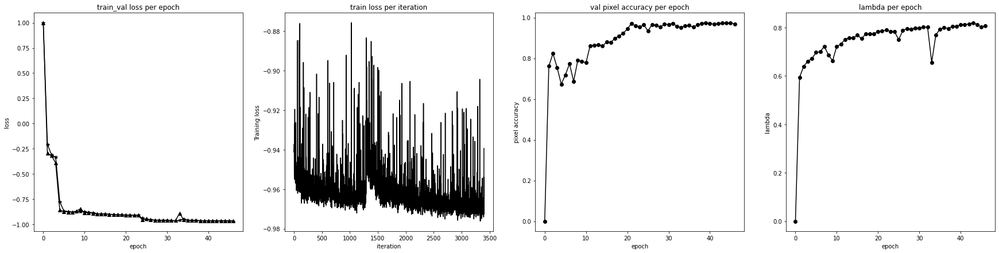

Pixel accuracy average: 75.9099018979115
Dice mean: 0.80306035


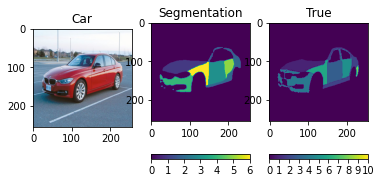

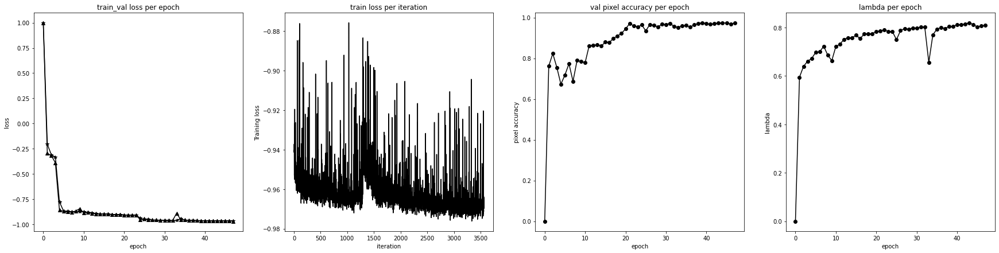

Pixel accuracy average: 76.36479346060877
Dice mean: 0.8053334


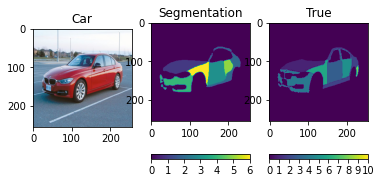

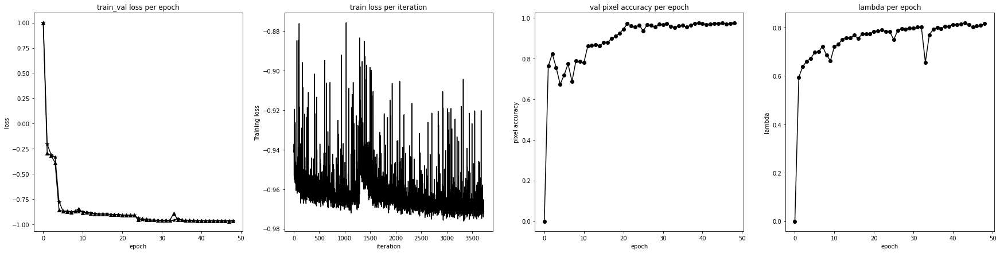

Pixel accuracy average: 77.7978870022685
Dice mean: 0.81446844


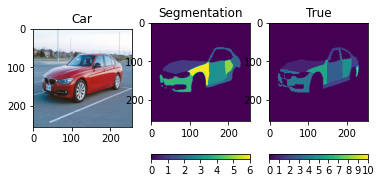

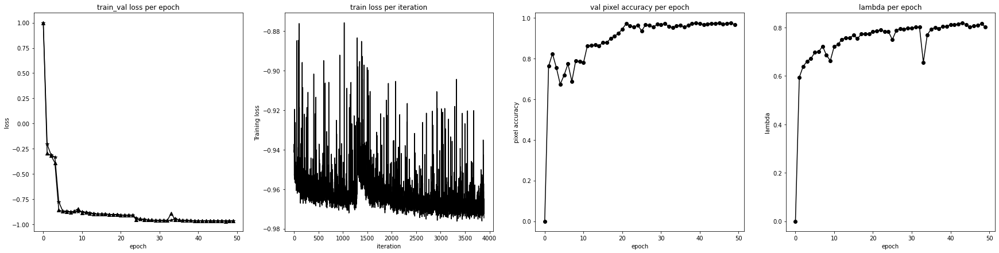

Pixel accuracy average: 73.8485004982008
Dice mean: 0.8023701


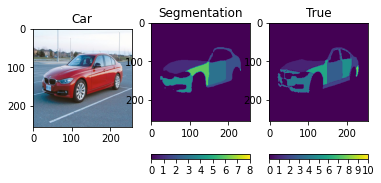

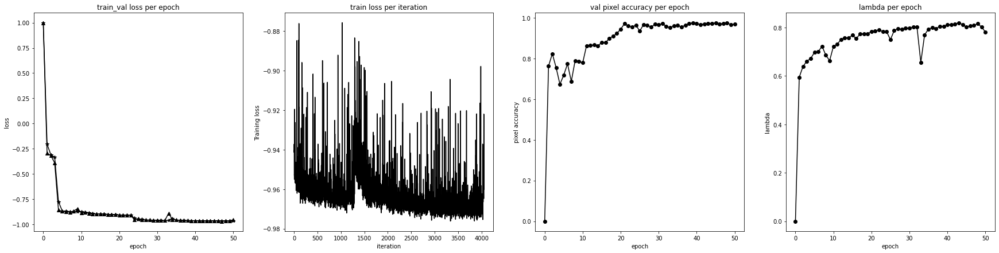

Pixel accuracy average: 73.80309037809366
Dice mean: 0.7785837


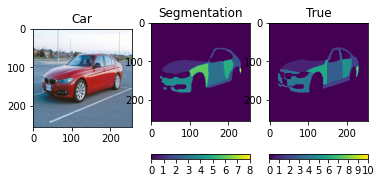

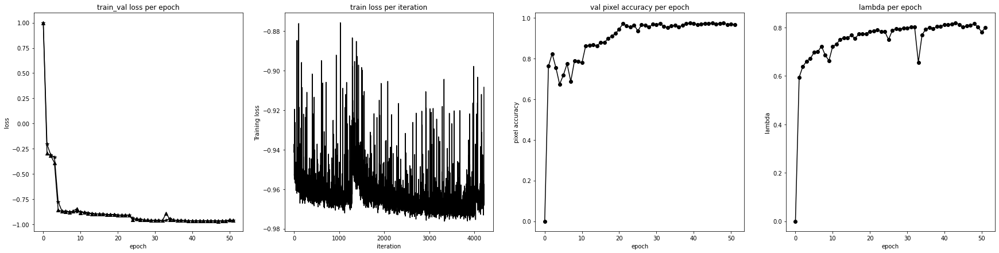

Pixel accuracy average: 74.20555288121132
Dice mean: 0.7959402


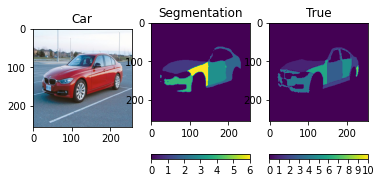

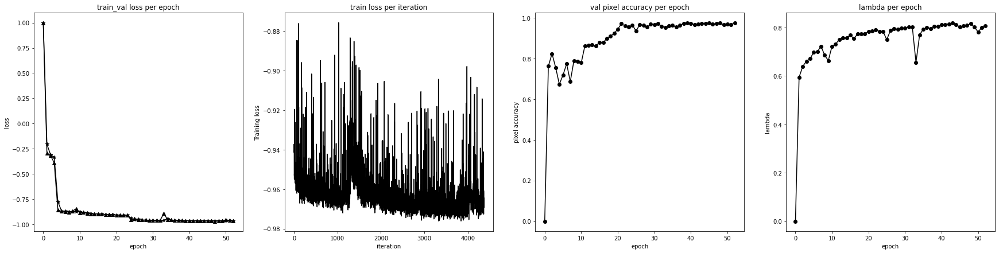

Pixel accuracy average: 75.87785974137927
Dice mean: 0.78983545


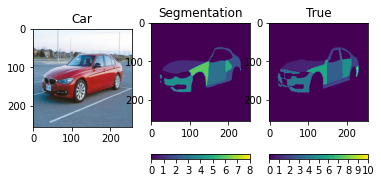

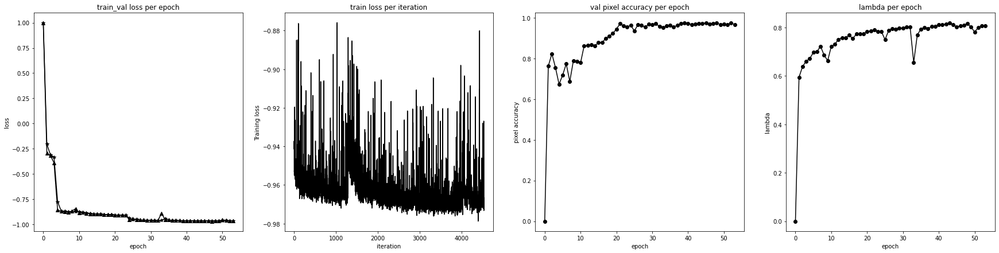

Pixel accuracy average: 75.01652227656457
Dice mean: 0.777077


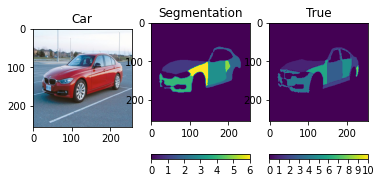

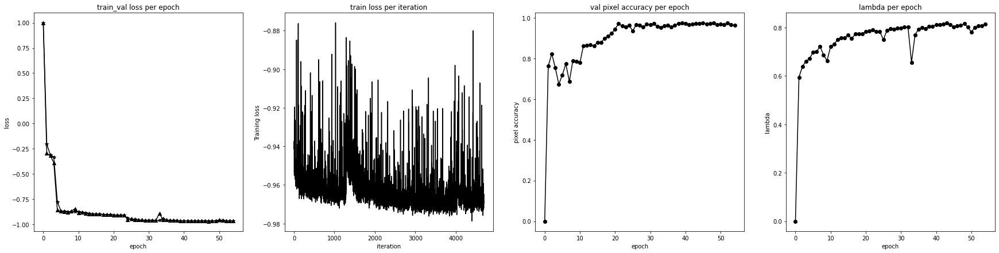

Pixel accuracy average: 74.16025052706244
Dice mean: 0.78308517


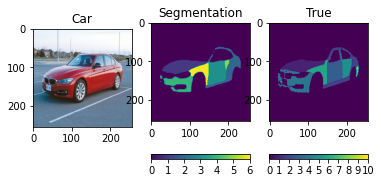

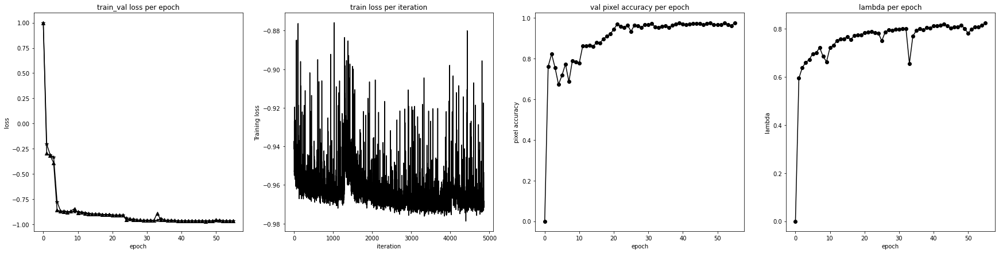

Pixel accuracy average: 75.17227995027362
Dice mean: 0.8059748


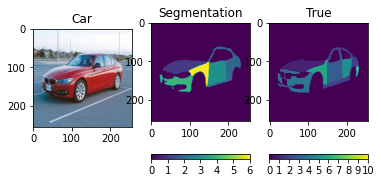

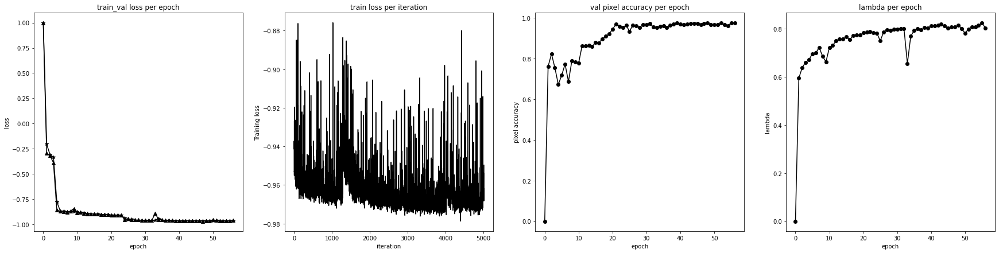

Pixel accuracy average: 73.40343656043144
Dice mean: 0.7953608


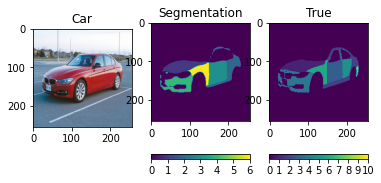

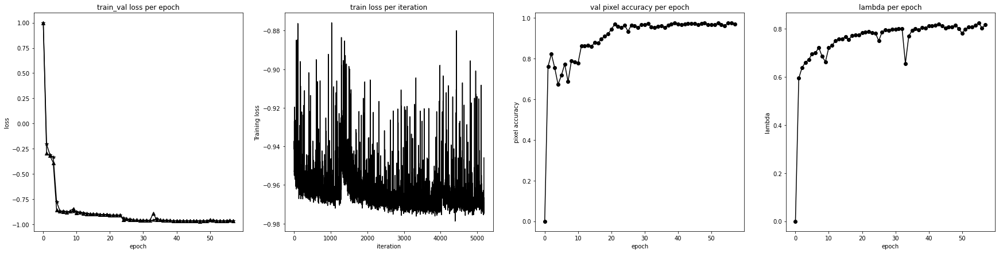

Pixel accuracy average: 76.98959103941856
Dice mean: 0.8049676


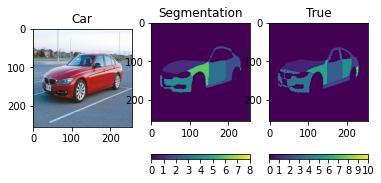

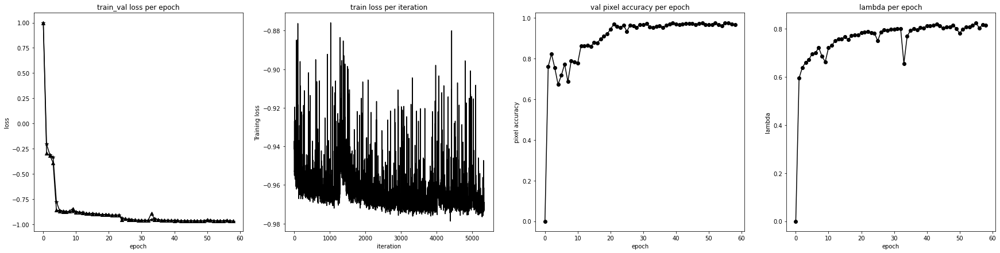

Pixel accuracy average: 72.57112288564069
Dice mean: 0.7734967


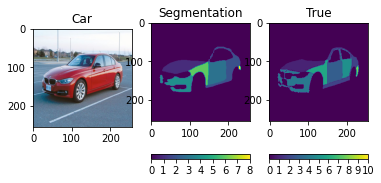

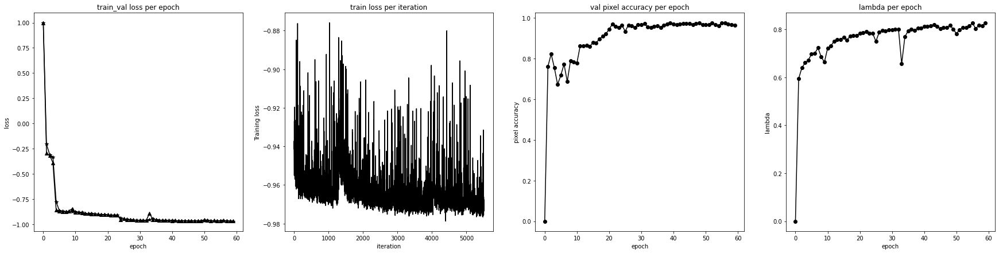

Pixel accuracy average: 75.93155524936701
Dice mean: 0.8083382


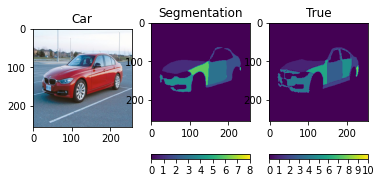

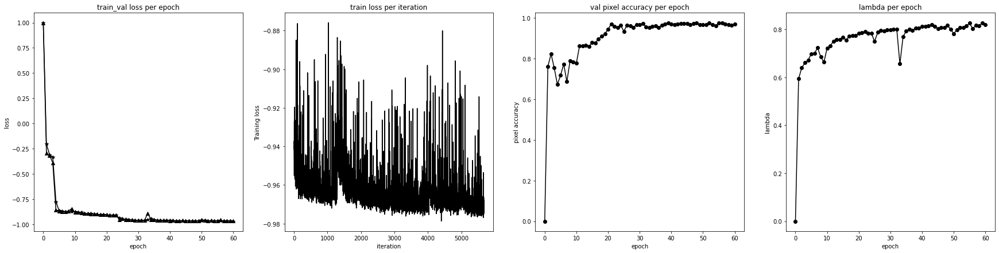

Pixel accuracy average: 75.36150596137468
Dice mean: 0.793111


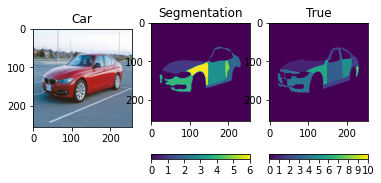

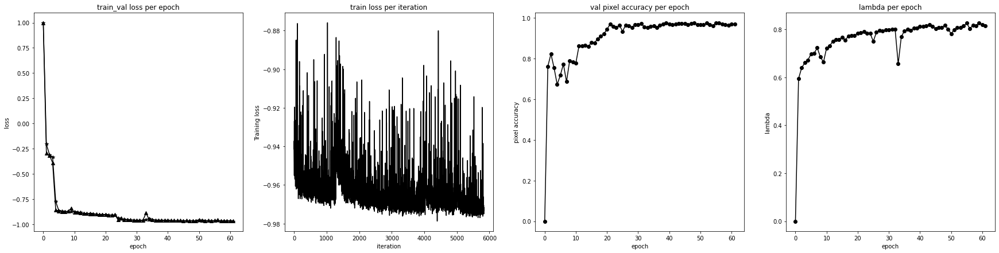

Pixel accuracy average: 75.00561239165677
Dice mean: 0.79220414


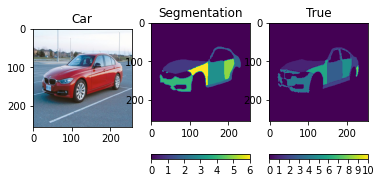

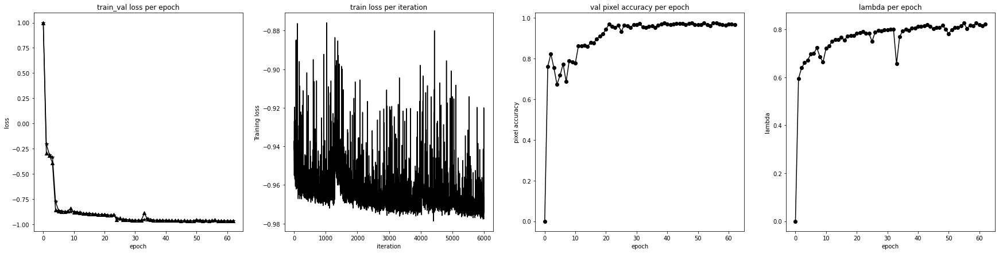

Pixel accuracy average: 75.82399619917733
Dice mean: 0.8072095


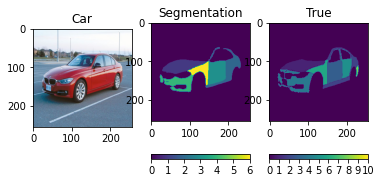

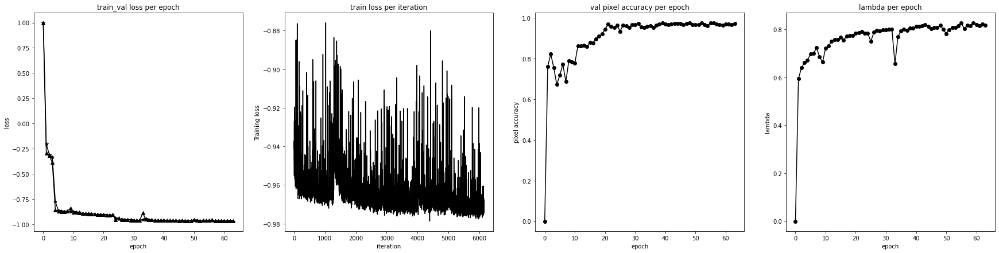

Pixel accuracy average: 78.00738548229648
Dice mean: 0.8143546


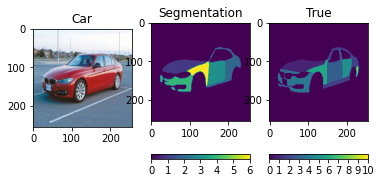

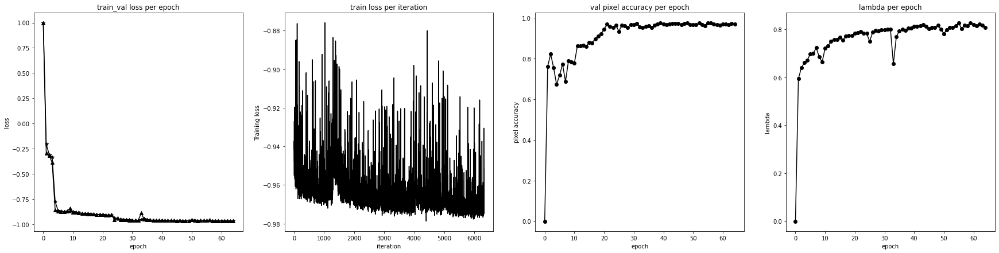

Pixel accuracy average: 73.88374835365398
Dice mean: 0.79426855


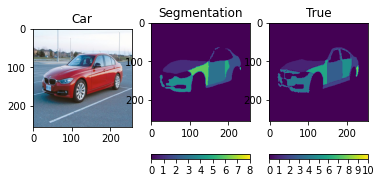

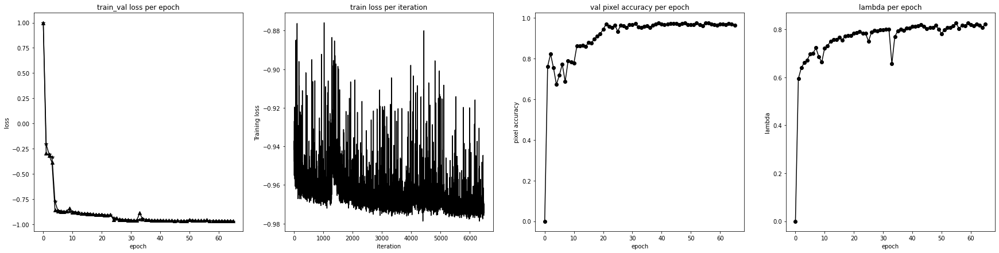

Pixel accuracy average: 76.87537262342714
Dice mean: 0.8160222


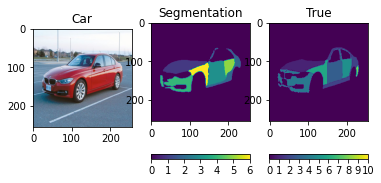

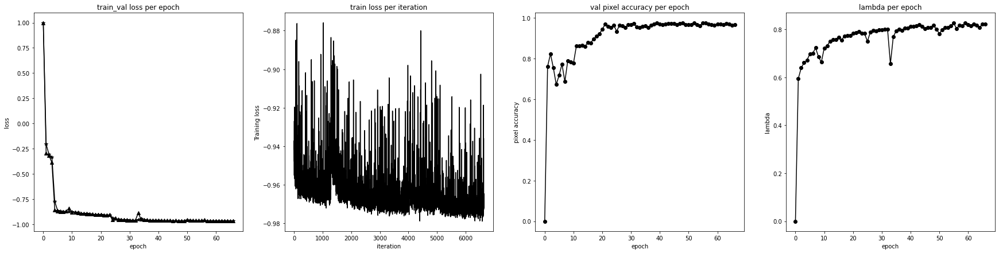

Pixel accuracy average: 76.05221128480244
Dice mean: 0.7868472


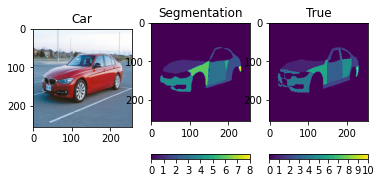

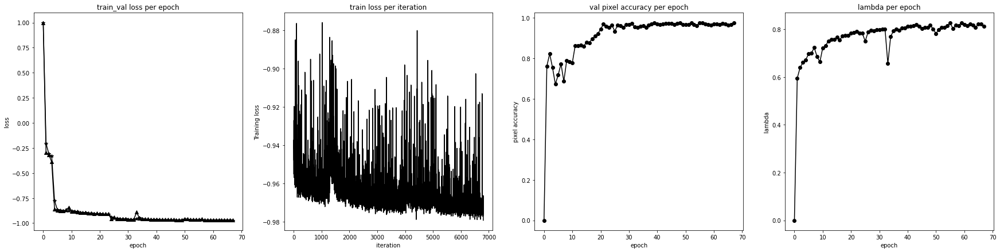

Pixel accuracy average: 75.2146413233079
Dice mean: 0.79390883


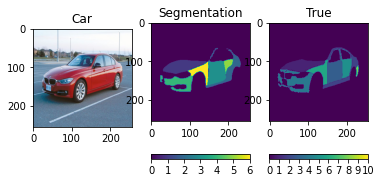

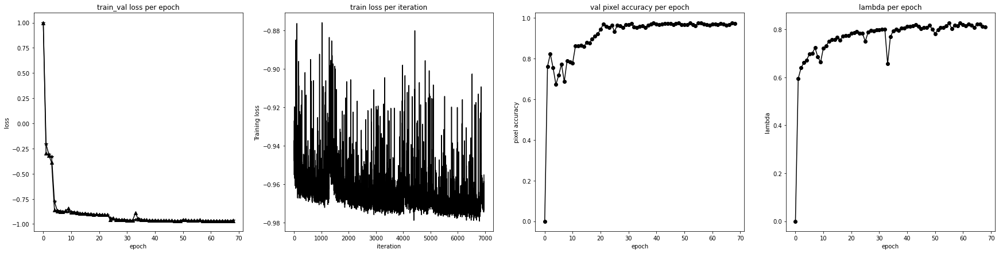

Pixel accuracy average: 73.28984209579183
Dice mean: 0.8014737


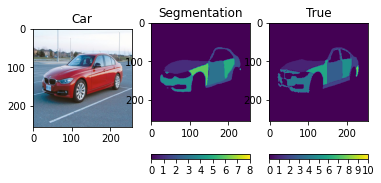

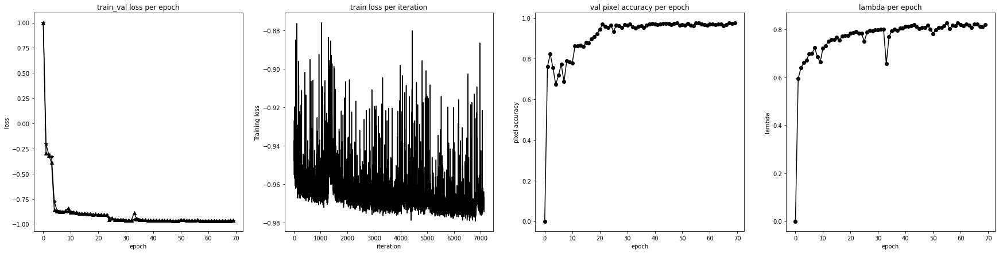

Pixel accuracy average: 74.40961631387431
Dice mean: 0.80203366


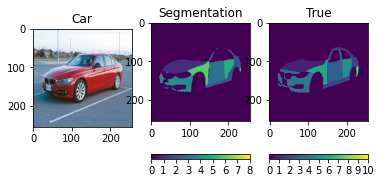

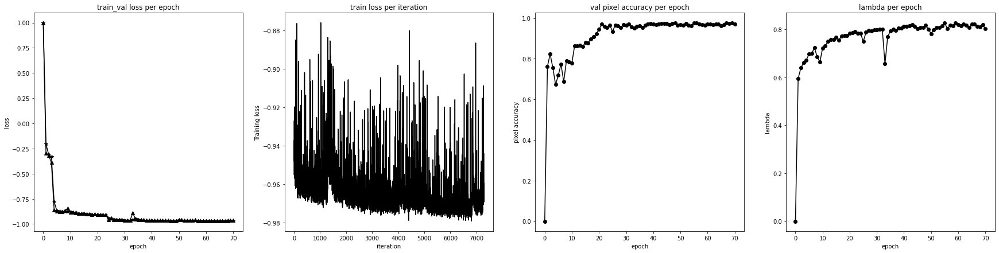

Pixel accuracy average: 72.66769385105134
Dice mean: 0.79094315


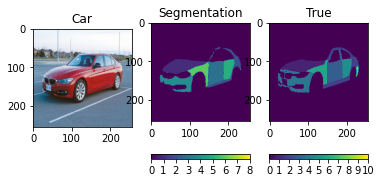

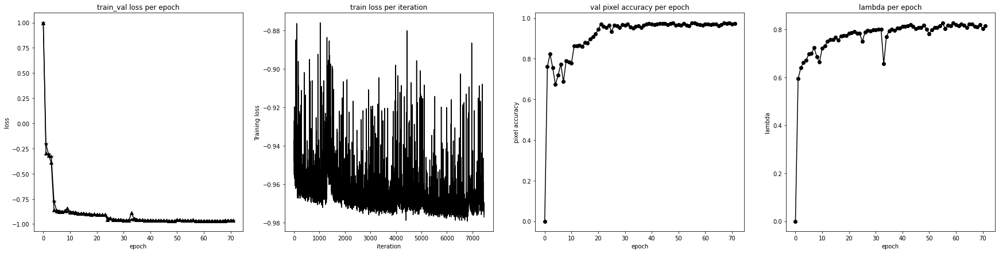

Pixel accuracy average: 75.59382391504535
Dice mean: 0.795147


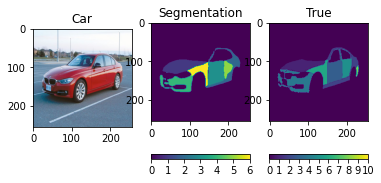

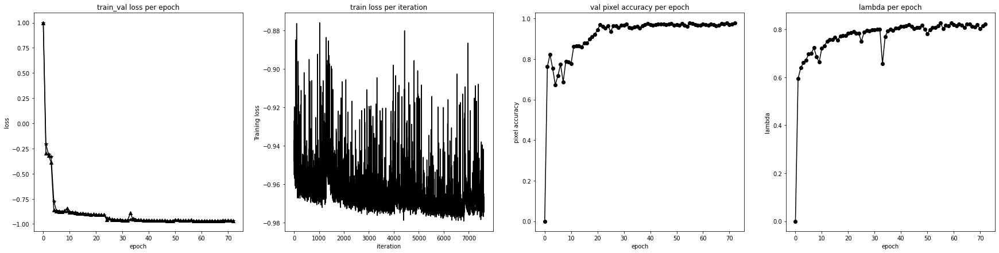

Pixel accuracy average: 75.33663844010773
Dice mean: 0.79416317


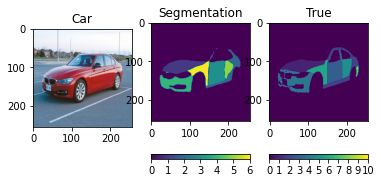

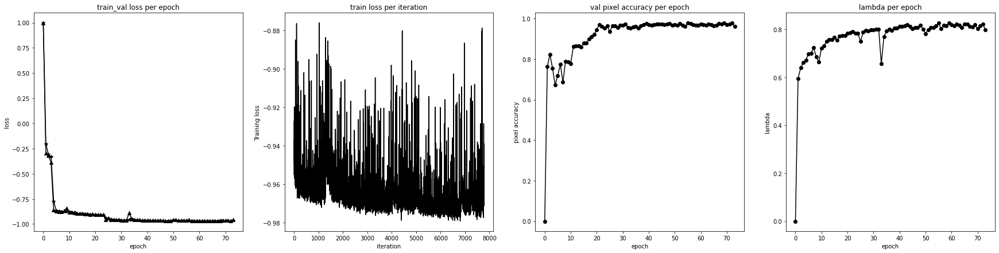

Pixel accuracy average: 75.32514557053302
Dice mean: 0.7946469


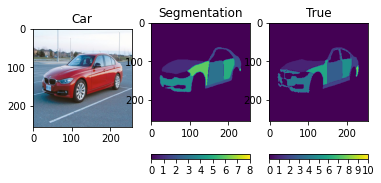

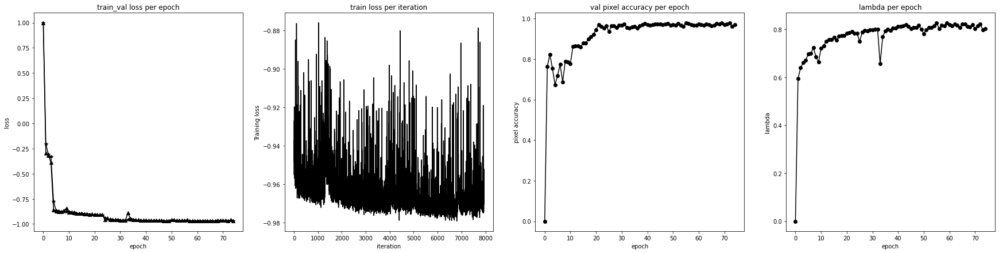

Pixel accuracy average: 77.21440030273907
Dice mean: 0.81813836


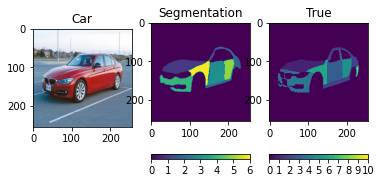

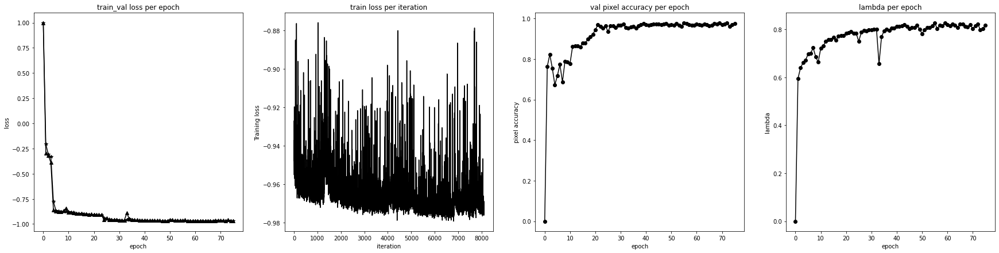

Pixel accuracy average: 77.2720791703567
Dice mean: 0.81037265


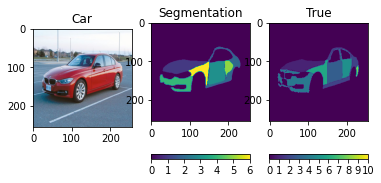

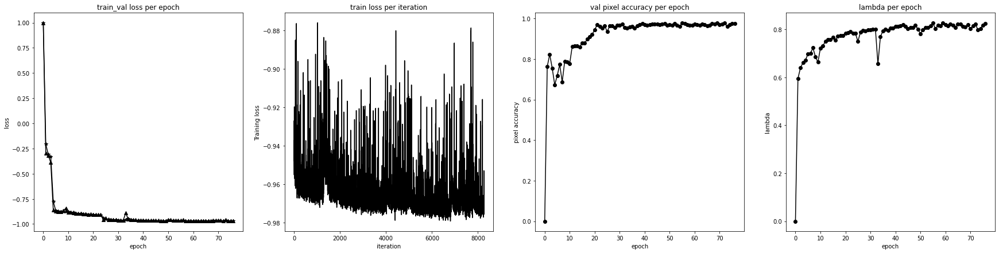

Pixel accuracy average: 78.24325315002208
Dice mean: 0.8087782


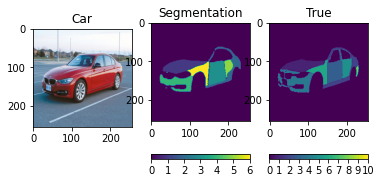

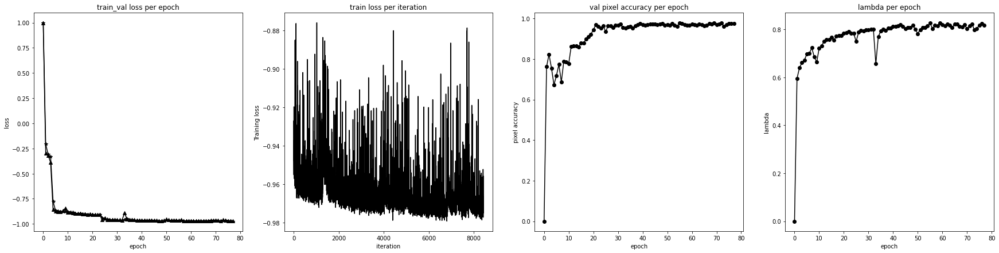

Pixel accuracy average: 77.91014104593691
Dice mean: 0.8168754


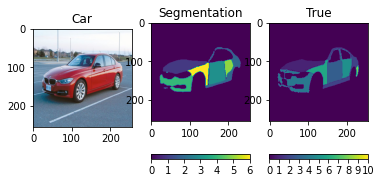

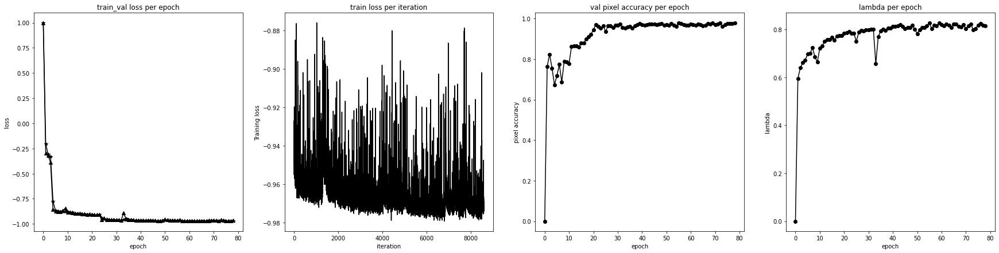

Pixel accuracy average: 76.66773859274
Dice mean: 0.79506415


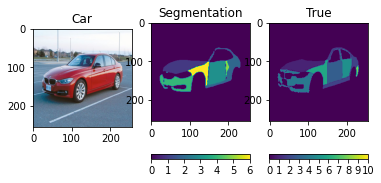

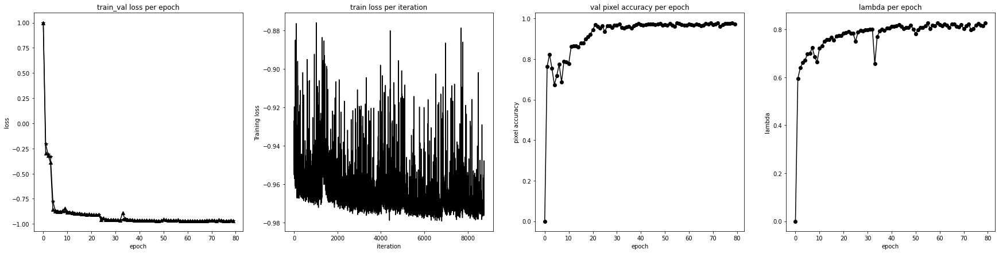

Pixel accuracy average: 75.67842860137489
Dice mean: 0.805372


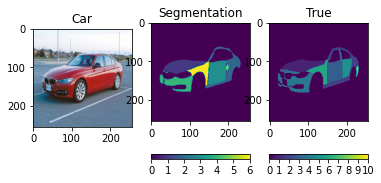

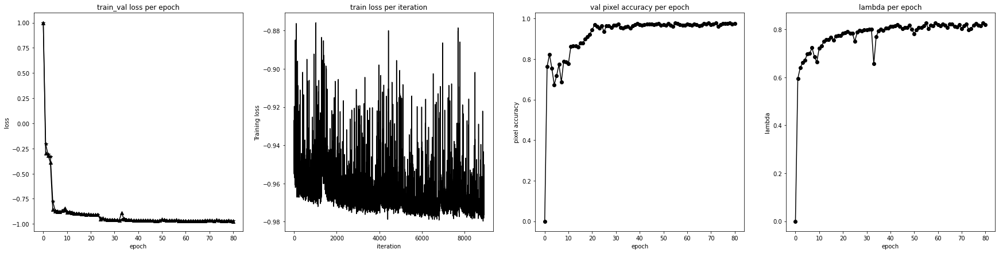

Pixel accuracy average: 76.00287749552679
Dice mean: 0.80836934


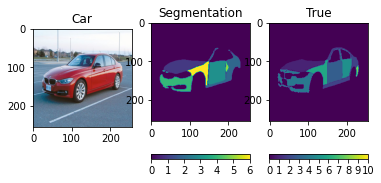

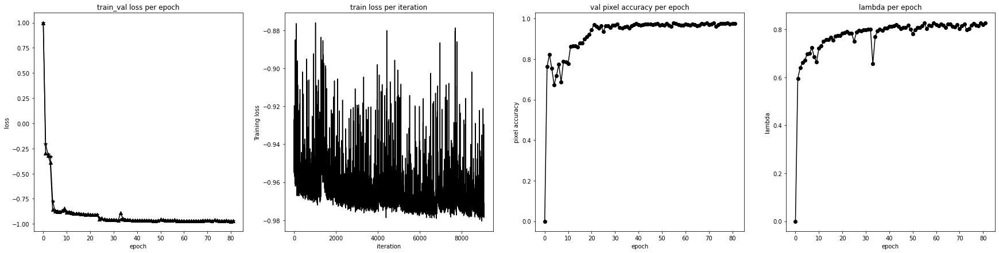

Pixel accuracy average: 77.03015677915953
Dice mean: 0.8134621


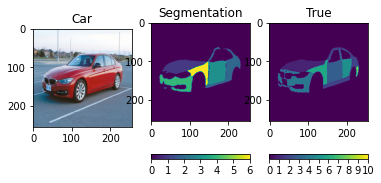

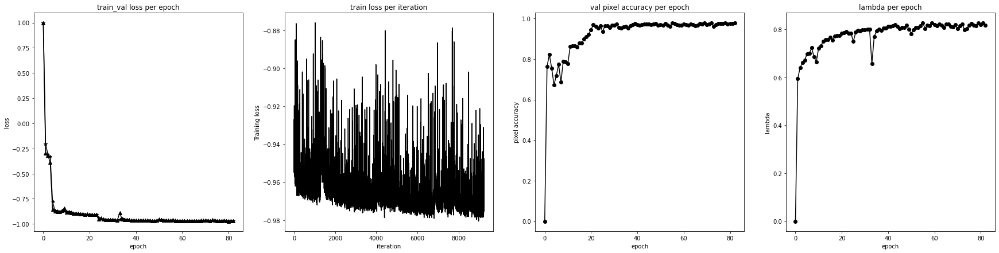

Pixel accuracy average: 79.24625910662462
Dice mean: 0.8170655


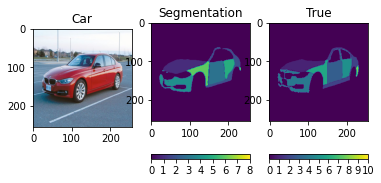

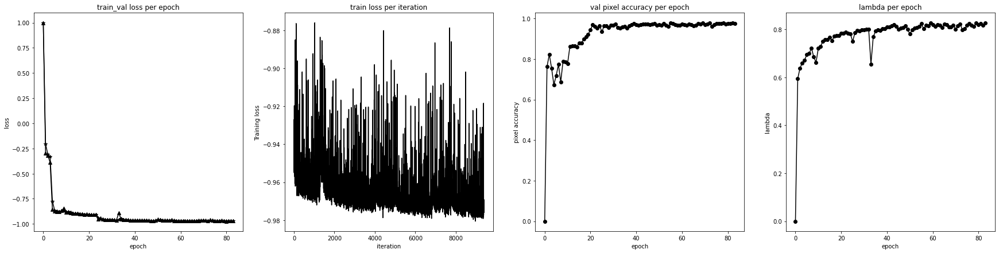

Pixel accuracy average: 76.75275364616972
Dice mean: 0.81176066


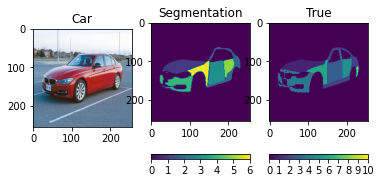

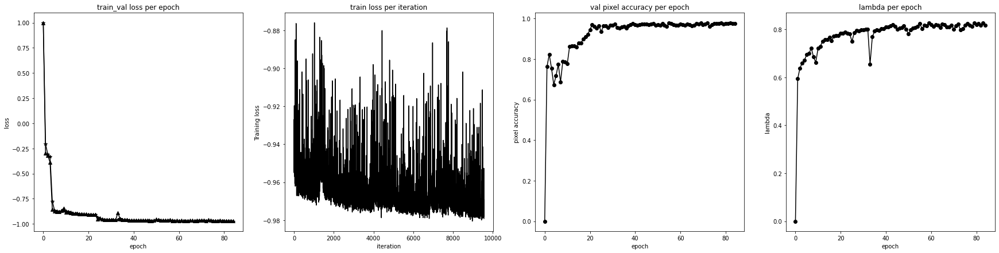

Pixel accuracy average: 77.67024106289024
Dice mean: 0.8113384


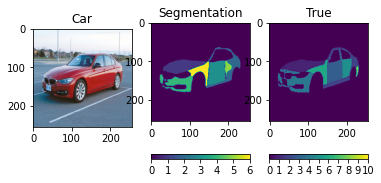

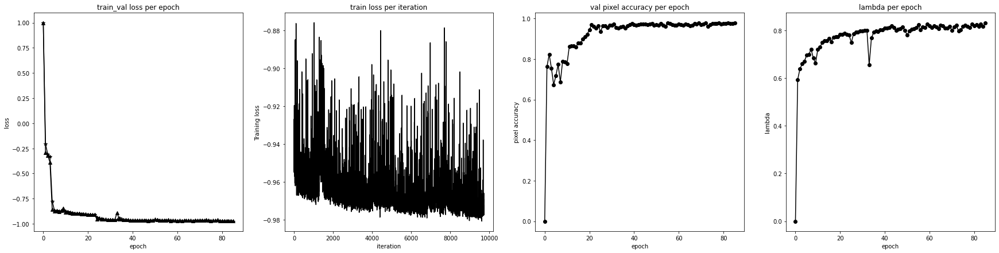

Pixel accuracy average: 77.31871502127989
Dice mean: 0.80353755


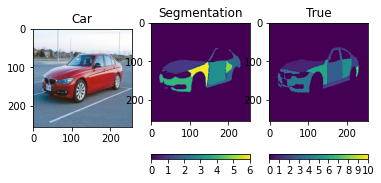

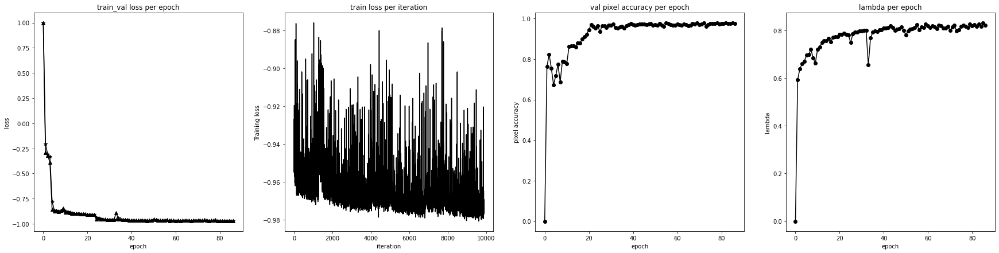

Pixel accuracy average: 77.9335496083186
Dice mean: 0.81662065


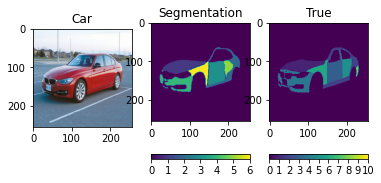

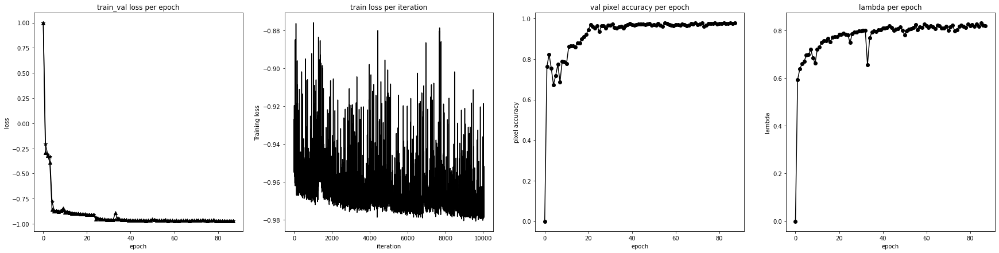

Pixel accuracy average: 77.697557605456
Dice mean: 0.82084507


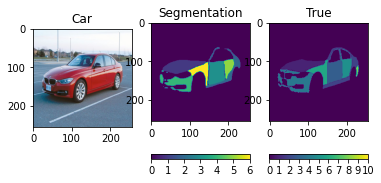

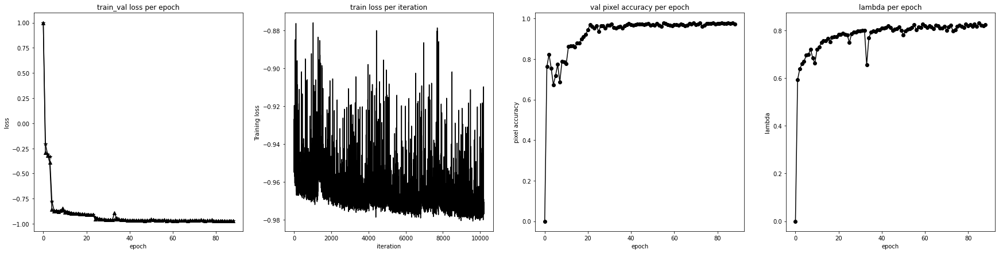

Pixel accuracy average: 77.28481437042201
Dice mean: 0.8137737


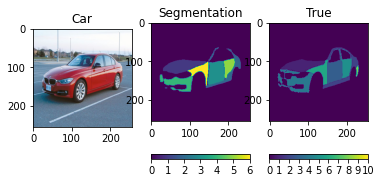

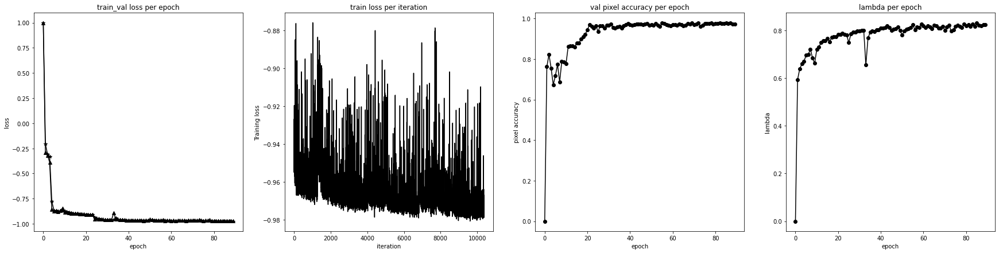

Pixel accuracy average: 77.18371747562499
Dice mean: 0.8072302


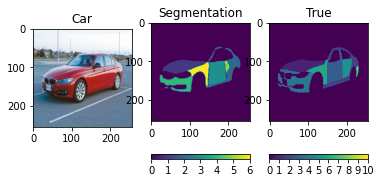

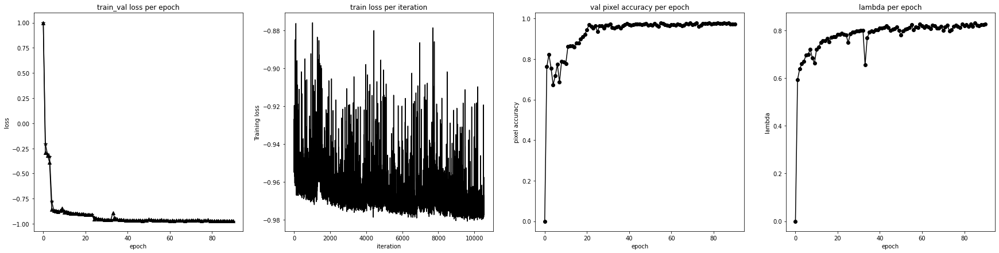

Pixel accuracy average: 76.56750608585075
Dice mean: 0.8150945


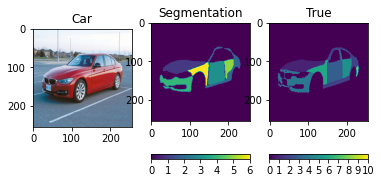

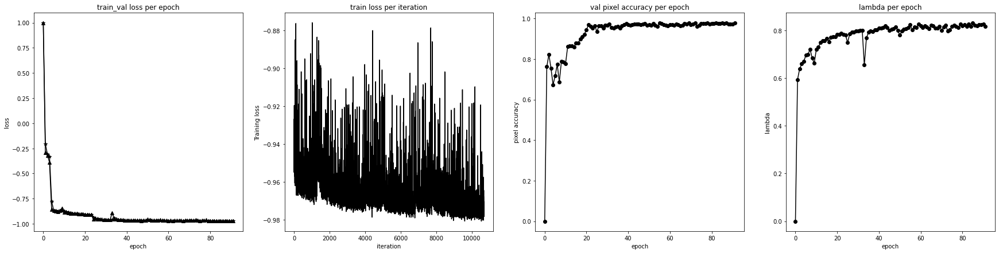

Pixel accuracy average: 78.76433990743185
Dice mean: 0.8220873


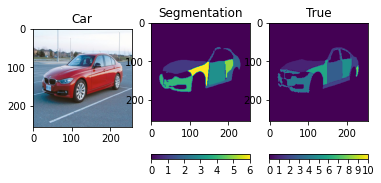

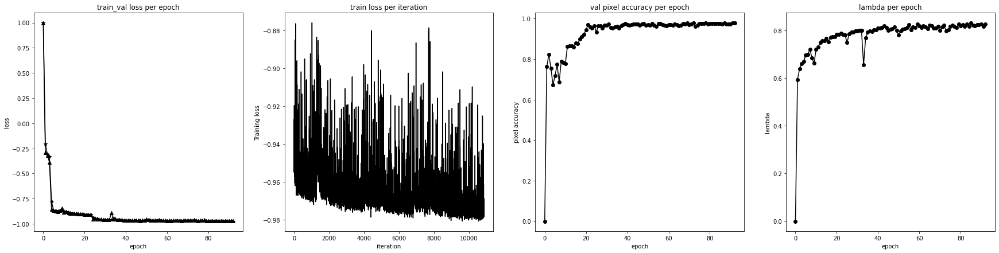

Pixel accuracy average: 77.95011985540741
Dice mean: 0.8159835


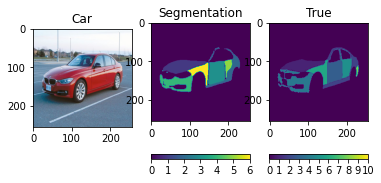

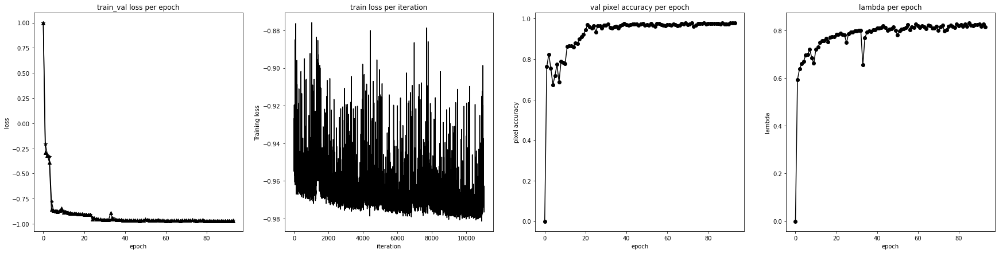

Pixel accuracy average: 76.74936957972118
Dice mean: 0.82268614


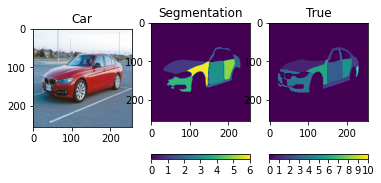

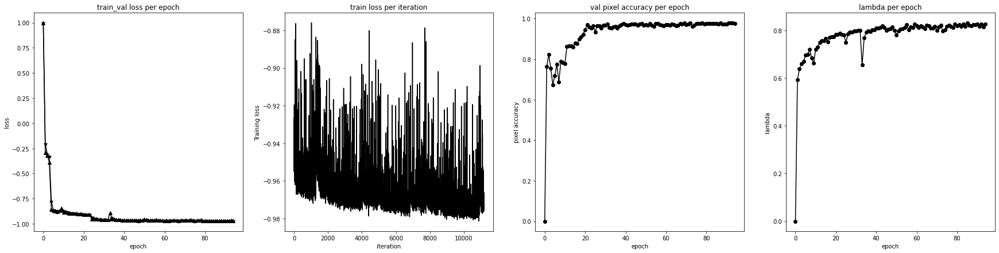

Pixel accuracy average: 75.90120888251785
Dice mean: 0.8131292


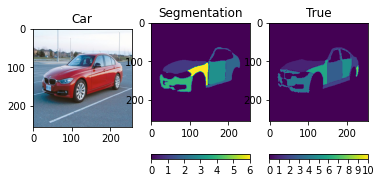

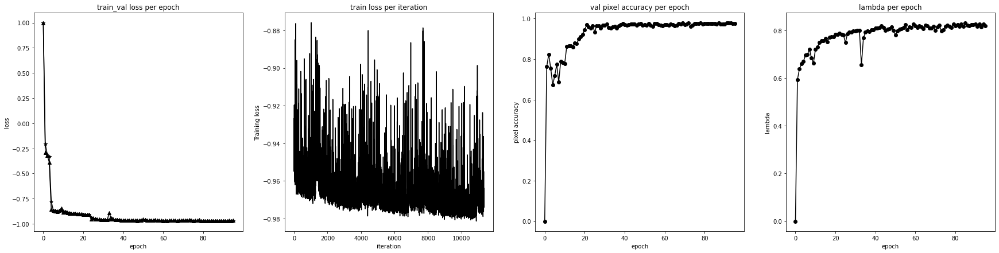

Pixel accuracy average: 76.06410879317042
Dice mean: 0.8056577


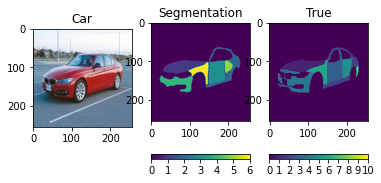

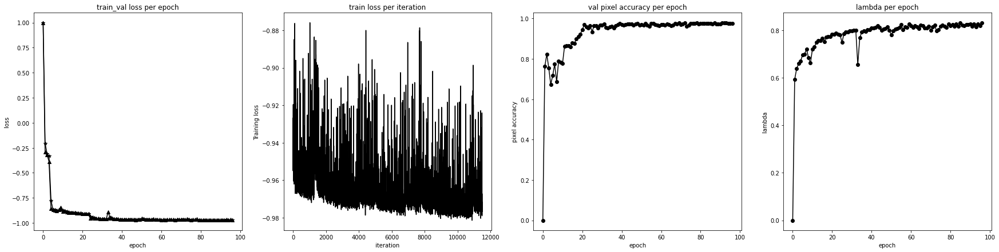

Pixel accuracy average: 77.68428921276123
Dice mean: 0.80862254


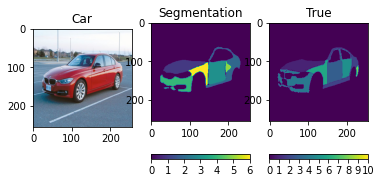

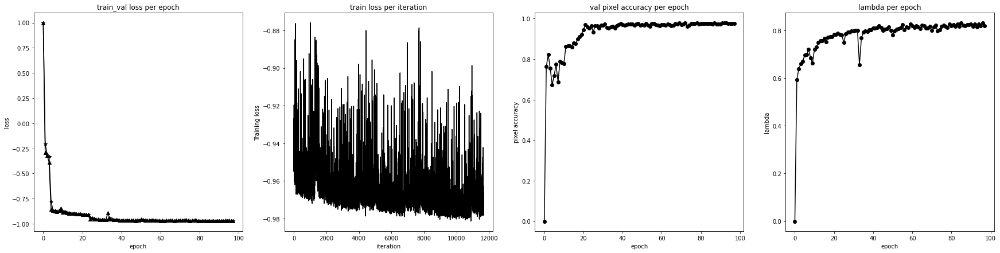

Pixel accuracy average: 78.63139797210557
Dice mean: 0.8190667


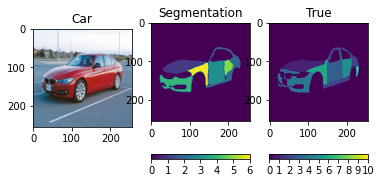

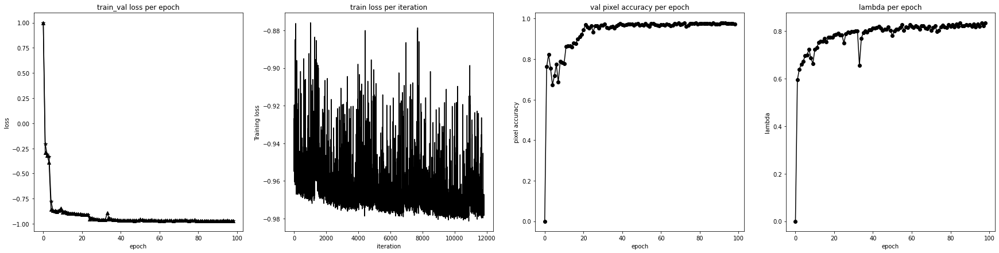

Pixel accuracy average: 78.9635069157892
Dice mean: 0.8265105


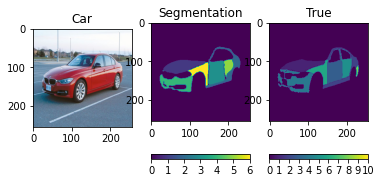

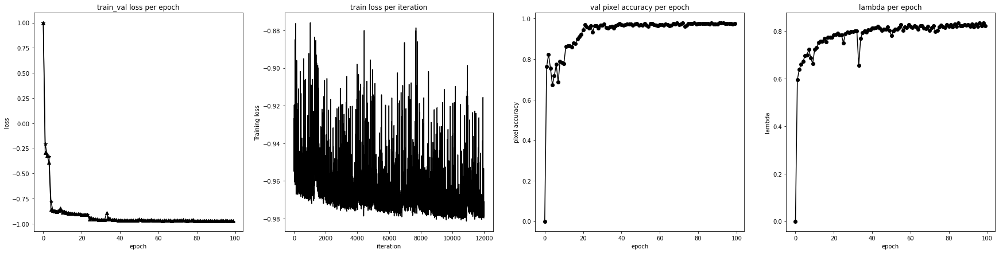

Pixel accuracy average: 76.92942203331377
Dice mean: 0.8098013


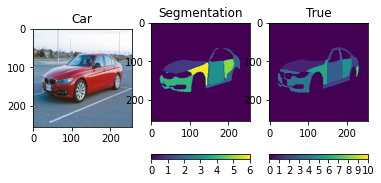

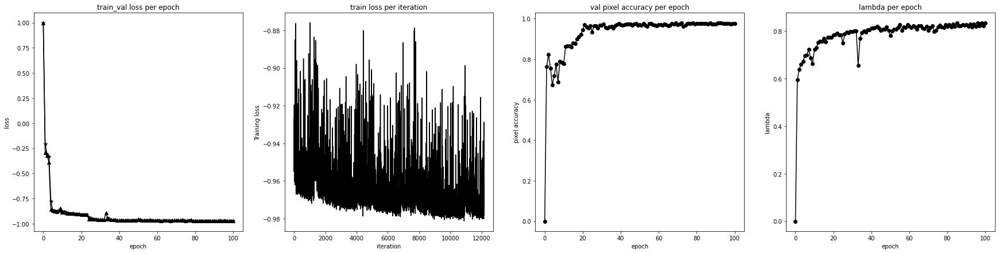

Pixel accuracy average: 77.77271175545884
Dice mean: 0.82156587


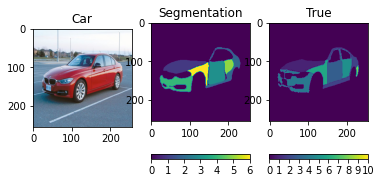

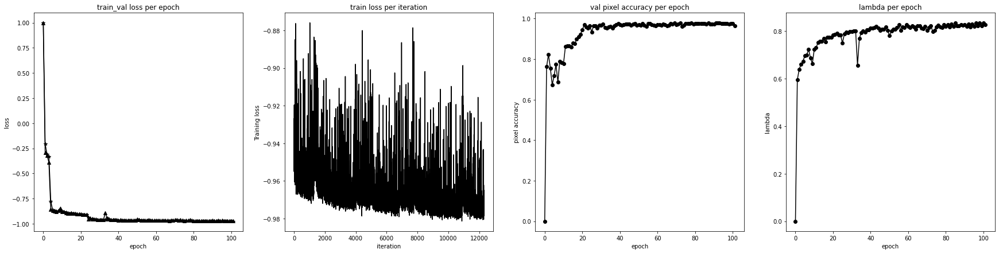

Pixel accuracy average: 77.54460992754711
Dice mean: 0.8196313


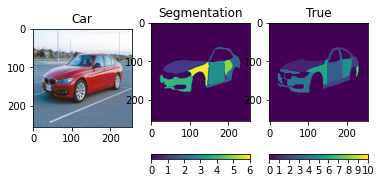

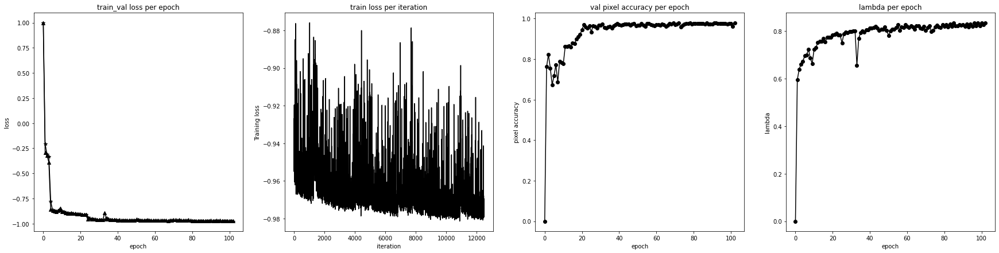

Pixel accuracy average: 78.23397722514143
Dice mean: 0.8174035


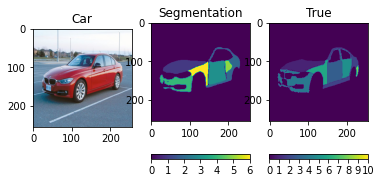

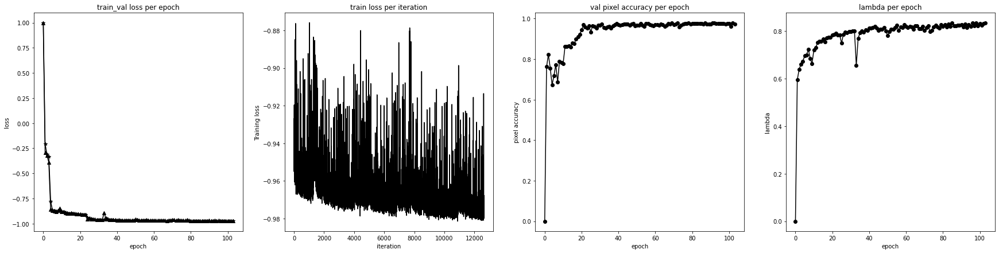

Pixel accuracy average: 77.73806133750335
Dice mean: 0.8187649


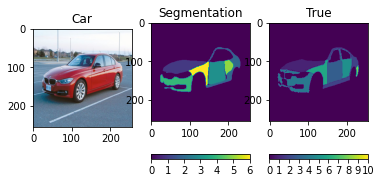

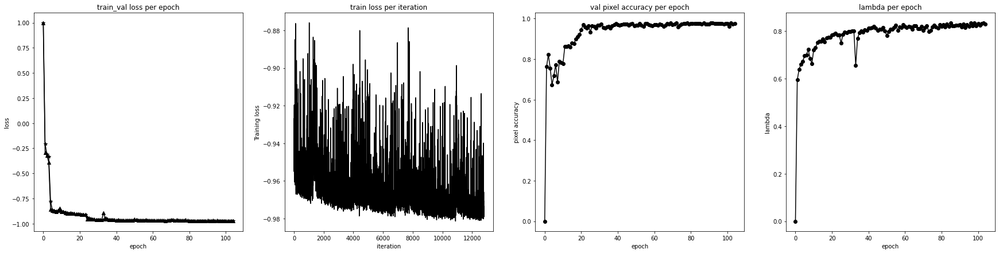

Pixel accuracy average: 78.19382565291555
Dice mean: 0.81996864


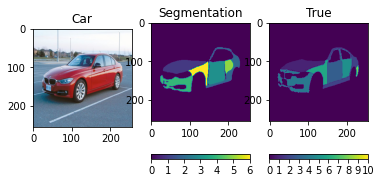

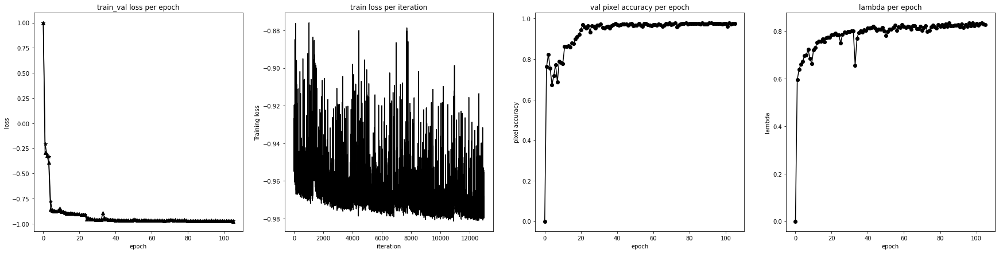

Pixel accuracy average: 77.75099709043273
Dice mean: 0.82241744


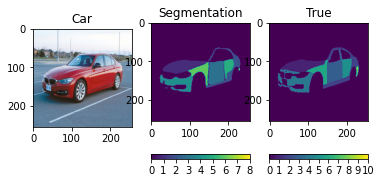

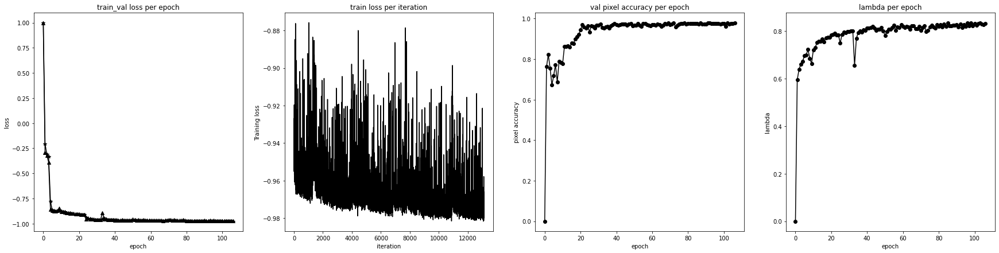

Pixel accuracy average: 78.47666534466786
Dice mean: 0.82745534


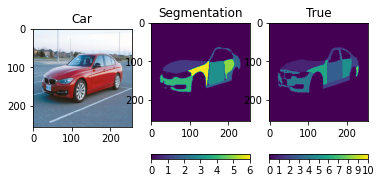

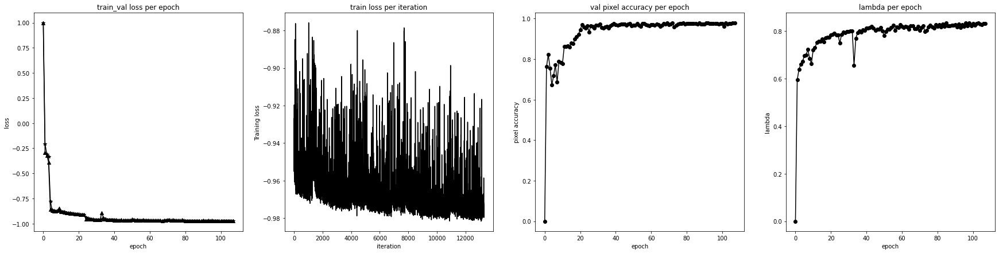

Pixel accuracy average: 76.96751727832672
Dice mean: 0.81305975


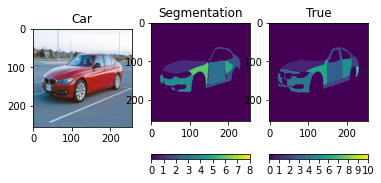

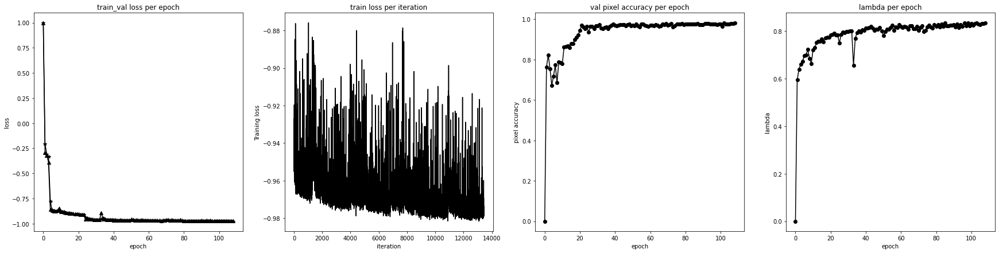

Pixel accuracy average: 78.31246862628016
Dice mean: 0.82590634


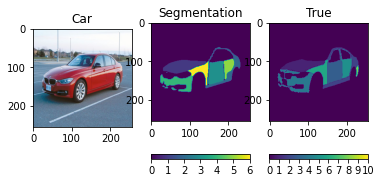

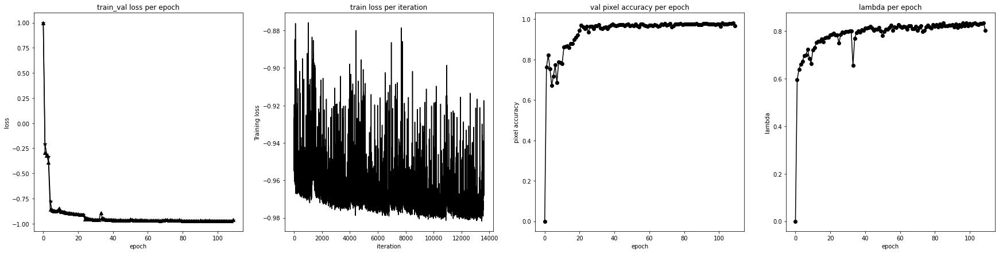

Pixel accuracy average: 68.46074768219344
Dice mean: 0.7763186


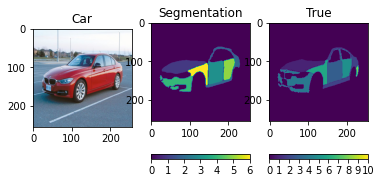

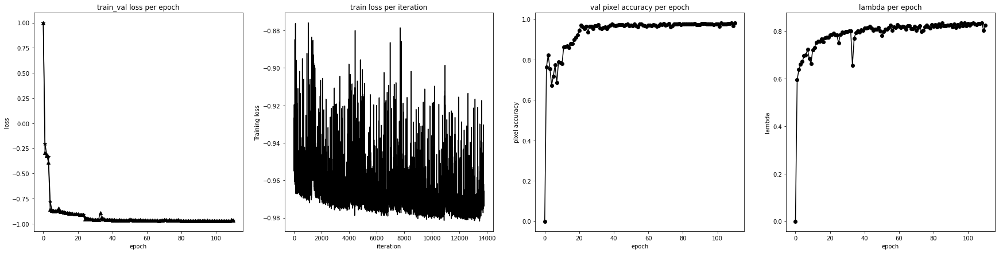

Pixel accuracy average: 75.60612766109989
Dice mean: 0.80563426


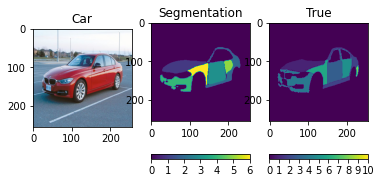

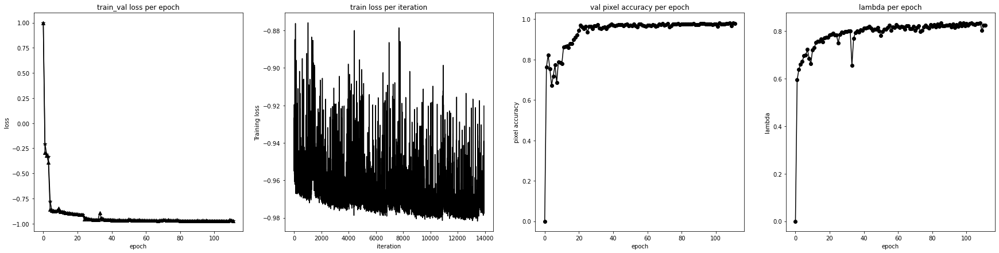

Pixel accuracy average: 75.44289513296428
Dice mean: 0.8154893


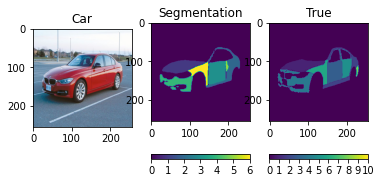

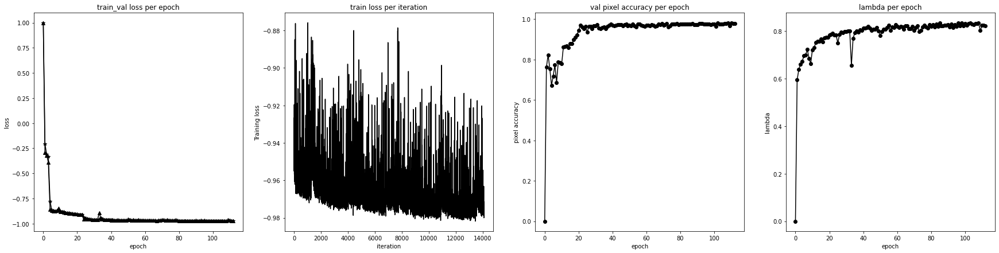

Pixel accuracy average: 71.6176718066373
Dice mean: 0.80506283


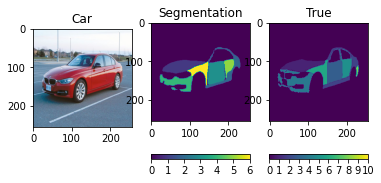

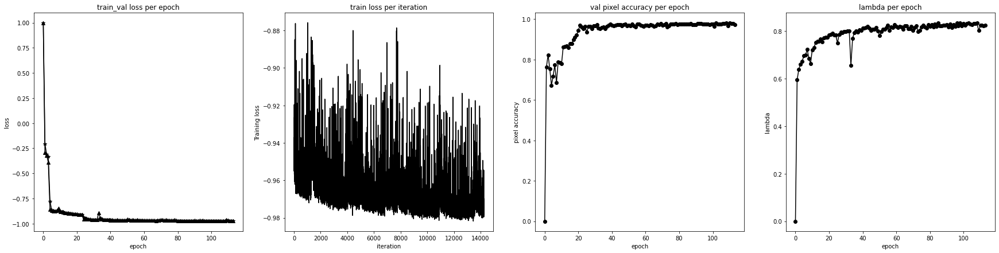

Pixel accuracy average: 76.47790726321954
Dice mean: 0.80941147


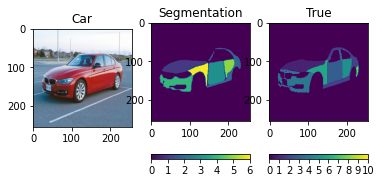

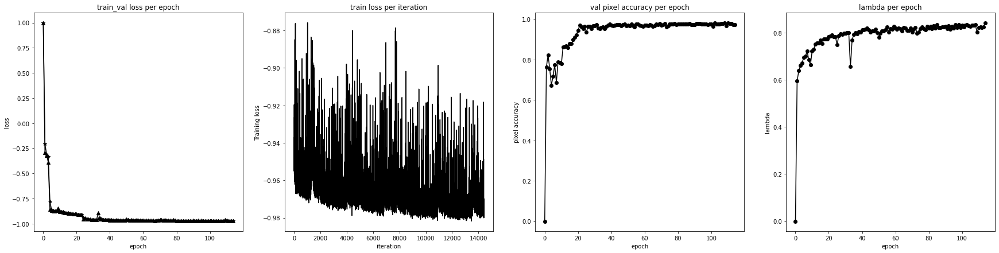

Pixel accuracy average: 76.64177723747001
Dice mean: 0.8109353


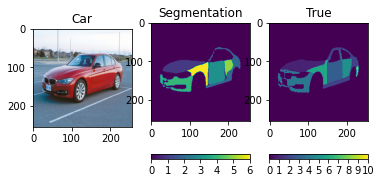

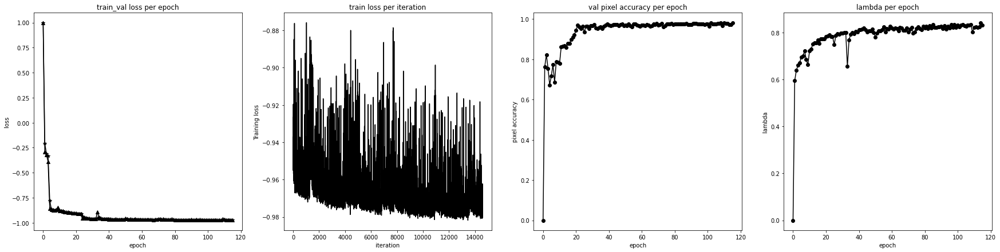

Pixel accuracy average: 76.59362743838464
Dice mean: 0.80943936


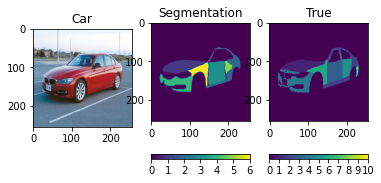

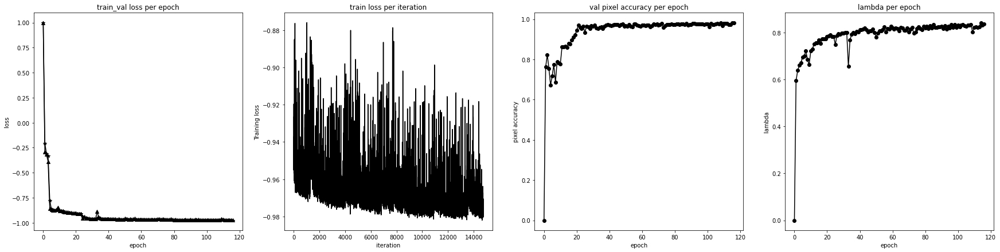

Pixel accuracy average: 76.25814813443122
Dice mean: 0.81132525


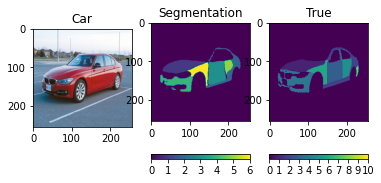

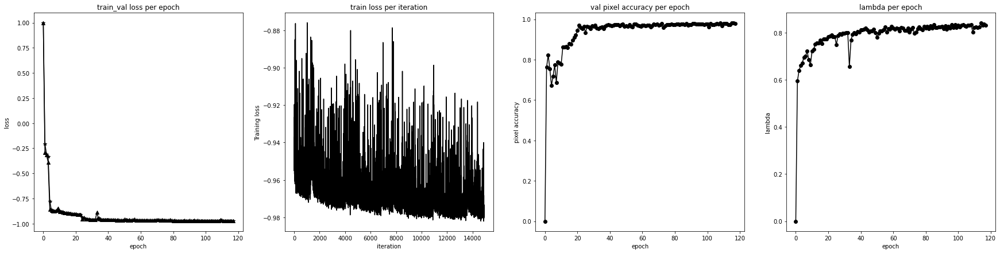

Pixel accuracy average: 78.31948983981944
Dice mean: 0.8244774


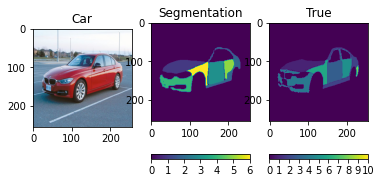

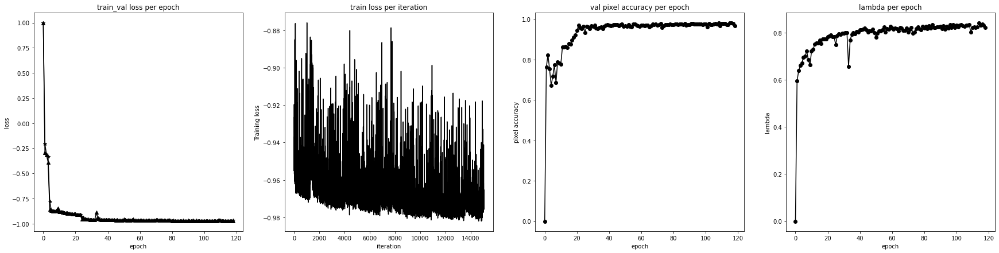

Pixel accuracy average: 75.79557307817157
Dice mean: 0.8138404


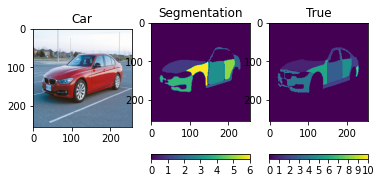

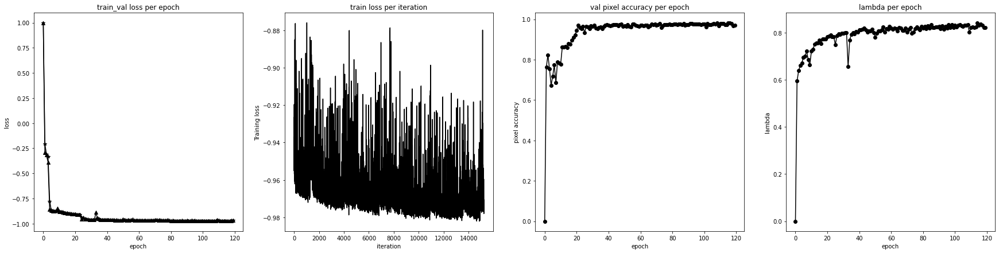

Pixel accuracy average: 77.49621904616798
Dice mean: 0.82340384


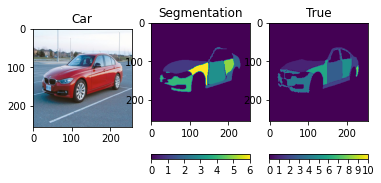

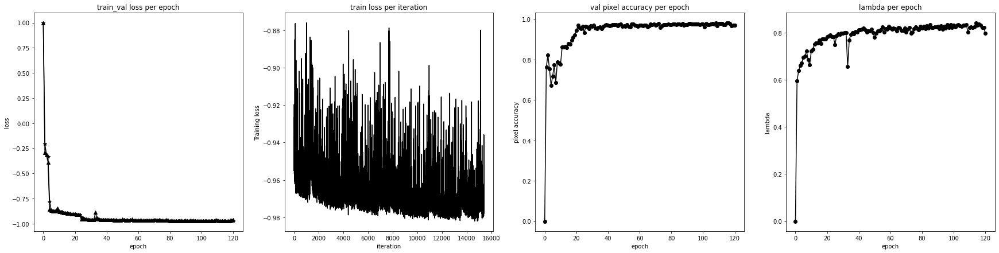

Pixel accuracy average: 75.78474101731099
Dice mean: 0.796083


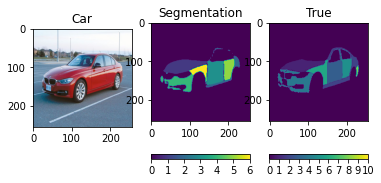

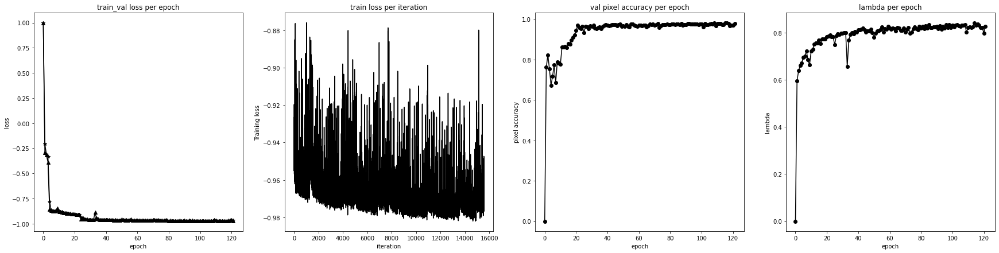

Pixel accuracy average: 76.26733904068817
Dice mean: 0.8155246


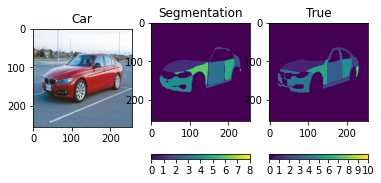

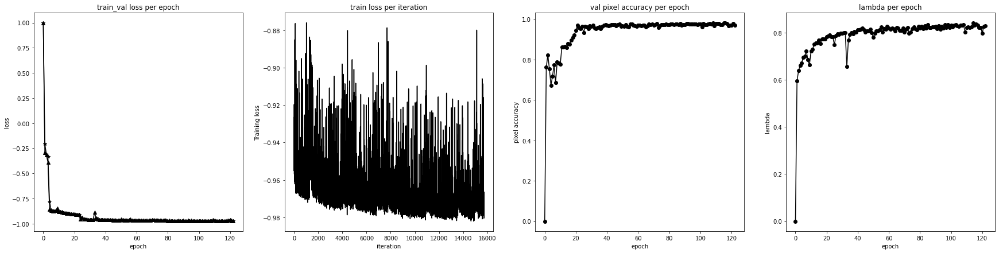

Pixel accuracy average: 75.72297872958153
Dice mean: 0.81474


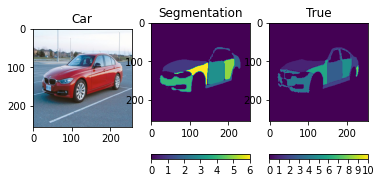

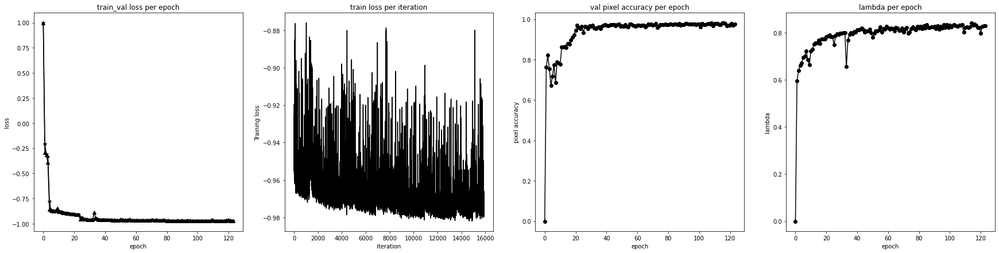

Pixel accuracy average: 76.82222713729381
Dice mean: 0.8119783


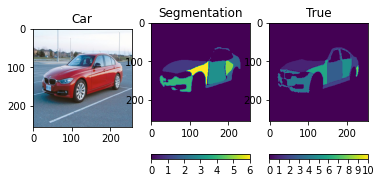

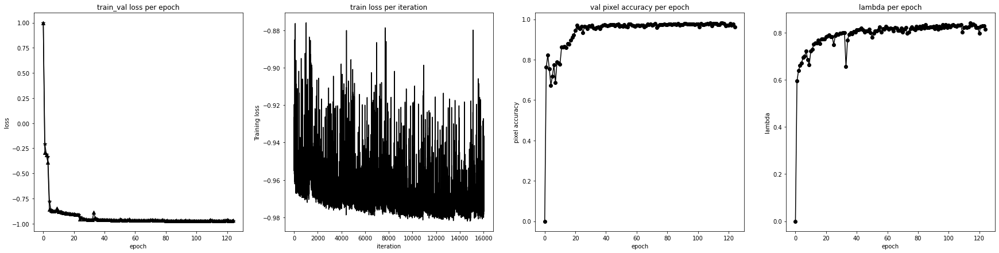

Pixel accuracy average: 76.49344535801583
Dice mean: 0.8116834


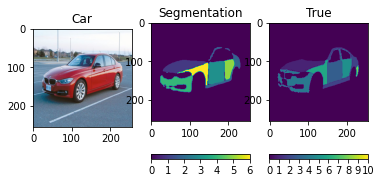

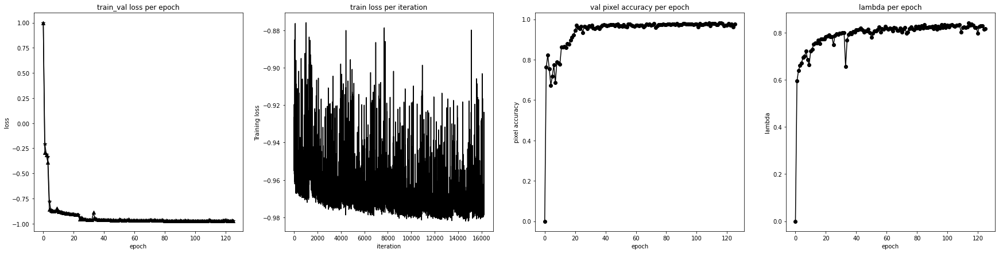

Pixel accuracy average: 76.27568095288771
Dice mean: 0.81761056


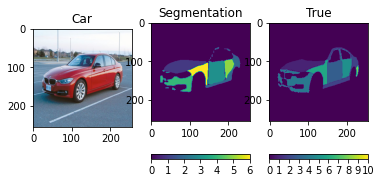

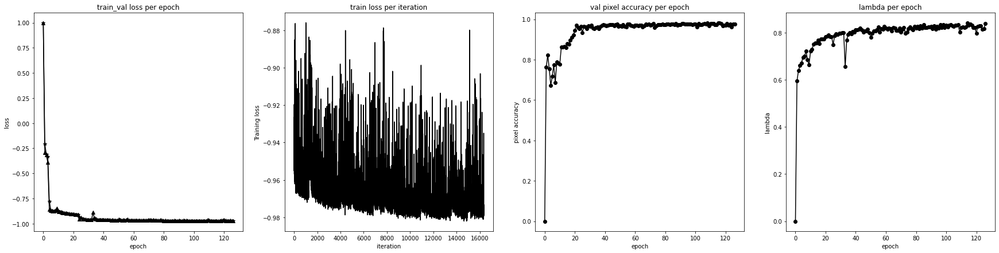

Pixel accuracy average: 76.82373561639022
Dice mean: 0.82144684


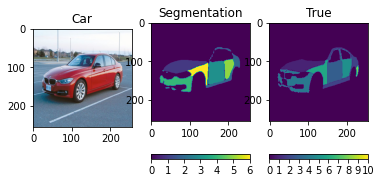

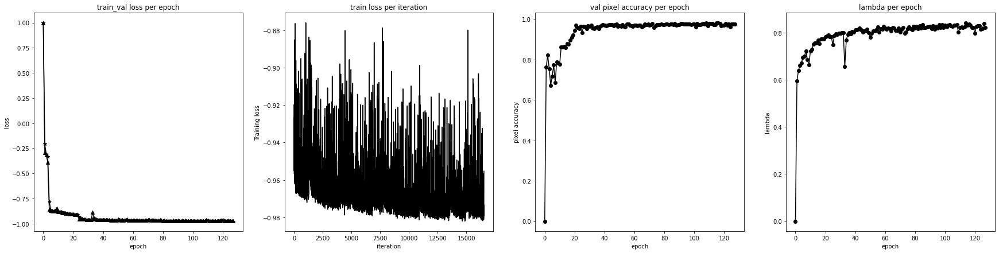

Pixel accuracy average: 76.15881053136032
Dice mean: 0.8140586


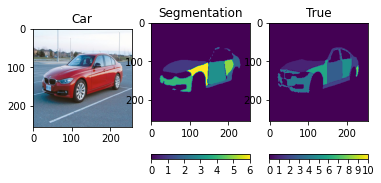

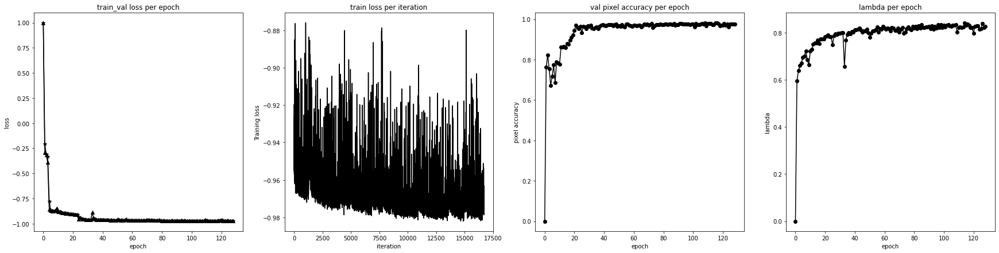

Pixel accuracy average: 75.55798293456157
Dice mean: 0.8096513


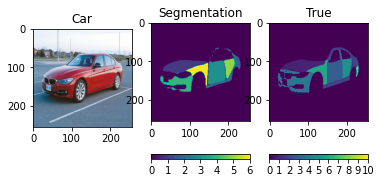

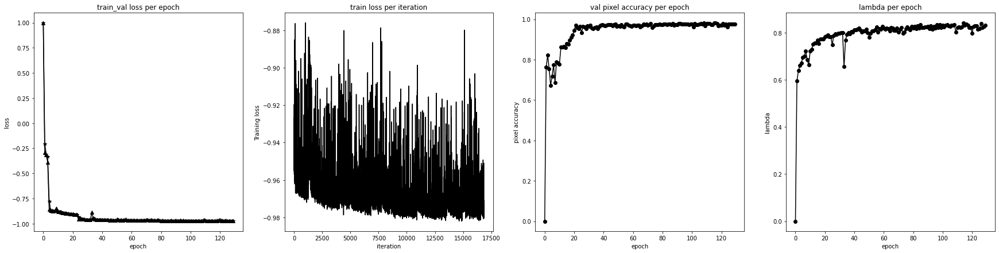

Pixel accuracy average: 75.14875415554364
Dice mean: 0.80942816


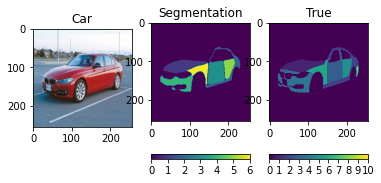

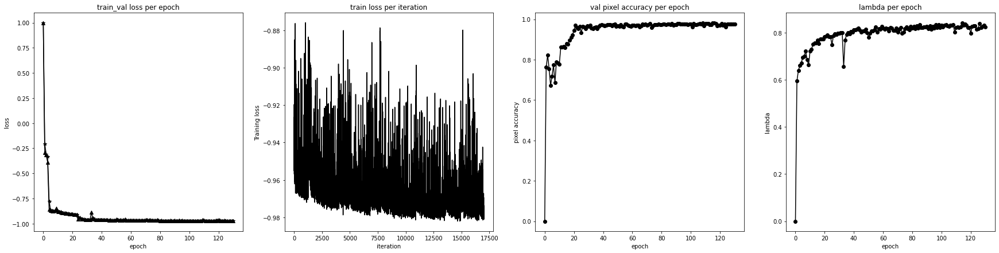

Pixel accuracy average: 75.39610841766978
Dice mean: 0.81279


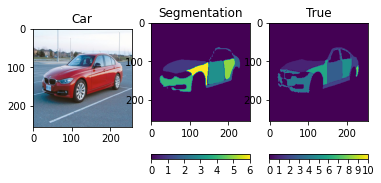

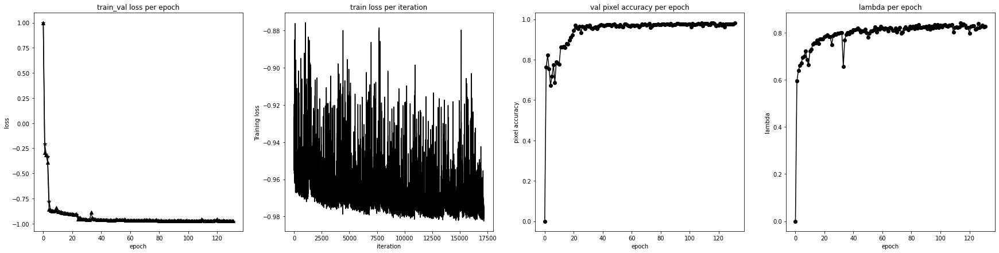

Pixel accuracy average: 74.41317700806682
Dice mean: 0.8073277


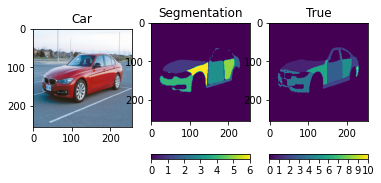

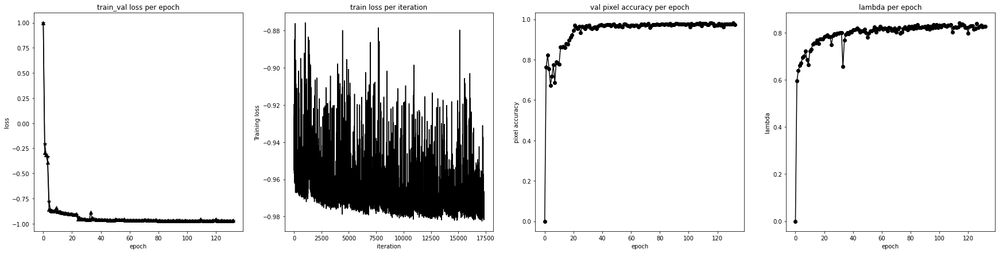

Pixel accuracy average: 76.0781035737554
Dice mean: 0.81564426


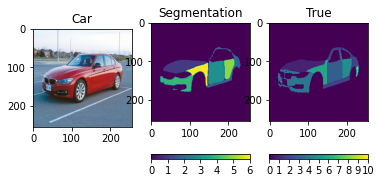

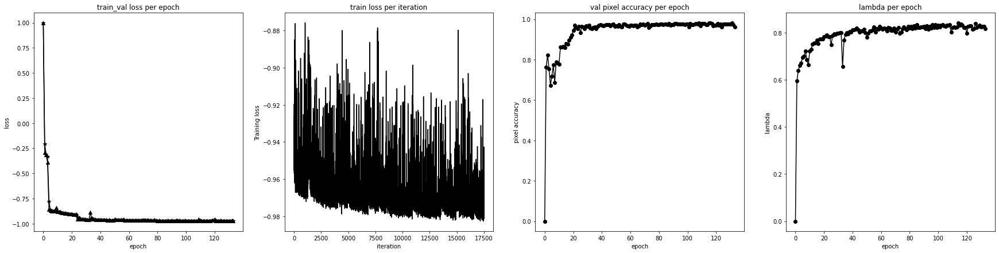

Pixel accuracy average: 76.04373433879154
Dice mean: 0.8180394


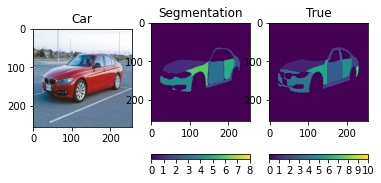

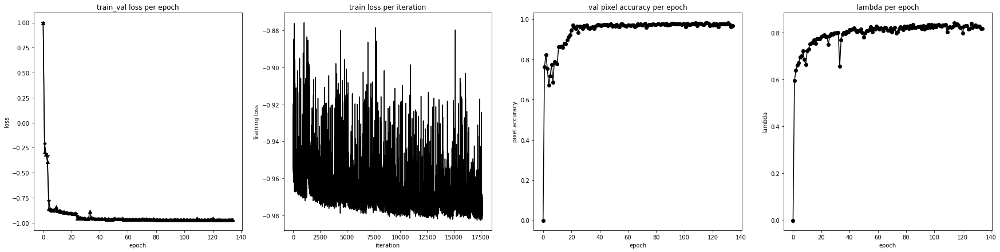

Pixel accuracy average: 74.80128150492901
Dice mean: 0.8104844


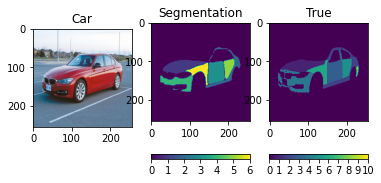

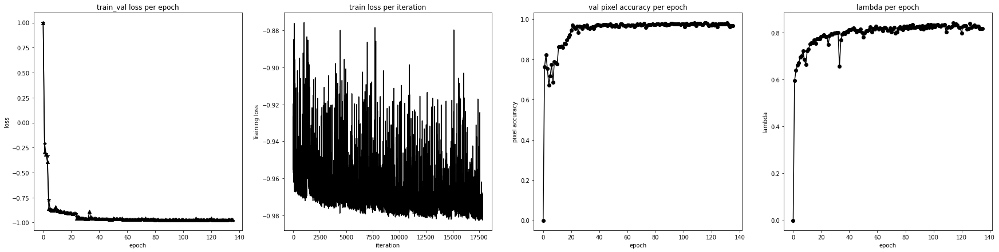

Pixel accuracy average: 72.74051007880921
Dice mean: 0.8021681


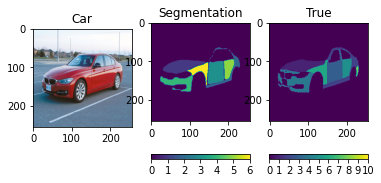

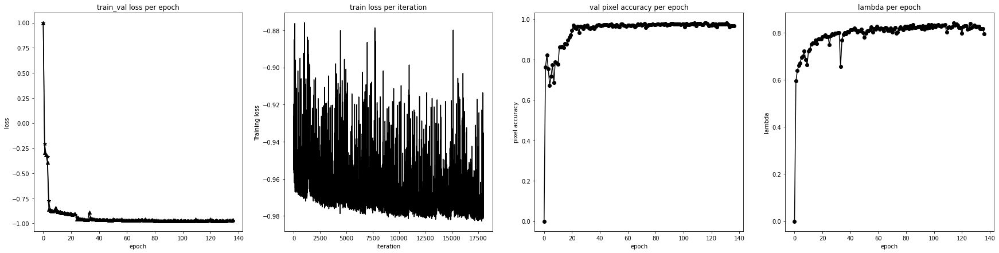

Pixel accuracy average: 70.97260913166899
Dice mean: 0.7924827


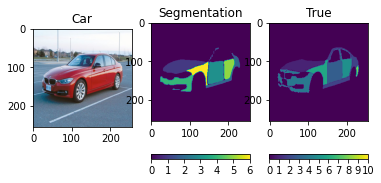

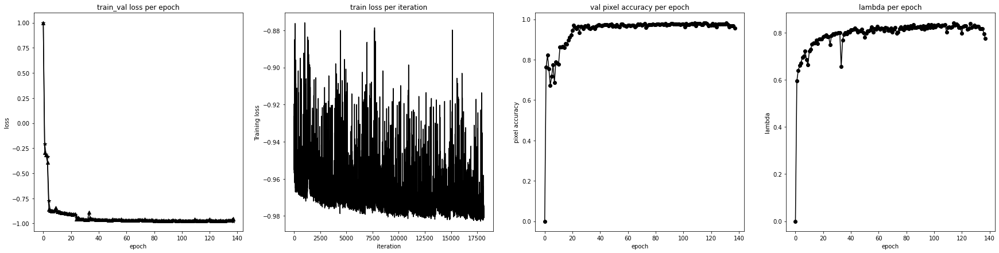

Pixel accuracy average: 70.74292898142357
Dice mean: 0.7917638


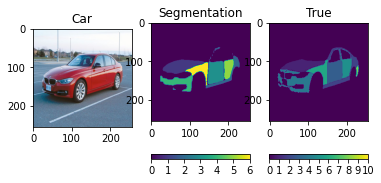

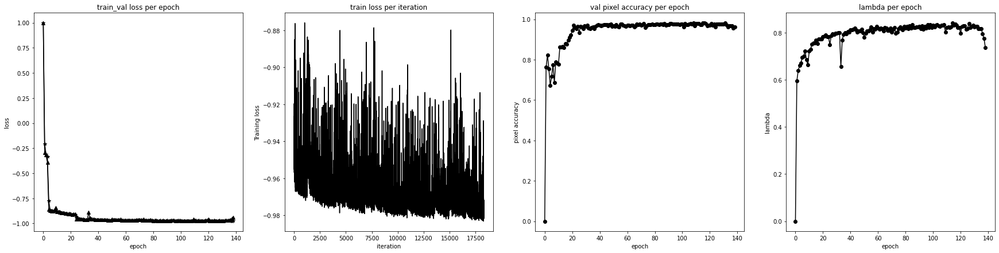

Pixel accuracy average: 68.78261690201943
Dice mean: 0.77472156


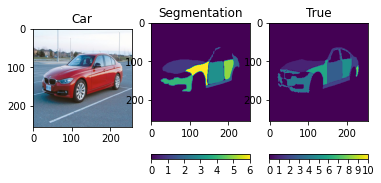

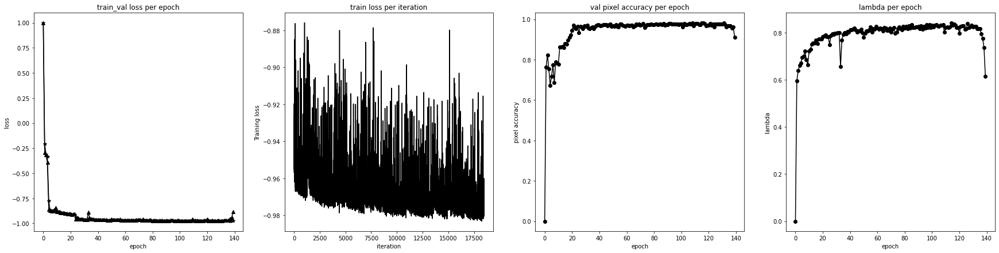

Pixel accuracy average: 60.76742348914615
Dice mean: 0.7191389


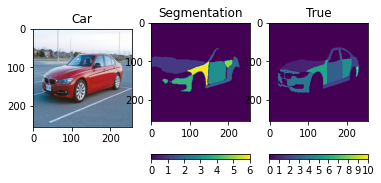

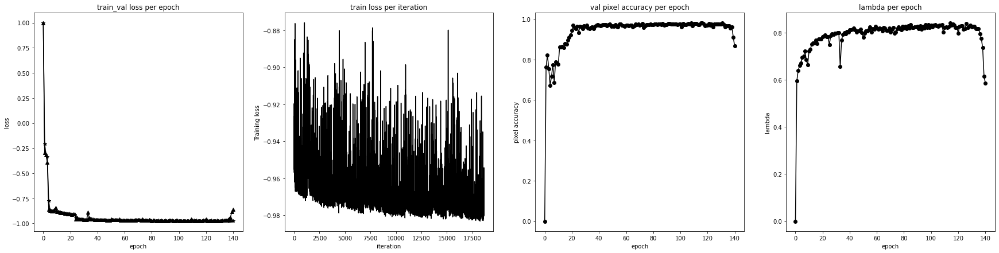

Pixel accuracy average: 55.36850494868175
Dice mean: 0.7070138


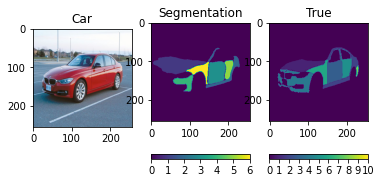

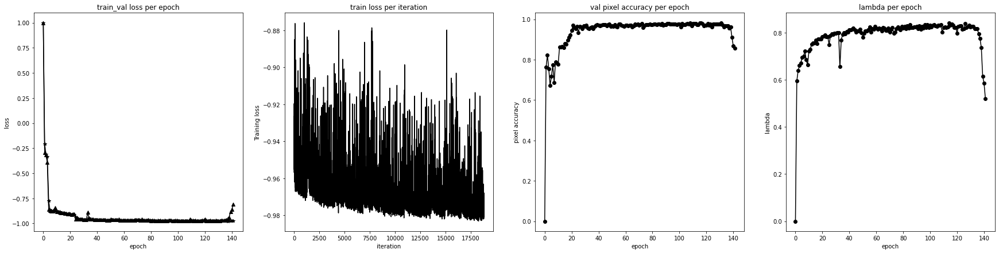

Pixel accuracy average: 30.776133592209334
Dice mean: 0.7196726


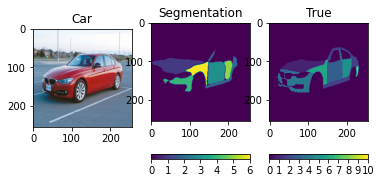

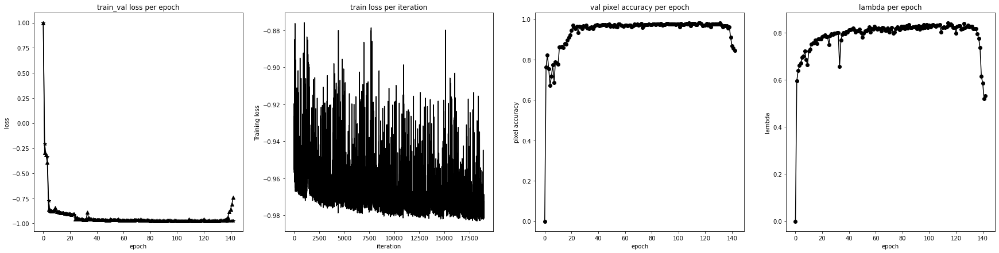

Pixel accuracy average: 15.123444022782442
Dice mean: 0.76819843


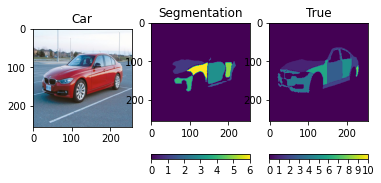

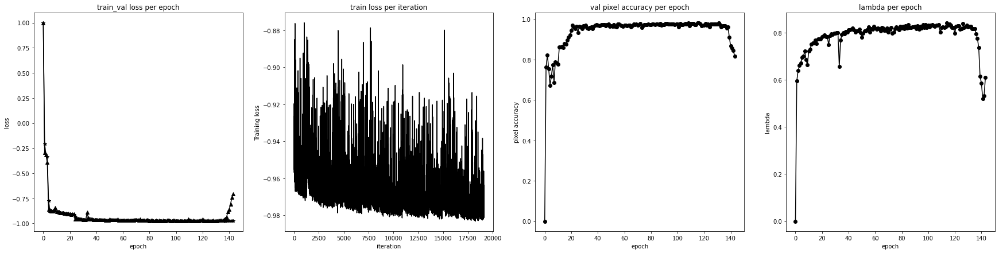

Pixel accuracy average: 5.1868165709128915
Dice mean: 0.7520215


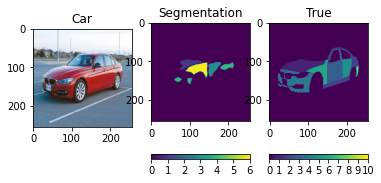

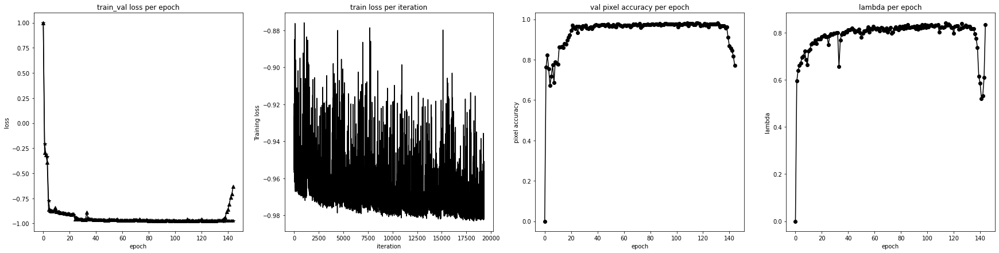

Pixel accuracy average: 0.0
Dice mean: 0.8590396


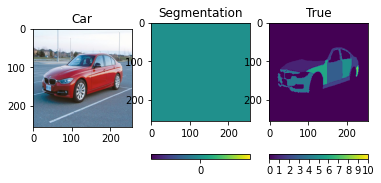

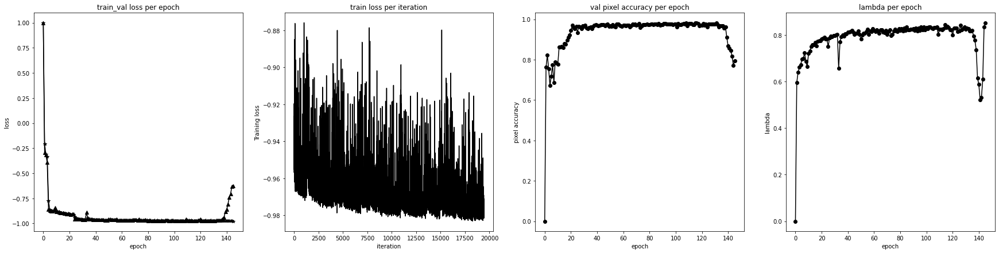

Pixel accuracy average: 0.0
Dice mean: 0.85969514


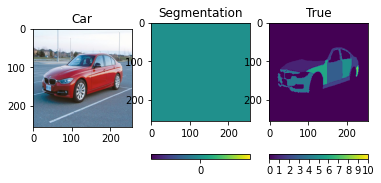

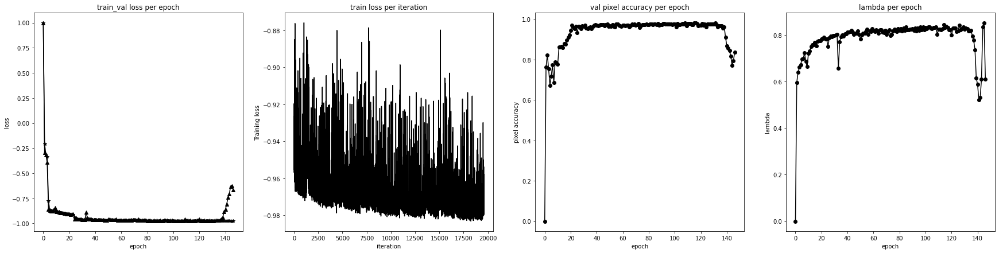

Pixel accuracy average: 5.692295340367546
Dice mean: 0.7790801


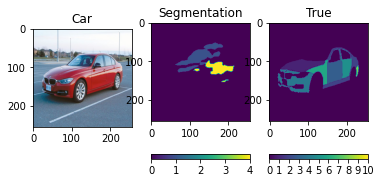

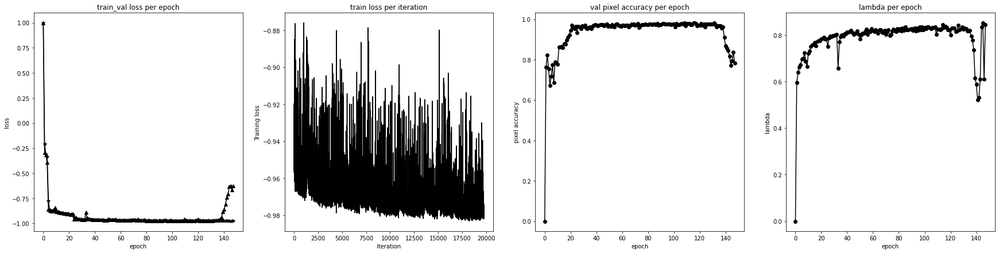

Pixel accuracy average: 1.1208041793730217
Dice mean: 0.81648135


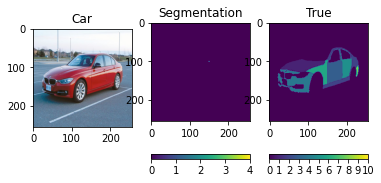

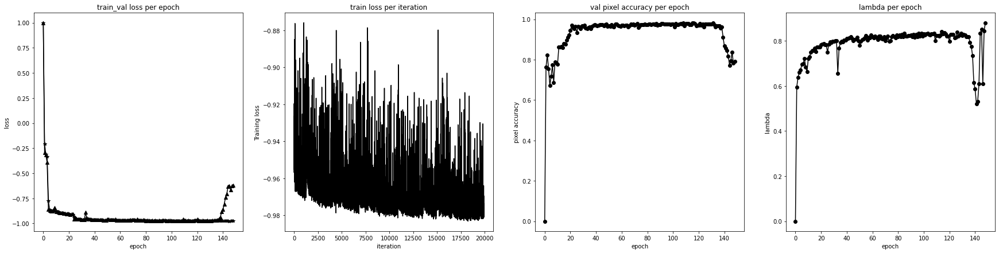

Pixel accuracy average: 0.20472989736235925
Dice mean: 0.85998076


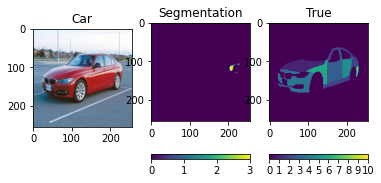

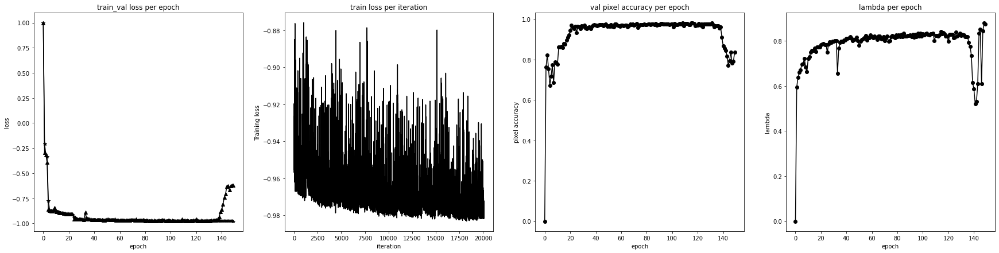

Pixel accuracy average: 1.0142160740348358
Dice mean: 0.8060925


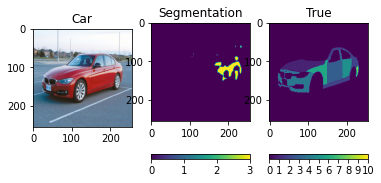

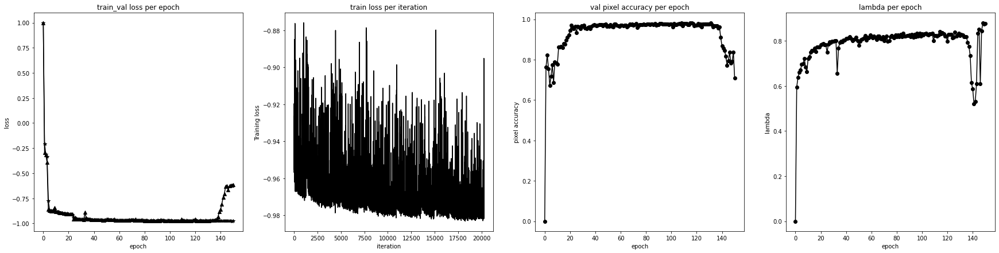

Pixel accuracy average: 0.0
Dice mean: 0.8601907


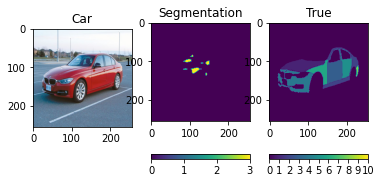

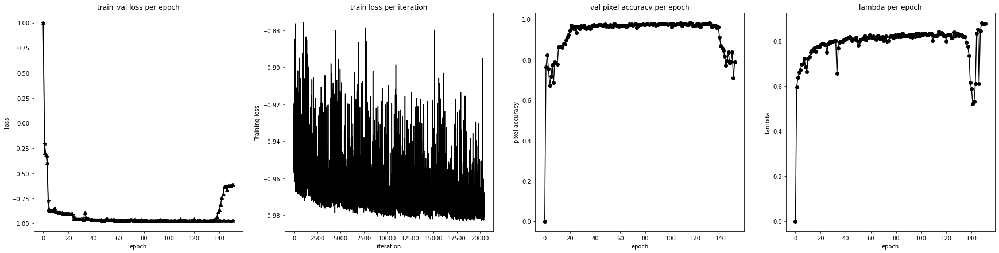

Pixel accuracy average: 0.0
Dice mean: 0.8591812


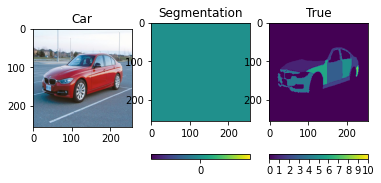

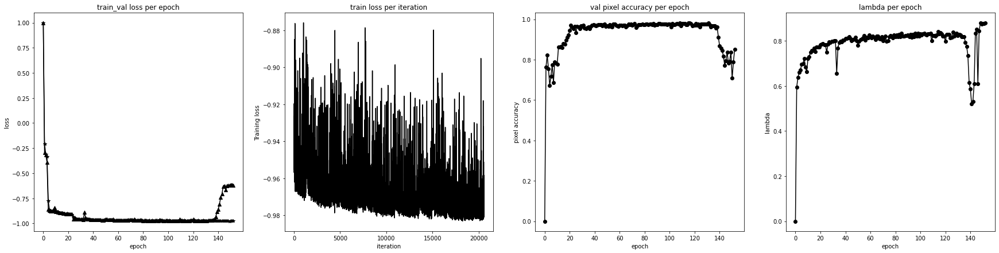

Pixel accuracy average: 0.0
Dice mean: 0.859258


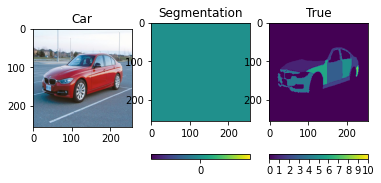

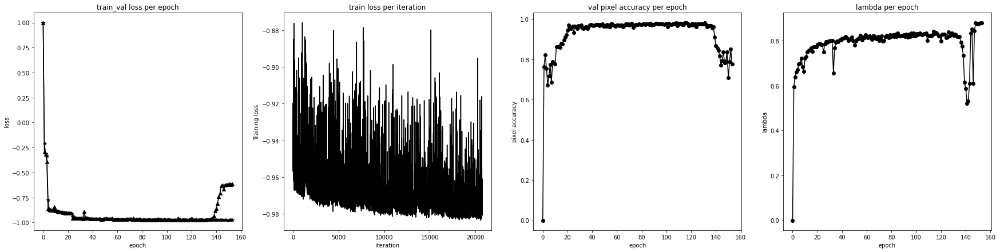

Pixel accuracy average: 0.0
Dice mean: 0.8593659


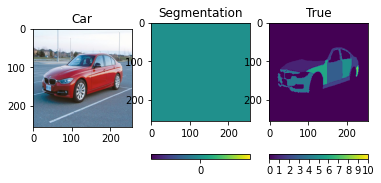

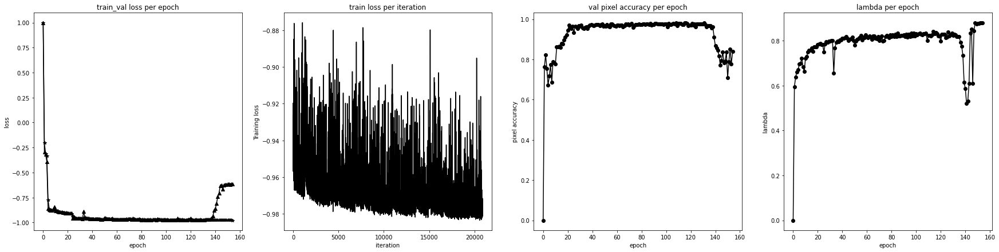

Pixel accuracy average: 0.12356320778051977
Dice mean: 0.8597769


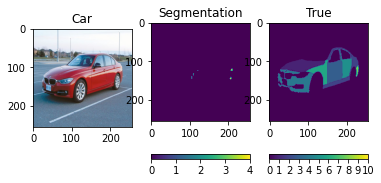

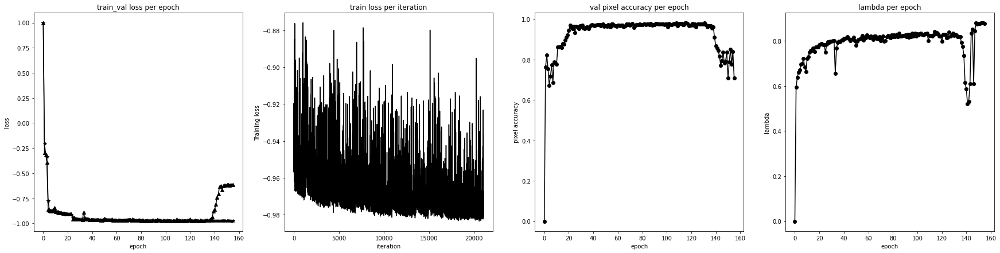

Pixel accuracy average: 0.16622479260499703
Dice mean: 0.8597937


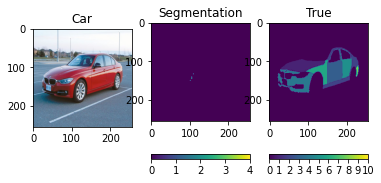

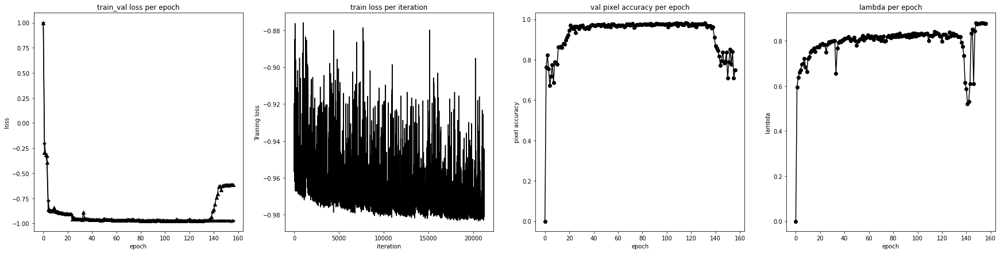

Pixel accuracy average: 0.15678773187781342
Dice mean: 0.86014384


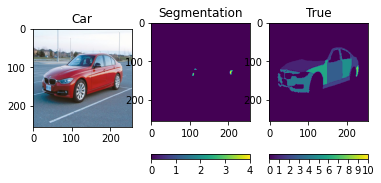

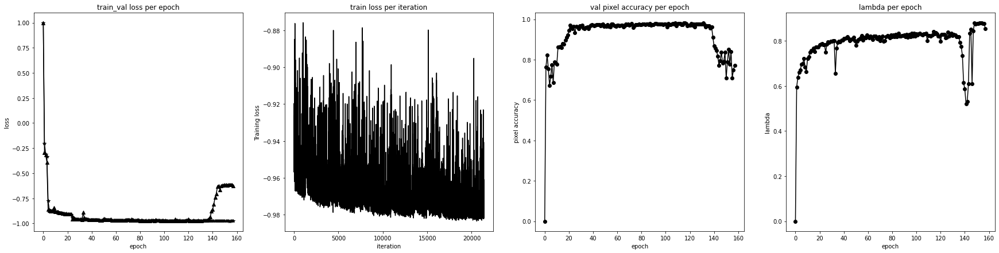

Pixel accuracy average: 7.012469463444493
Dice mean: 0.7697351


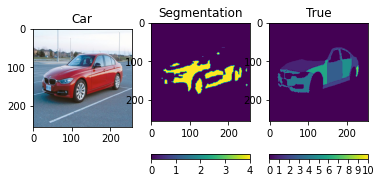

In [ ]:
#@title Trainning

from time import sleep
%matplotlib inline
#Opening test photos

# NOTE! NOTE! change this to not overwrite all log data when you train the model:

num_epochs = 1000
learning_rate = 0.0001
checkpoint= True

backbone='resnet'
l_function ='Dice loss'

network = DeepLab(backbone=backbone, output_stride=16).cuda()

params = add_weight_decay(network, l2_value=0.0001)
optimizer = torch.optim.Adam(network.parameters(), lr=learning_rate)
#optimizer = torch.optim.SGD(network.parameters(), lr=0.1)
#scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.00001, max_lr=0.01,step_size_up=20,mode="triangular", cycle_momentum=False )
scheduler = []

loss_fn = nn.CrossEntropyLoss()
loss_fn1 = build_losses(l_function).cuda()

best_epoch_acc= [0]
best_epoch_loss= [0]
epoch_losses_train = [1]
epoch_losses_val = [1]
batch_losses_train = [1]
batch_losses_val = [1]
epoch_accs = [0]
batch_acc = [0]
Pix_acc = [0]
last_epoch=0
lrs=[]
dice_losses =[1]
dice_val=[0]

    ############################################################################
    # Checkpoint load:
    ############################################################################
if checkpoint is True:
  checkpoint = torch.load(drive_path + 'checkpoint_' + str(backbone) + '_' + str(l_function) + '8.pth.tar')
  last_epoch = checkpoint['epoch'] + 1
  network = checkpoint['network'].cuda()
  optimizer = checkpoint['optimizer']
  epoch_losses_train = checkpoint['epoch_losses_train']
  epoch_losses_val = checkpoint['epoch_losses_val']
  epoch_accs = checkpoint['epoch_accs']
  batch_losses_train = []
  batch_losses_val = []
  loss_fn = nn.CrossEntropyLoss()
  loss_fn1 = build_losses(l_function).cuda()
  scheduler = checkpoint['scheduler']
  lrs = checkpoint['lrs']
  best_epoch_acc = checkpoint['best_epoch_acc']
  best_epoch_loss= checkpoint['best_epoch_loss']
  Pix_acc = checkpoint['Pix_acc']
  dice_losses = checkpoint['dice_losses']
  dice_val = checkpoint['dice_val']



for epoch in range(last_epoch, num_epochs):

    ############################################################################
    # train:
    ############################################################################
    network.train() # (set in training mode, this affects BatchNorm and dropout)
    batch_losses = []
    #train_loader=trainloader
    #for step, (imgs, label_imgs) in enumerate(train_loader):
    for a in enumerate(tqdm(train_loader, desc=' Epoch '+ str(epoch+1) + ', train', leave=True)):
           
            #current_time = time.time()
            #print('{}\r'.format(o))
            imgs=a[1]['car']
            imgs=torch.transpose(imgs,1,3)
            imgs=torch.transpose(imgs,2,3)

            label_imgs=a[1]['mask']

            imgs = Variable(imgs.type(torch.cuda.FloatTensor)).cuda() # (shape: (batch_size, 3, img_h, img_w))
            label_imgs = Variable(label_imgs.type(torch.cuda.LongTensor)).cuda() # (shape: (batch_size, img_h, img_w))

            outputs = network(imgs) # (shape: (batch_size, num_classes, img_h, img_w))

      
            # compute the loss:

            loss = loss_fn1.forward(outputs, label_imgs)
            loss_Ce =loss_fn(outputs, label_imgs)
    
            #loss1 = dice_loss(label_imgs,outputs)
            loss_value = loss.data.cpu().numpy()
            batch_losses.append(loss_value)
            batch_losses_train.append(loss_value)


            # optimization step:
            optimizer.zero_grad() # (reset gradients)
            loss.backward() # (compute gradients)
            optimizer.step() # (perform optimization step)
            #pbar.update()
            #print (time.time() - current_time)

    epoch_loss_train = np.mean(batch_losses)
    epoch_losses_train.append(epoch_loss_train)

    lrs.append(optimizer.param_groups[0]["lr"])
    #scheduler.step()

    ############################################################################
    # val:
    ############################################################################
    network.eval() # (set in evaluation mode, this affects BatchNorm and dropout)
    batch_losses, dice_val_it, dices_val_true = [], [], []

    
    for a in enumerate(tqdm(val_loader, desc=' Epoch '+ str(epoch+1) + ', val', leave=True)):
        imgs=a[1]['car']
        imgs=torch.transpose(imgs,1,3)
        imgs=torch.transpose(imgs,2,3)

        label_imgs=a[1]['mask']
        with torch.no_grad(): # (corresponds to setting volatile=True in all variables, this is done during inference to reduce memory consumption)
            imgs = Variable(imgs.type(torch.cuda.FloatTensor)).cuda() # (shape: (batch_size, 3, img_h, img_w))
            label_imgs = Variable(label_imgs.type(torch.cuda.LongTensor)).cuda() # (shape: (batch_size, img_h, img_w))
            #print('tipy_inside',imgs.type())
            outputs = network(imgs) # (shape: (batch_size, num_classes, img_h, img_w))
            

            # compute the loss:
            loss = loss_fn1.forward(outputs, label_imgs)
            loss_Ce =loss_fn(outputs, label_imgs)
            #loss1 = dice_loss(label_imgs,outputs)
            loss_value = loss.data.cpu().numpy()
            batch_losses.append(loss_value)
            batch_losses_val.append(loss_value)

            dice2 =dice_loss(label_imgs,outputs)

            dice_true= np.mean(dice2.cpu().detach().numpy(),1) > 0.25
            dice_Rect=np.mean(np.mean(dice2.cpu().detach().numpy(),1)[dice_true])
            dices_val_true.append(dice_Rect)

            dice_val_it.append(np.mean(dice2.cpu().detach().numpy()))

            acc = multi_acc(outputs,label_imgs).cpu().numpy()
            batch_acc.append(acc)
    
    dice_val.append(np.mean(dices_val_true))
    epoch_loss_val = np.mean(batch_losses)
    epoch_losses_val.append(epoch_loss_val)
    epoch_acc = np.mean(acc)
    epoch_accs.append(epoch_acc/100)
    #dice_val.append(np.mean(dice_val_it))


#    with open("%s/epoch_losses_val.pkl" % network.model_dir, "wb") as file:
 #       pickle.dump(epoch_losses_val, file)
    plt.close()

    fig, ax = plt.subplots(1,4,figsize=(30,7))
    ax[0].plot(epoch_losses_val, "k")
    ax[0].plot(epoch_losses_train, "k")
    ax[0].plot(epoch_losses_val, "k^")
    ax[0].plot(epoch_losses_train, "k*")
    ax[0].set_ylabel("loss")
    ax[0].set_xlabel("epoch")
    ax[0].set_title("train_val loss per epoch")

    ax[1].plot(batch_losses_train, "k")
    ax[1].set_ylabel("Training loss")
    ax[1].set_xlabel("iteration")
    ax[1].set_title("train loss per iteration")

    ax[2].plot(epoch_accs, "ko")
    ax[2].plot(epoch_accs, "k")
    ax[2].set_ylabel("pixel accuracy")
    ax[2].set_xlabel("epoch")
    ax[2].set_title("val pixel accuracy per epoch")


    ax[3].plot(dice_val, "ko")
    ax[3].plot(dice_val, "k")
    ax[3].set_ylabel("lambda")
    ax[3].set_xlabel("epoch")
    ax[3].set_title("lambda per epoch")
    plt.show()
    fig.savefig(drive_path+"plot" + str(backbone) + '_' + str(l_function) + "_ungly8.png" )

    #print('Dice_loss',loss1)
    # save the model weights to disk:





    ##################### Test ##########################
    pix_acc_epoch, dices = [], []
    for i in range(len(cars)):
      #print('### test car ' + str(i) + ' ###')
      xx=network(cars[i])

      xx=xx[0,0:9,:,:]
      xx2 = torch.reshape(xx,(1, xx.shape[0], xx.shape[1],xx.shape[2]))
      image_ma22 = torch.from_numpy(masks[i])
      image_ma22 = Variable(image_ma22.type(torch.cuda.LongTensor))
      image_ma223 = torch.reshape(image_ma22,(1,1,image_ma22.shape[0],image_ma22.shape[1]))
      #acc_test=multi_acc(xx,image_ma22).cpu().numpy()

      dice2 =dice_loss(image_ma223,xx2)
      
      #print('dice coefficient :' , dice2)
      dice_true= dice2.cpu().detach().numpy() > 0.25
      dice_Rect=np.mean(dice2.cpu().detach().numpy()[dice_true])

      dices.append(dice_Rect)


      xx = xx.argmax(0).cpu()
      a=image_ma22.cpu() 
      b=xx.cpu() 
      pix_acc_it= pixel_accuracy(b,a)*100
      pix_acc_epoch.append(pix_acc_it)
      
      #print(f'Pixel accuracy epoch {epoch}: {epoch_acc} %')
      #print('Pixel accuracy (only the car):' ,pix_acc_it, ' %')
      #print(f'Pixel accuracy test( with background)): {acc_test}%')

      #print('Classes ground truth:', np.unique(masks[i]))
      #print('Classes predicted: ', np.unique(xx))
    
    pix_acc_epoch=np.mean(pix_acc_epoch)                  
    print('Pixel accuracy average:', pix_acc_epoch)
    print('Dice mean:', np.mean(dices))
    
    Pix_acc.append(pix_acc_epoch)
    dice_losses.append(np.mean(dices))
    
    ax[2].plot(Pix_acc, "k^")
    ax[2].plot(Pix_acc, "k")
    ############################################################################
    ##CheckPoint##  
    ############################################################################

    if epoch_losses_val[epoch] < epoch_losses_val[best_epoch_loss[-1]]:
        best_epoch_loss.append(epoch)
    if Pix_acc[epoch] > Pix_acc[best_epoch_acc[-1]]:
        best_epoch_acc.append(epoch)
          
    save_checkpoint(backbone,l_function,epoch, network, optimizer, 
                    epoch_losses_train, epoch_losses_val, Pix_acc, 
                    lrs, scheduler, best_epoch_loss, best_epoch_acc, dice_losses, dice_val)

    with open(drive_path +backbone+'_'+l_function+"_results.csv",'a+', newline='') as csv_file:
      writer = csv.writer(csv_file, delimiter=',')
      writer.writerow([epoch_loss_train,epoch_loss_val,lrs[-1], pix_acc_epoch, best_epoch_acc[-1],best_epoch_loss[-1], dice_losses[-1]])
    
    fig = plt.figure()
    ax = fig.add_subplot(1, 3, 1)
    imgplot = plt.imshow(image_ti, vmin=0, vmax=10)
    ax.set_title('Car')
    ax = fig.add_subplot(1, 3, 2)
    imgplot = plt.imshow(xx)
    ax.set_title('Segmentation')
    plt.colorbar(ticks=[0,1,2,3,4,5,6,7,8,9,10], orientation='horizontal')
    ax = fig.add_subplot(1, 3, 3)
    imgplot = plt.imshow(image_ma2, vmin=0, vmax=10)
    ax.set_title('True')
    plt.colorbar( ticks=[0,1,2,3,4,5,6,7,8,9,10], orientation='horizontal')
    plt.show()



In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns

df=pd.read_csv(drive_path +backbone+'_'+l_function+"_results.csv")
df.columns = ["Train loss", "Val loss", "lrs", "pix acc", "best_epoch wrt acc", "best_epoch wrt loss", "dice loss" ]



In [ ]:
df_grouped=df.groupby('lrs').mean()

sns.lineplot(data=df_grouped, y="Train loss", x="lrs")
sns.lineplot(data=df_grouped, y="Val loss", x="lrs")
df_grouped.head(20)